In [35]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/credit-card-data-set/credit_card_approval.csv


# Importing Libraries

In [36]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import itertools
import plotly.graph_objects as go

from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score
from sklearn.model_selection import GridSearchCV, cross_validate
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn import tree
from sklearn.ensemble import AdaBoostClassifier, GradientBoostingClassifier
from sklearn.preprocessing import StandardScaler, RobustScaler
from sklearn.impute import KNNImputer
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier

import warnings
warnings.simplefilter(action="ignore")

In [37]:
pd.set_option('display.max_columns', None)
pd.set_option('display.width', None)
pd.set_option('display.max_rows', 20)
pd.set_option('display.float_format', lambda x: '%.3f' % x)

In [137]:
df = pd.read_csv("/kaggle/input/credit-card-data-set/credit_card_approval.csv")

In [39]:
df.head(10)

,ID,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,DAYS_BIRTH,DAYS_EMPLOYED,FLAG_MOBIL,FLAG_WORK_PHONE,FLAG_PHONE,FLAG_EMAIL,JOB,BEGIN_MONTHS,STATUS,TARGET
0,5065438,F,Y,N,2+ children,270000.000,Secondary / secondary special,Married,With parents,-13258,-2300,1,0,0,0,Managers,-6,C,0
1,5142753,F,N,N,No children,81000.000,Secondary / secondary special,Single / not married,House / apartment,-17876,-377,1,1,1,0,Private service staff,-4,0,0
2,5111146,M,Y,Y,No children,270000.000,Higher education,Married,House / apartment,-19579,-1028,1,0,1,0,Laborers,0,C,0
3,5010310,F,Y,Y,1 children,112500.000,Secondary / secondary special,Married,House / apartment,-15109,-1956,1,0,0,0,Core staff,-3,0,0
4,5010835,M,Y,Y,2+ children,139500.000,Secondary / secondary special,Married,House / apartment,-17281,-5578,1,1,0,0,Drivers,-29,0,0
5,5067057,F,Y,Y,No children,144000.000,Secondary / secondary special,Married,House / apartment,-15394,-2959,1,0,1,0,Core staff,-25,0,0
6,5095635,M,Y,N,1 children,180000.000,Higher education,Married,House / apartment,-11178,-219,1,0,0,0,Drivers,-19,X,0
7,5096402,M,Y,N,No children,405000.000,Higher education,Married,House / apartment,-18655,-3200,1,1,1,0,High skill tech staff,-18,X,0
8,5061372,F,N,Y,1 children,135000.000,Secondary / secondary special,Single / not married,House / apartment,-17068,-8325,1,0,0,0,Laborers,-43,0,0
9,5026464,F,N,Y,1 children,270000.000,Secondary / secondary special,Married,House / apartment,-16616,-2722,1,1,1,0,Realty agents,-38,0,0


In [40]:
df.tail(10)

,ID,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,DAYS_BIRTH,DAYS_EMPLOYED,FLAG_MOBIL,FLAG_WORK_PHONE,FLAG_PHONE,FLAG_EMAIL,JOB,BEGIN_MONTHS,STATUS,TARGET
537657,5096932,F,N,N,No children,135000.000,Higher education,Married,House / apartment,-14185,-4447,1,1,0,0,Core staff,-35,C,0
537658,5062686,M,Y,Y,No children,247500.000,Secondary / secondary special,Married,Municipal apartment,-20112,-875,1,1,0,1,High skill tech staff,-13,C,0
537659,5061582,F,N,Y,No children,495000.000,Higher education,Married,House / apartment,-19682,-3880,1,0,1,1,Managers,-8,C,0
537660,5033436,F,N,N,No children,315000.000,Incomplete higher,Single / not married,With parents,-9746,-1268,1,0,1,0,Medicine staff,-5,C,0
537661,5029579,M,Y,Y,No children,202500.000,Secondary / secondary special,Civil marriage,House / apartment,-15973,-2026,1,0,0,1,Drivers,-13,0,0
537662,5142999,M,Y,N,1 children,166500.000,Secondary / secondary special,Married,With parents,-12372,-5401,1,0,1,0,Core staff,-8,0,0
537663,5010773,F,N,Y,No children,135000.000,Higher education,Married,With parents,-14160,-4635,1,0,0,0,Sales staff,-8,0,0
537664,5105601,M,N,Y,No children,180000.000,Higher education,Married,House / apartment,-24204,-2462,1,0,0,0,Private service staff,-7,0,0
537665,5132833,M,Y,N,No children,220500.000,Secondary / secondary special,Married,House / apartment,-22647,-3847,1,0,1,0,Laborers,-1,0,0
537666,5135381,F,N,Y,No children,387000.000,Secondary / secondary special,Married,House / apartment,-20082,-4979,1,0,0,0,Sales staff,-45,C,0


In [ ]:
# def check_df(dataframe, head=5):    
    # print("##################### Quantiles #####################")
    # print(dataframe.quantile([0, 0.05, 0.50, 0.95, 0.99, 1]).T)  
# check_df(df)
#sayısala dönüştürme sonrası bu işlem yapılacak

In [41]:
def check_df(dataframe, head=5):
    print("##################### Shape #####################")
    print(dataframe.shape)
    print("##################### Types #####################")
    print(dataframe.dtypes)
    print("##################### Head #####################")
    print(dataframe.head(head))
    print("##################### Tail #####################")
    print(dataframe.tail(head))
    print("##################### NA #####################")
    print(dataframe.isnull().sum())

check_df(df)

##################### Shape #####################
(537667, 19)
##################### Types #####################
ID                       int64
CODE_GENDER             object
FLAG_OWN_CAR            object
FLAG_OWN_REALTY         object
CNT_CHILDREN            object
AMT_INCOME_TOTAL       float64
NAME_EDUCATION_TYPE     object
NAME_FAMILY_STATUS      object
NAME_HOUSING_TYPE       object
DAYS_BIRTH               int64
DAYS_EMPLOYED            int64
FLAG_MOBIL               int64
FLAG_WORK_PHONE          int64
FLAG_PHONE               int64
FLAG_EMAIL               int64
JOB                     object
BEGIN_MONTHS             int64
STATUS                  object
TARGET                   int64
dtype: object
##################### Head #####################
        ID CODE_GENDER FLAG_OWN_CAR FLAG_OWN_REALTY CNT_CHILDREN  \
0  5065438           F            Y               N  2+ children   
1  5142753           F            N               N  No children   
2  5111146           M         

In [138]:
def grab_col_names(dataframe, cat_th=10, car_th=20):
    """

    Returns the names of categorical, numeric and categorical but cardinal variables in the data set.
    Note Categorical variables include categorical variables with numeric appearance.

    Parameters
    ------
        dataframe: dataframe
                Variable names of the dataframe to be taken
        cat_th: int, optional
                class threshold for numeric but categorical variables
        car_th: int, optinal
                class threshold for categorical but cardinal variables

    Returns
    ------
        cat_cols: list
                Categorical variable list
        num_cols: list
                Numeric variable list
        cat_but_car: list
                List of cardinal variables with categorical appearance

    Examples
    ------
        import seaborn as sns
        df = sns.load_dataset("iris")
        print(grab_col_names(df))


    Notes
    ------
        cat_cols + num_cols + cat_but_car = total number of variables
        num_but_cat is inside cat_cols.
        The sum of the 3 return lists equals the total number of variables: cat_cols + num_cols + cat_but_car = number of variables

    """

    # cat_cols, cat_but_car
    cat_cols = [col for col in dataframe.columns if dataframe[col].dtypes == "O"] 

    num_but_cat = [col for col in dataframe.columns if dataframe[col].nunique() < cat_th and
                   dataframe[col].dtypes != "O"]

    cat_but_car = [col for col in dataframe.columns if dataframe[col].nunique() > car_th and
                   dataframe[col].dtypes == "O"]

    cat_cols = cat_cols + num_but_cat

    cat_cols = [col for col in cat_cols if col not in cat_but_car] 

    num_cols = [col for col in dataframe.columns if dataframe[col].dtypes != "O"] 

    num_cols = [col for col in num_cols if col not in num_but_cat] 
    
    print(f"Observations: {dataframe.shape[0]}") 
    print(f"Variables: {dataframe.shape[1]}") 
    print(f'cat_cols: {len(cat_cols)}') 
    print(f'num_cols: {len(num_cols)}') 
    print(f'cat_but_car: {len(cat_but_car)}') 
    print(f'num_but_cat: {len(num_but_cat)}') 


    return cat_cols, num_cols, cat_but_car, num_but_cat

In [139]:
cat_cols, num_cols, cat_but_car,  num_but_cat = grab_col_names(df)

Observations: 537667
Variables: 19
cat_cols: 14
num_cols: 5
cat_but_car: 0
num_but_cat: 5


In [140]:
cat_cols

['CODE_GENDER',
 'FLAG_OWN_CAR',
 'FLAG_OWN_REALTY',
 'CNT_CHILDREN',
 'NAME_EDUCATION_TYPE',
 'NAME_FAMILY_STATUS',
 'NAME_HOUSING_TYPE',
 'JOB',
 'STATUS',
 'FLAG_MOBIL',
 'FLAG_WORK_PHONE',
 'FLAG_PHONE',
 'FLAG_EMAIL',
 'TARGET']

In [141]:
num_cols

['ID', 'AMT_INCOME_TOTAL', 'DAYS_BIRTH', 'DAYS_EMPLOYED', 'BEGIN_MONTHS']

In [142]:
cat_but_car

[]

In [143]:
num_but_cat

['FLAG_MOBIL', 'FLAG_WORK_PHONE', 'FLAG_PHONE', 'FLAG_EMAIL', 'TARGET']

# Analysis of Categorical Variables

In [48]:
def cat_summary(dataframe, col_name, plot=False):
    print(pd.DataFrame({col_name: dataframe[col_name].value_counts(),
                        "Ratio": 100 * dataframe[col_name].value_counts() / len(dataframe)}))
    print("##########################################")
    if plot:
        sns.countplot(x=dataframe[col_name], data=dataframe)
        plt.show(block=True)

             CODE_GENDER  Ratio
CODE_GENDER                    
F                 333832 62.089
M                 203835 37.911
##########################################


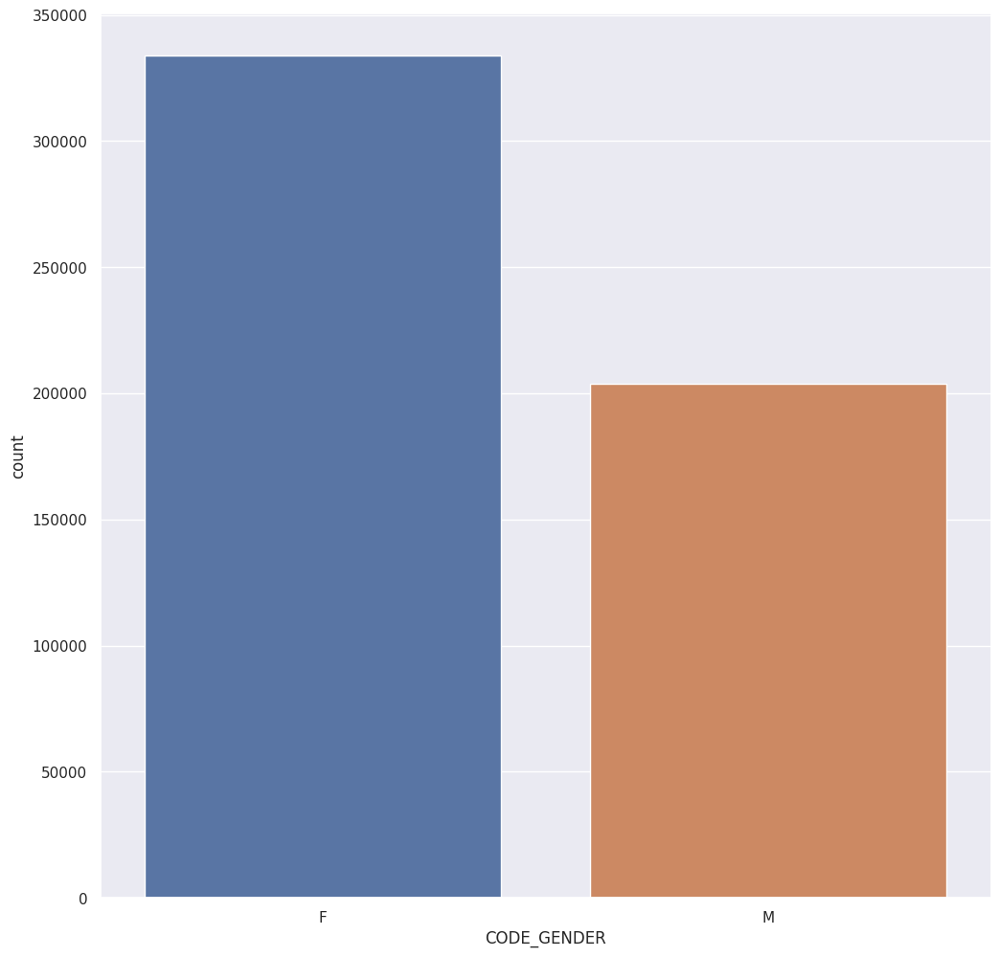

              FLAG_OWN_CAR  Ratio
FLAG_OWN_CAR                     
N                   306207 56.951
Y                   231460 43.049
##########################################


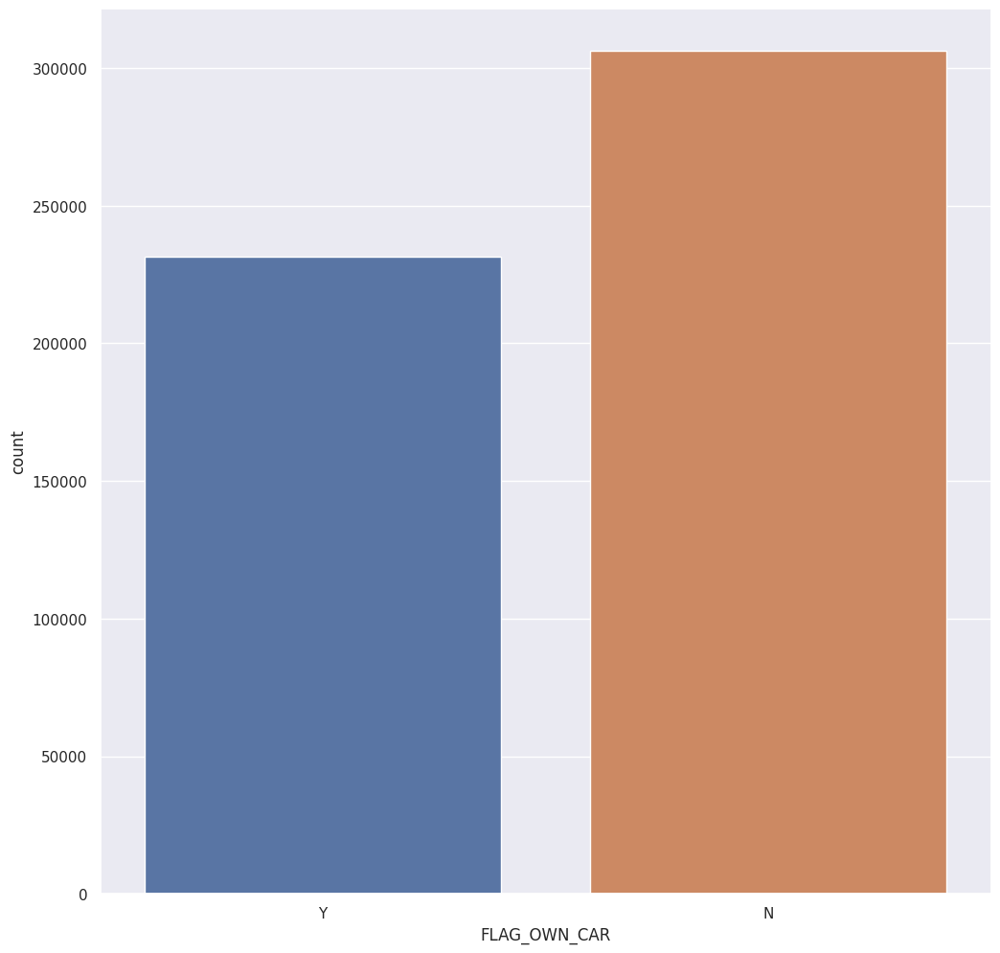

                 FLAG_OWN_REALTY  Ratio
FLAG_OWN_REALTY                        
Y                         345471 64.254
N                         192196 35.746
##########################################


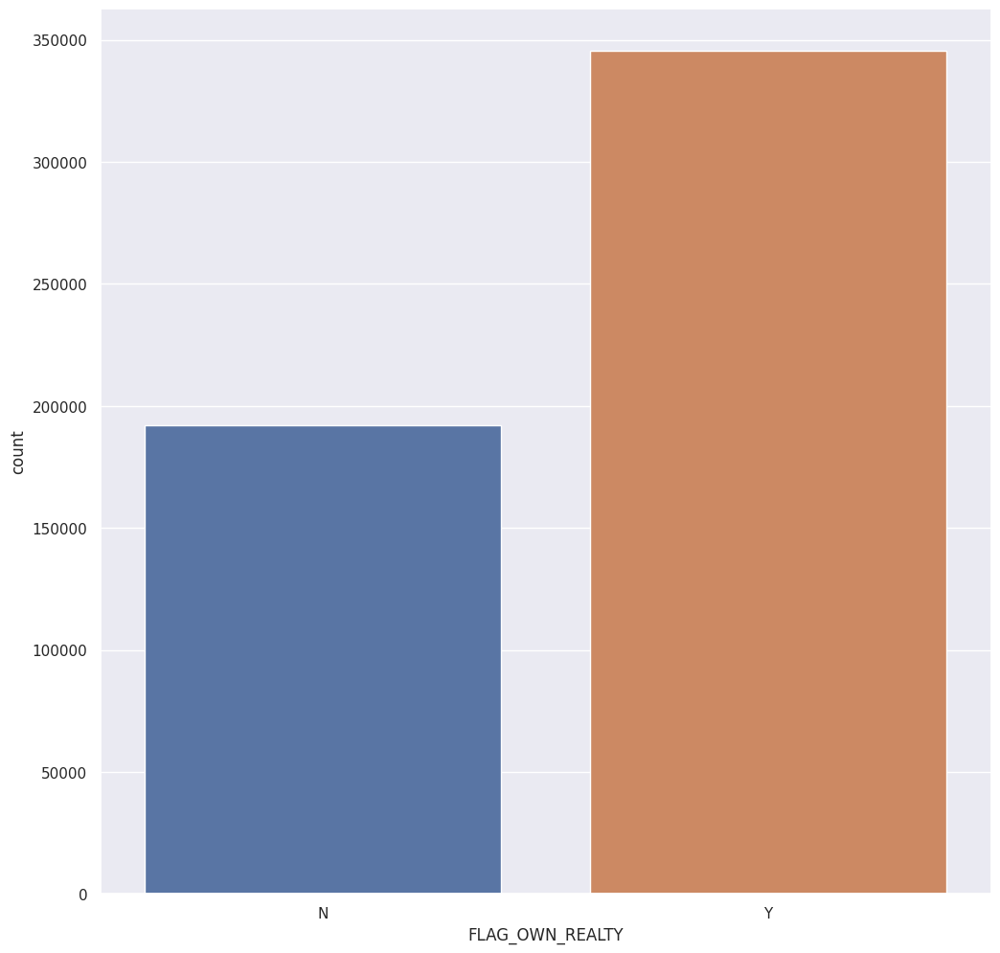

              CNT_CHILDREN  Ratio
CNT_CHILDREN                     
No children         343151 63.822
1 children          127695 23.750
2+ children          66821 12.428
##########################################


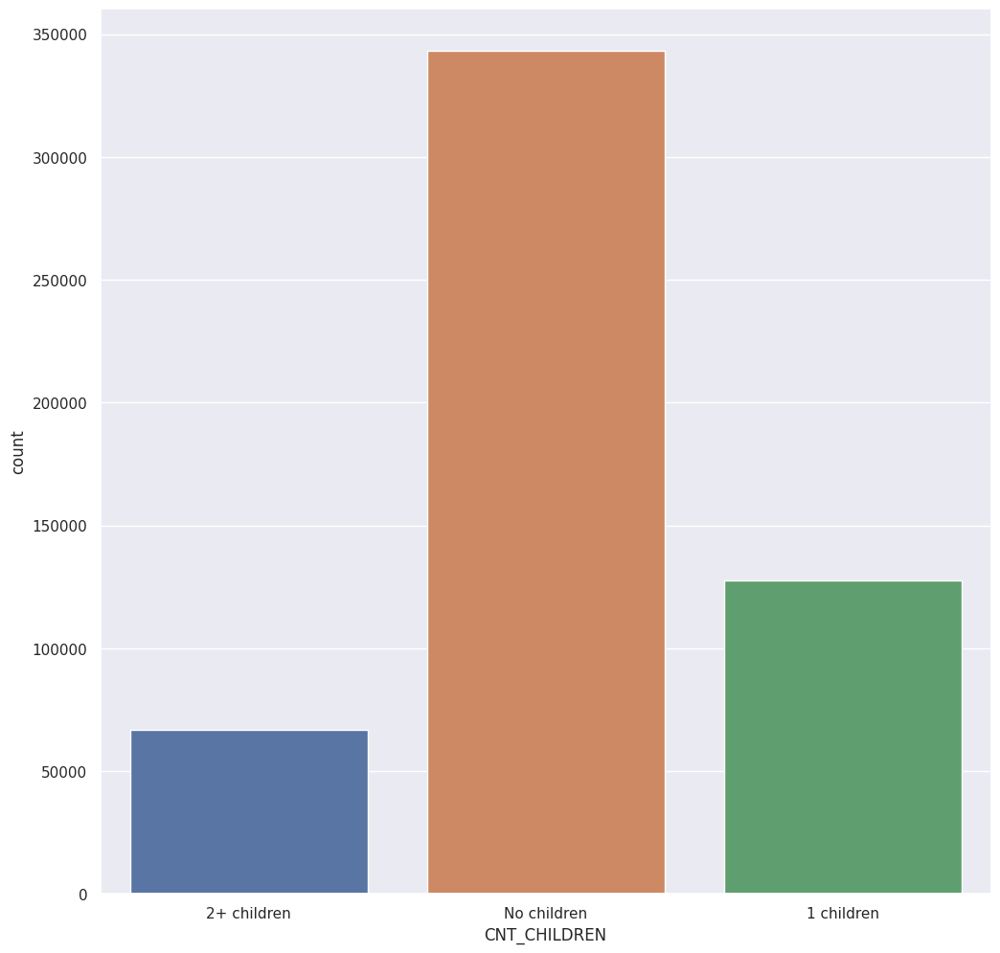

                               NAME_EDUCATION_TYPE  Ratio
NAME_EDUCATION_TYPE                                      
Secondary / secondary special               358317 66.643
Higher education                            153770 28.599
Incomplete higher                            20590  3.830
Lower secondary                               4556  0.847
Academic degree                                434  0.081
##########################################


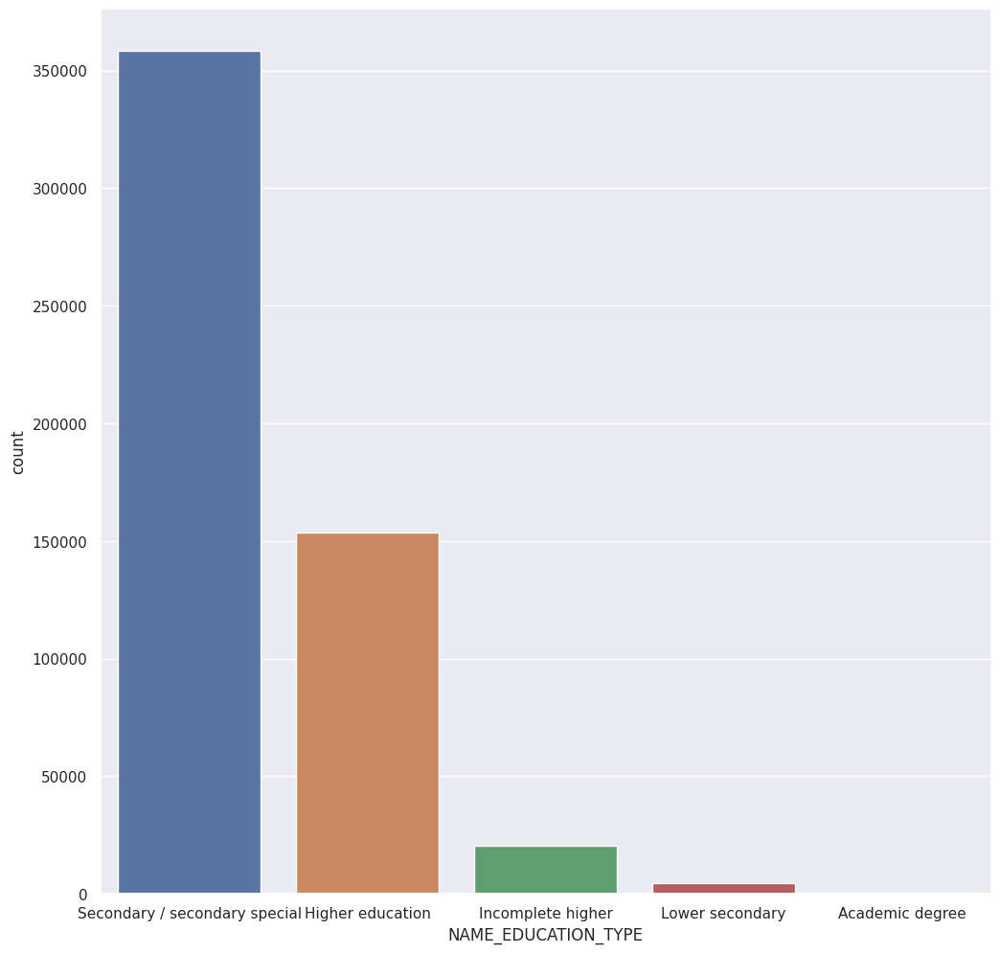

                      NAME_FAMILY_STATUS  Ratio
NAME_FAMILY_STATUS                             
Married                           384003 71.420
Single / not married               65944 12.265
Civil marriage                     44083  8.199
Separated                          31394  5.839
Widow                              12243  2.277
##########################################


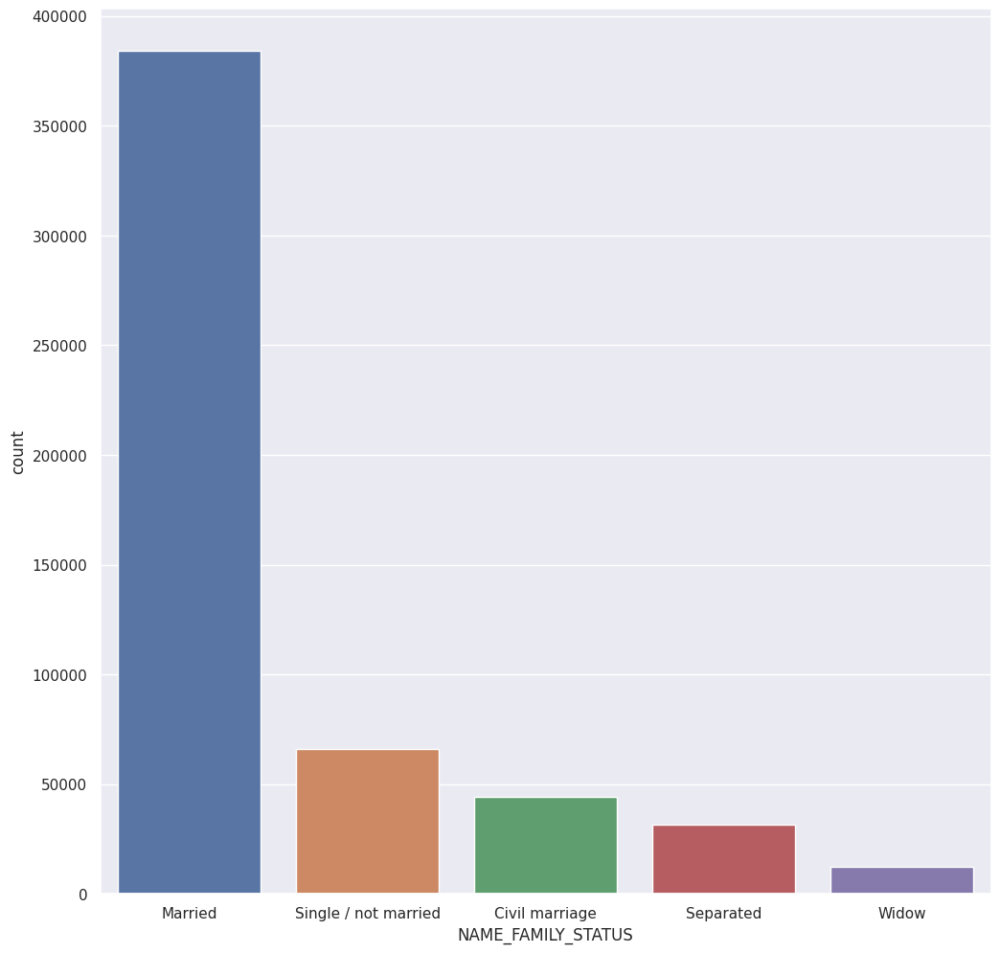

                     NAME_HOUSING_TYPE  Ratio
NAME_HOUSING_TYPE                            
House / apartment               474177 88.192
With parents                     29351  5.459
Municipal apartment              18023  3.352
Rented apartment                  8561  1.592
Office apartment                  4159  0.774
Co-op apartment                   3396  0.632
##########################################


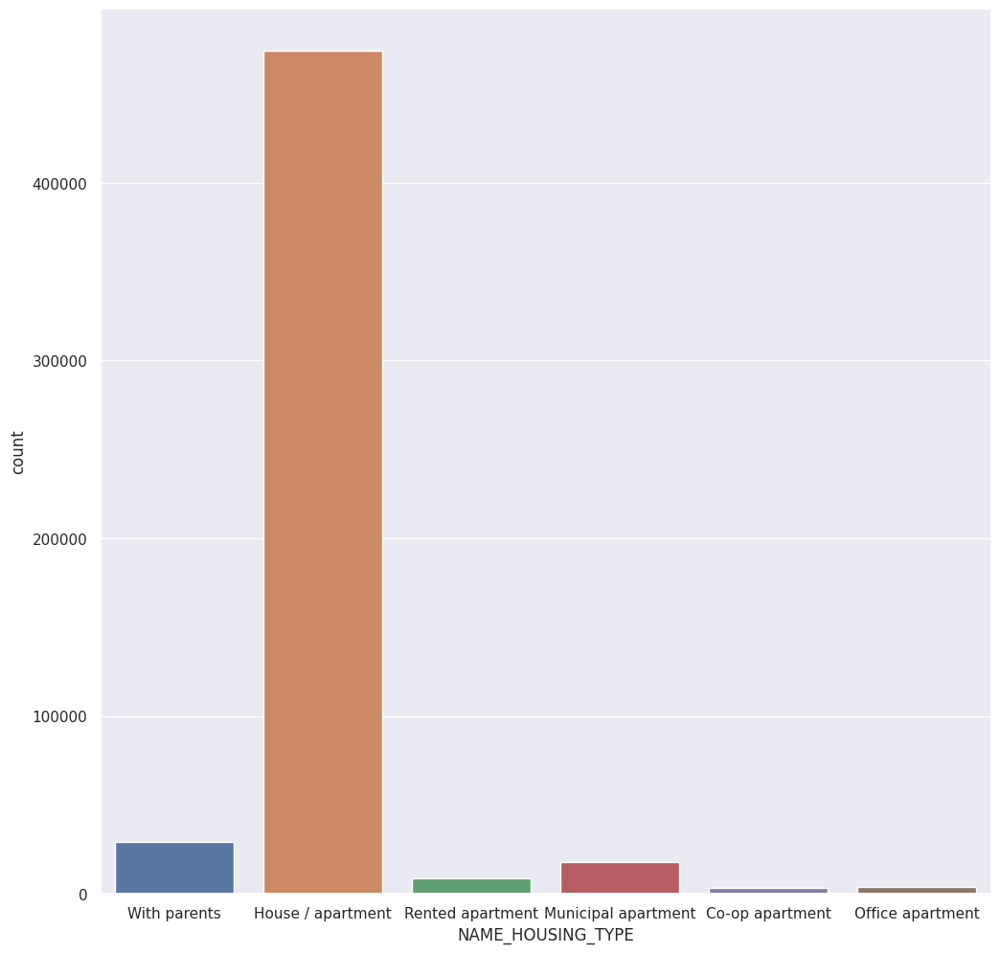

                          JOB  Ratio
JOB                                 
Laborers               131572 24.471
Core staff              77112 14.342
Sales staff             70362 13.087
Managers                67738 12.599
Drivers                 47678  8.868
High skill tech staff   31768  5.908
Accountants             27223  5.063
Medicine staff          26691  4.964
Cooking staff           13416  2.495
Security staff          12400  2.306
Cleaning staff          11399  2.120
Private service staff    6714  1.249
Low-skill Laborers       3623  0.674
Secretaries              3149  0.586
Waiters/barmen staff     2557  0.476
HR staff                 1686  0.314
IT staff                 1319  0.245
Realty agents            1260  0.234
##########################################


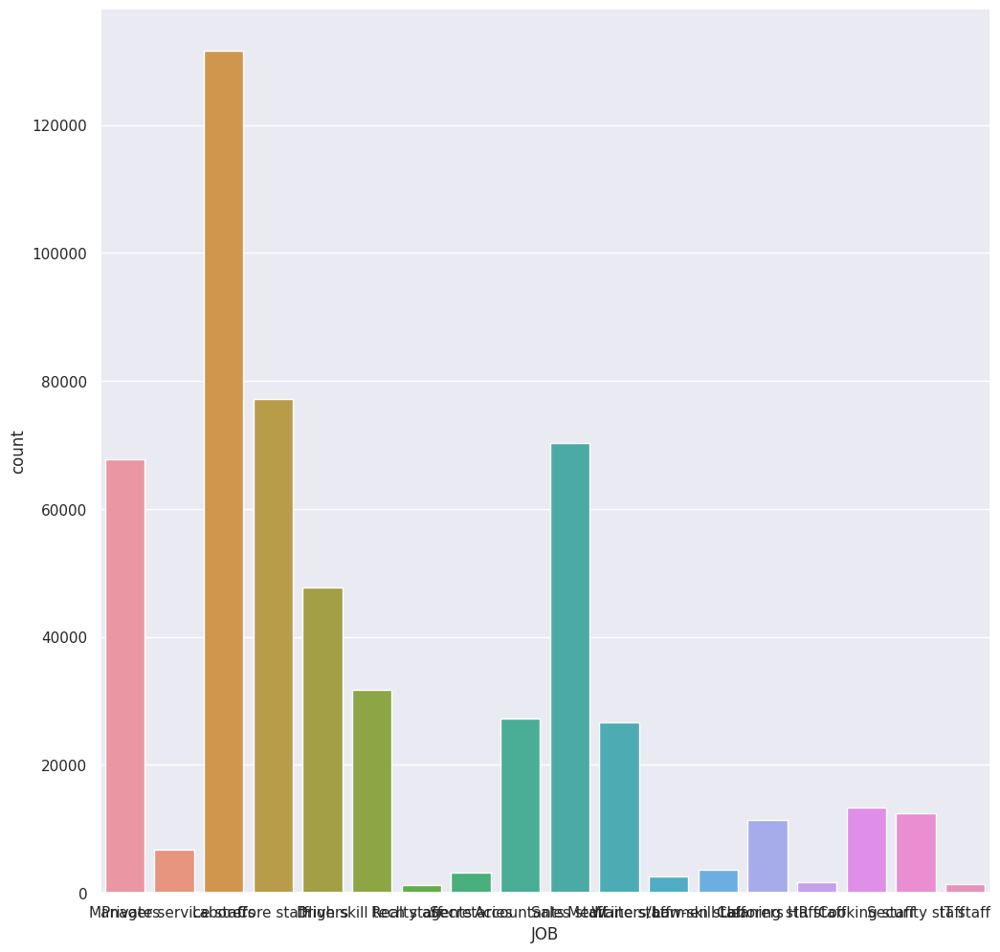

        STATUS  Ratio
STATUS               
C       226185 42.068
0       200930 37.371
X       102167 19.002
1         6423  1.195
5         1087  0.202
2          542  0.101
3          181  0.034
4          152  0.028
##########################################


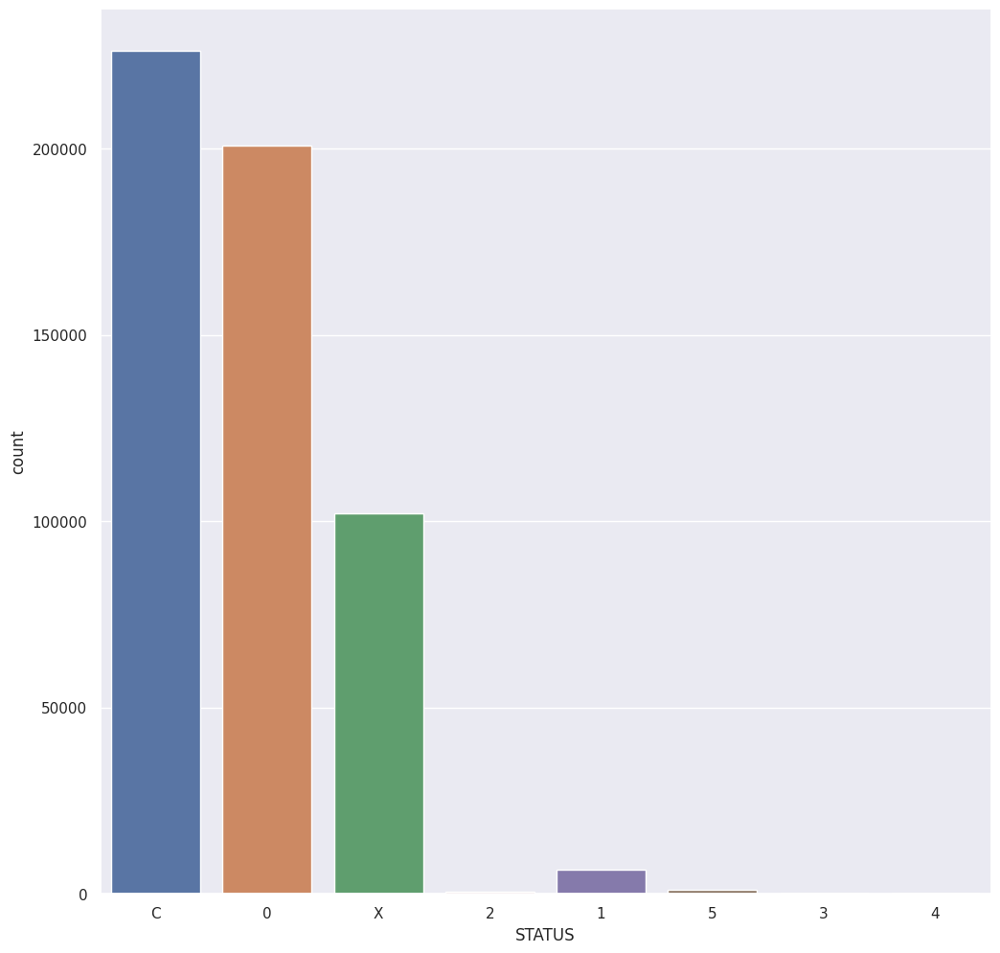

            FLAG_MOBIL   Ratio
FLAG_MOBIL                    
1               537667 100.000
##########################################


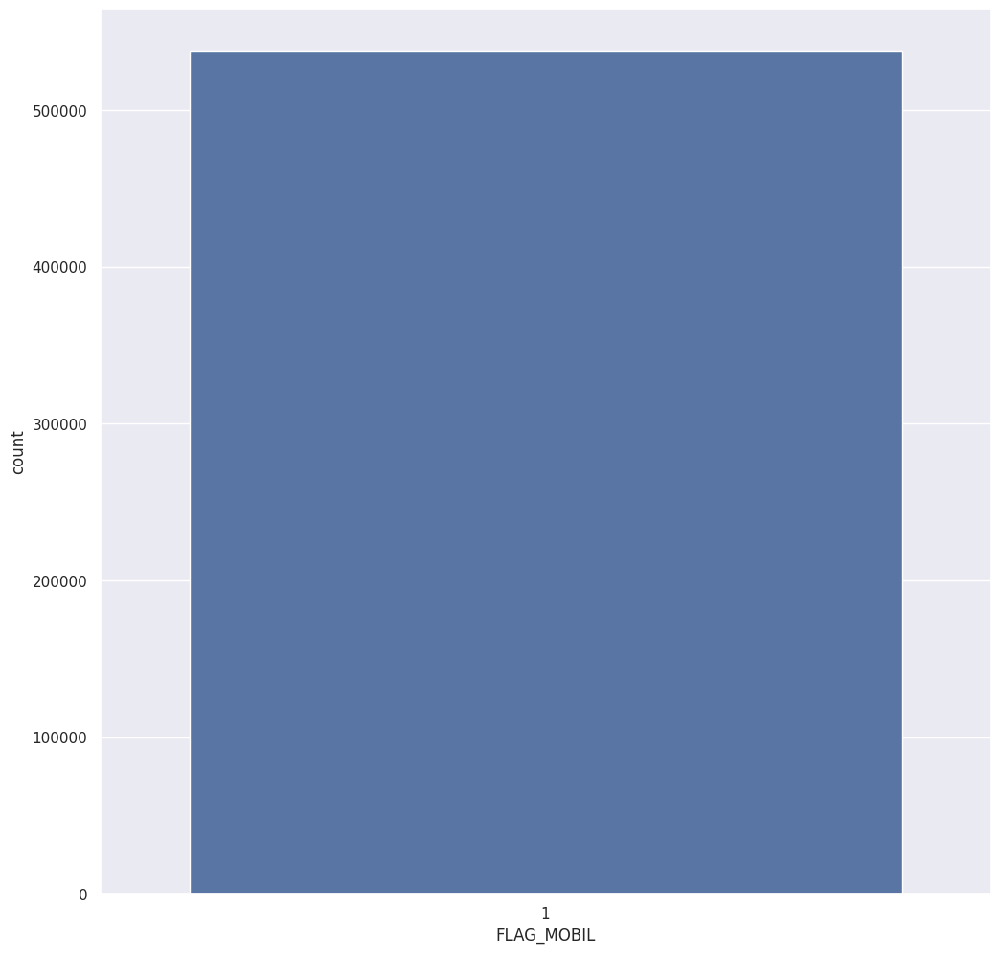

                 FLAG_WORK_PHONE  Ratio
FLAG_WORK_PHONE                        
0                         386252 71.839
1                         151415 28.161
##########################################


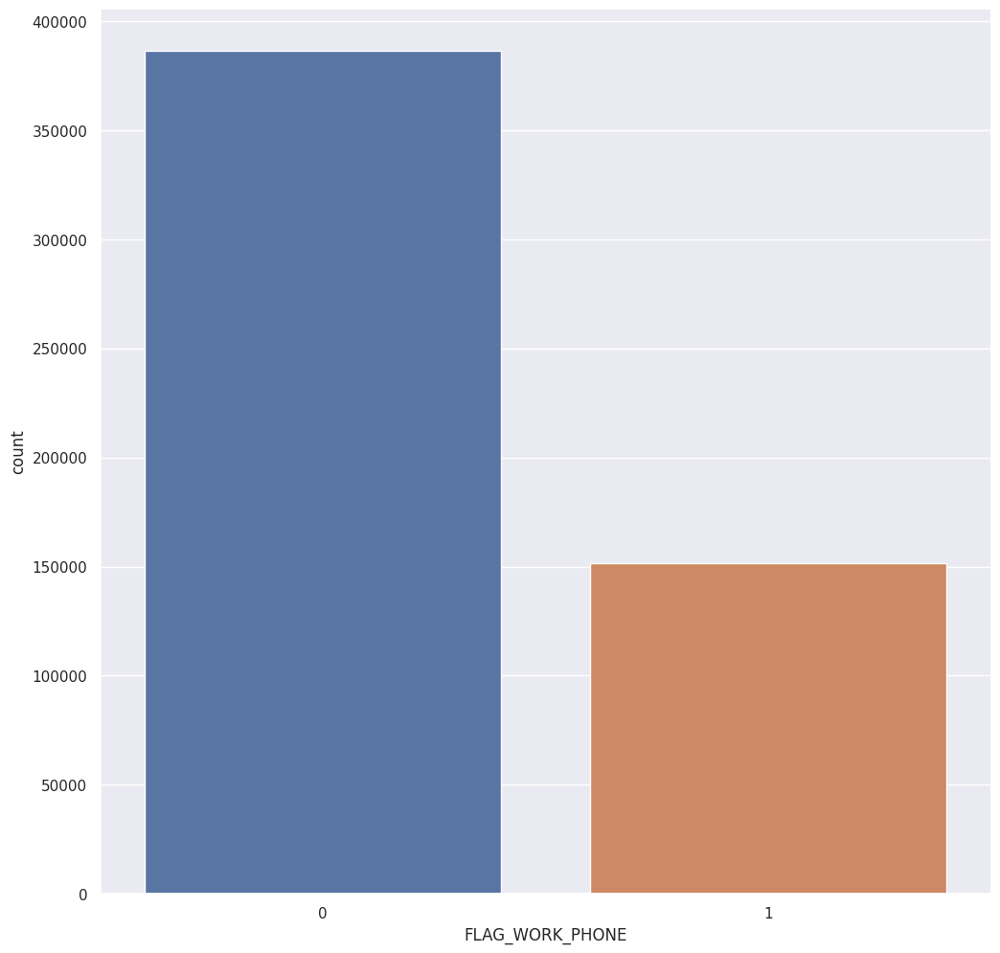

            FLAG_PHONE  Ratio
FLAG_PHONE                   
0               376962 70.111
1               160705 29.889
##########################################


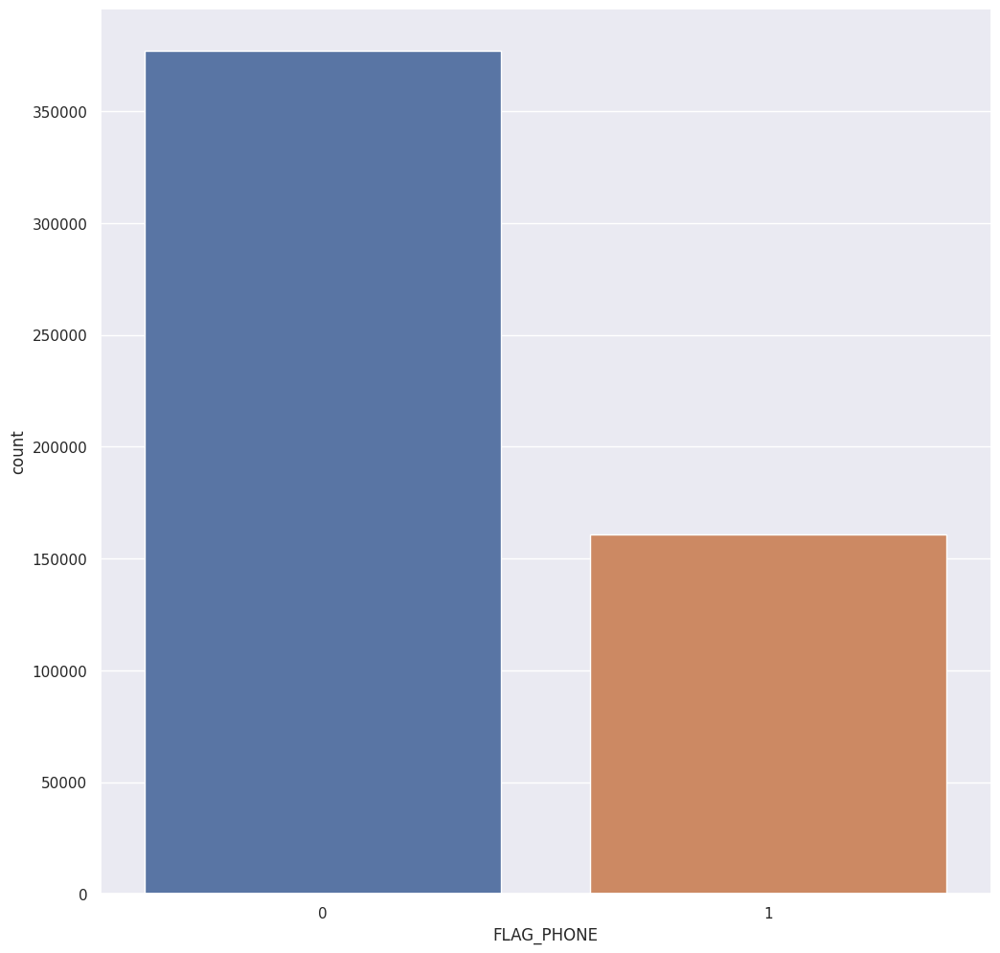

            FLAG_EMAIL  Ratio
FLAG_EMAIL                   
0               483508 89.927
1                54159 10.073
##########################################


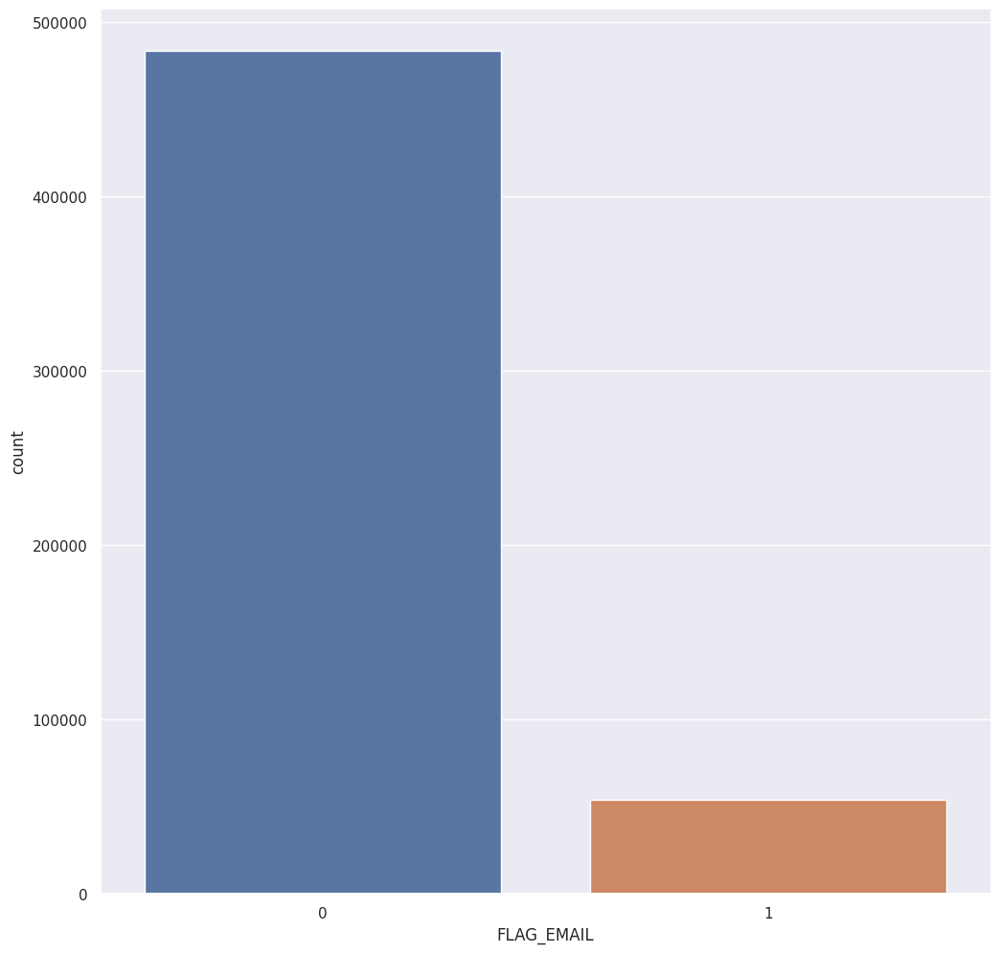

        TARGET  Ratio
TARGET               
0       535705 99.635
1         1962  0.365
##########################################


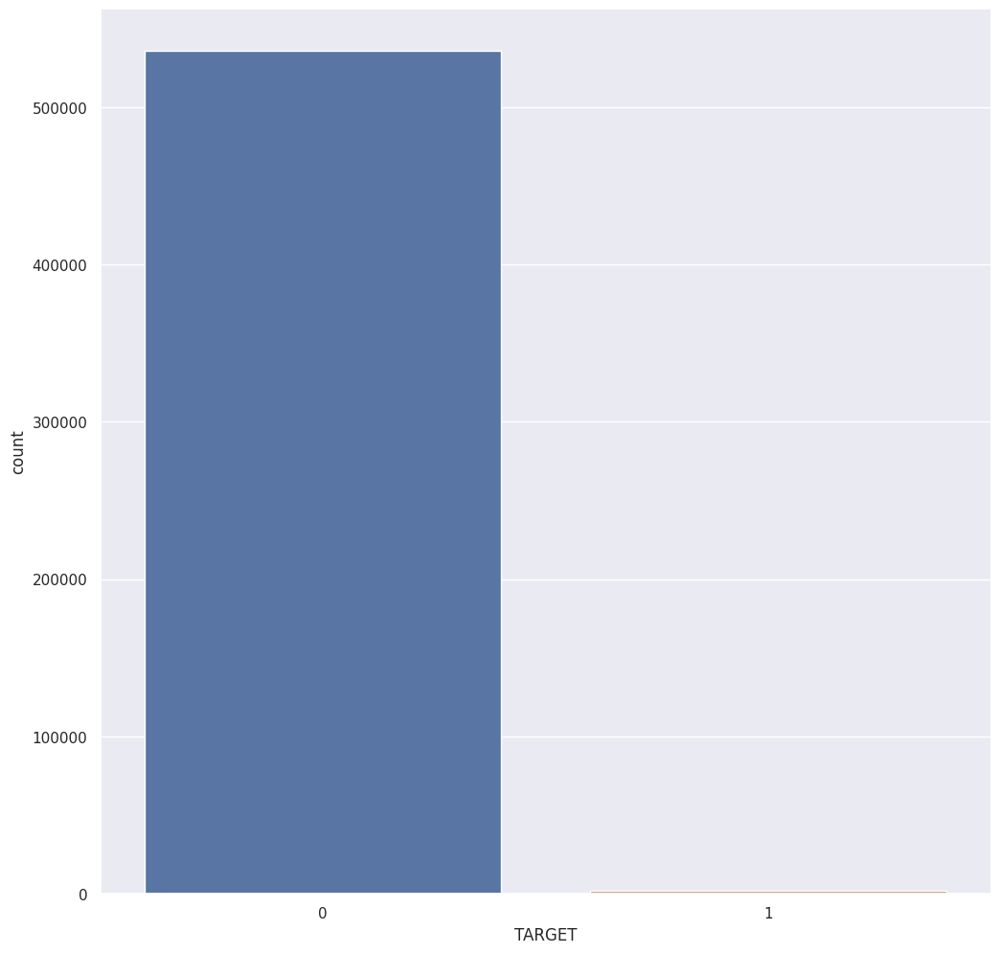

In [49]:
# If there were more than one categorical variable, we would loop through all categorical variables one by one as follows to run the function.

for col in cat_cols:
    cat_summary(df, col, plot=True)

* **FLAG_MOBIL** has a value and this is not logical for data analysis;therefore, this variable should delete from data.

# Analysis of Numerical Variables

In [50]:
def num_summary(dataframe, numerical_col, plot=False, color='blue'):
    quantiles = [0.05, 0.10, 0.20, 0.30, 0.40, 0.50, 0.60, 0.70, 0.80, 0.90, 0.95, 0.99]
    print(dataframe[numerical_col].describe(quantiles).T)

    if plot:
        dataframe[numerical_col].hist(bins=20,color='blue')
        plt.xlabel(numerical_col)
        plt.title(numerical_col)
        plt.show(block=True)

count    537667.000
mean    5079231.309
std       42002.000
min     5008806.000
5%      5011006.000
10%     5023480.000
20%     5036128.000
30%     5050504.000
40%     5062291.000
50%     5079091.000
60%     5092424.000
70%     5112802.000
80%     5117971.000
90%     5139916.000
95%     5146139.000
99%     5149858.000
max     5150487.000
Name: ID, dtype: float64


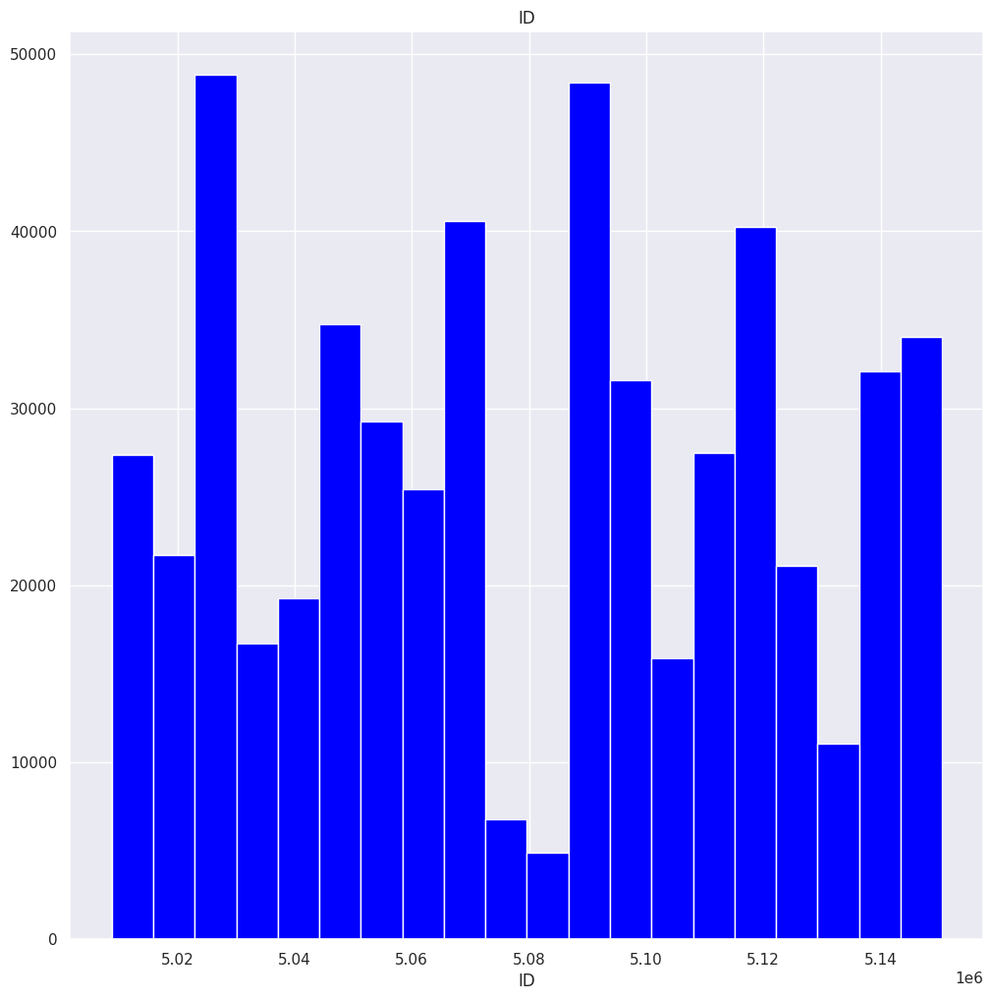

count    537667.000
mean     197117.127
std      104138.963
min       27000.000
5%        81000.000
10%       99000.000
20%      121500.000
30%      135000.000
40%      157500.000
50%      180000.000
60%      202500.000
70%      225000.000
80%      270000.000
90%      315000.000
95%      360000.000
99%      585000.000
max     1575000.000
Name: AMT_INCOME_TOTAL, dtype: float64


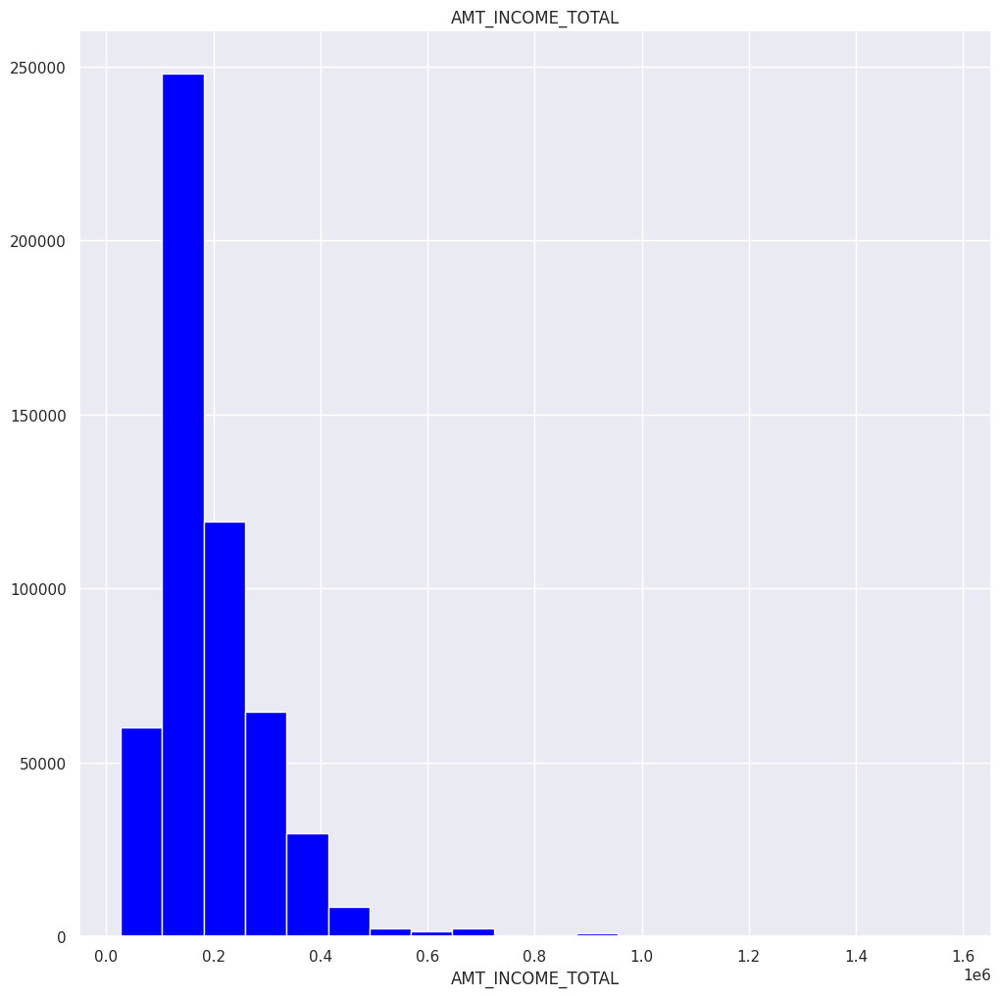

count   537667.000
mean    -15010.959
std       3416.418
min     -24611.000
5%      -20870.000
10%     -19721.000
20%     -18307.000
30%     -16977.000
40%     -15839.000
50%     -14785.000
60%     -13833.000
70%     -12752.000
80%     -11700.000
90%     -10520.000
95%      -9957.000
99%      -8948.000
max      -7489.000
Name: DAYS_BIRTH, dtype: float64


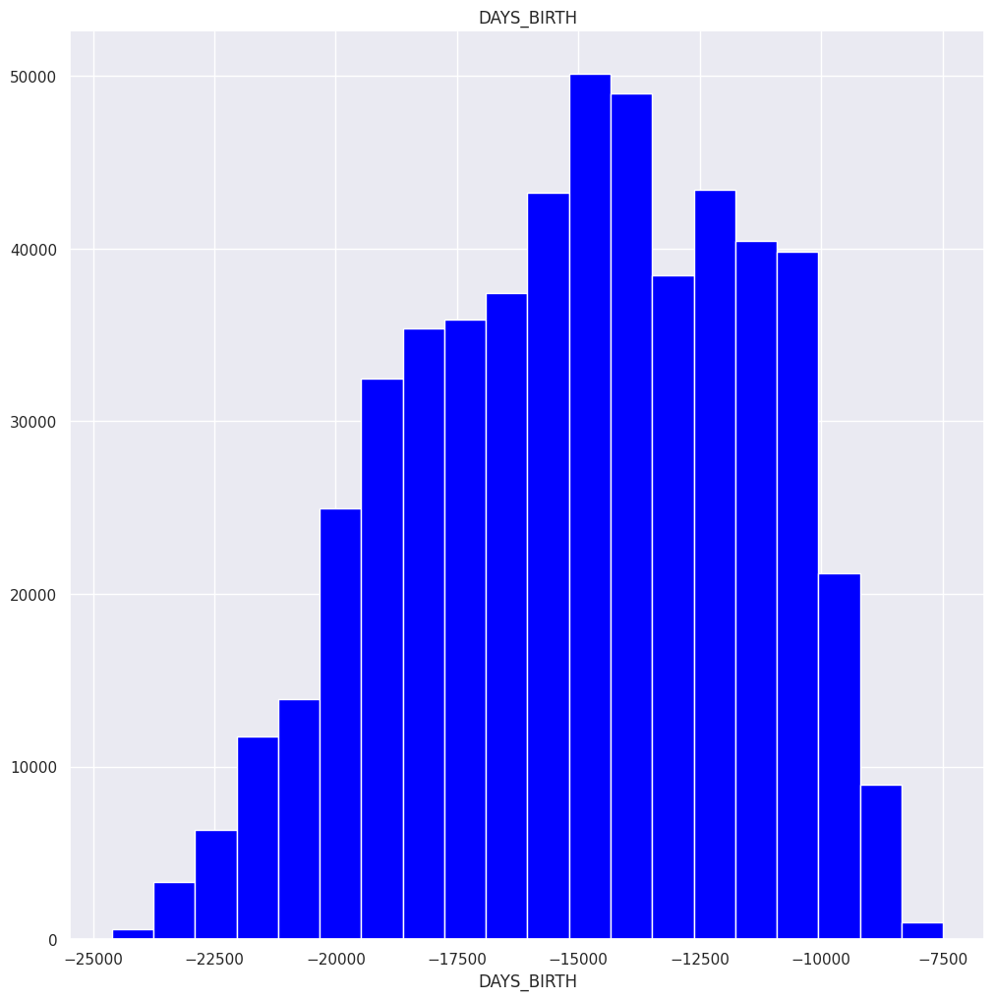

count   537667.000
mean     -2762.030
std       2393.919
min     -15713.000
5%       -7736.000
10%      -5849.000
20%      -4145.000
30%      -3272.000
40%      -2667.000
50%      -2147.000
60%      -1661.000
70%      -1259.000
80%       -839.000
90%       -431.000
95%       -249.000
99%       -110.000
max        -17.000
Name: DAYS_EMPLOYED, dtype: float64


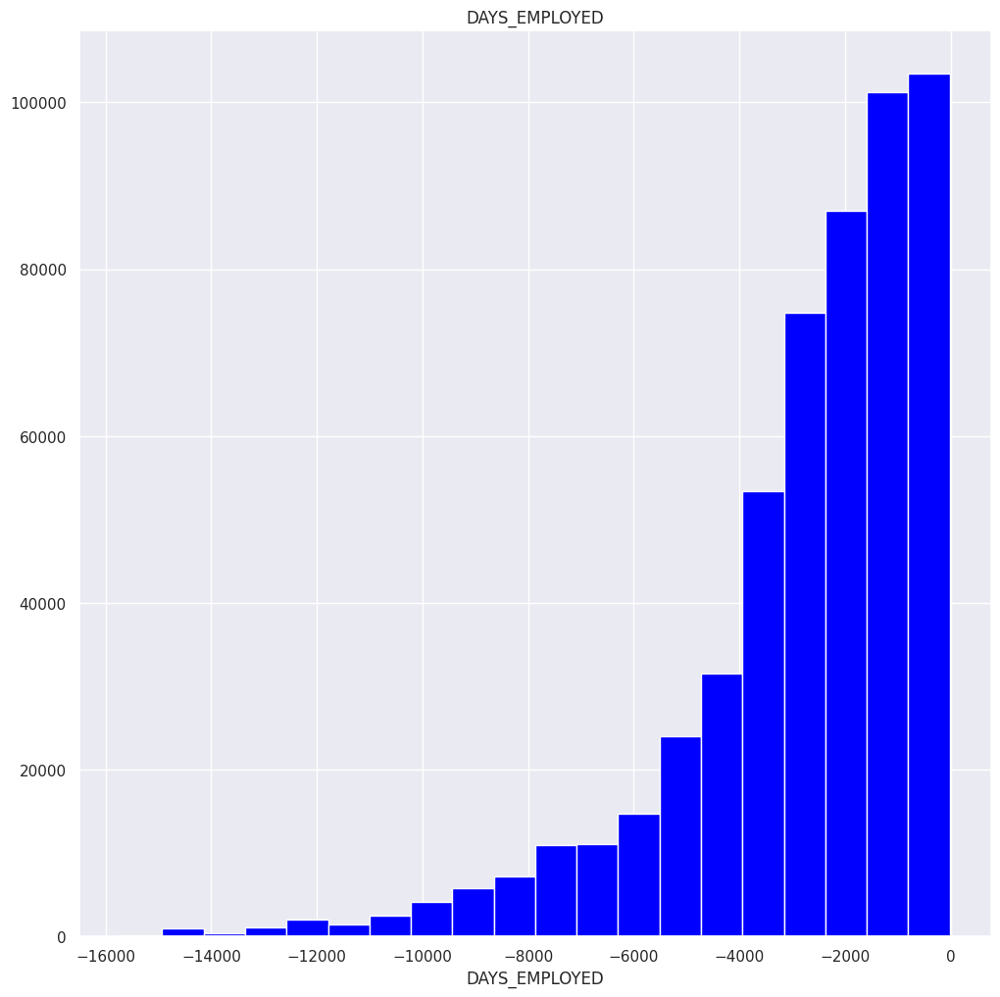

count   537667.000
mean       -19.305
std         14.038
min        -60.000
5%         -46.000
10%        -40.000
20%        -32.000
30%        -26.000
40%        -21.000
50%        -17.000
60%        -13.000
70%         -9.000
80%         -6.000
90%         -3.000
95%         -1.000
99%          0.000
max          0.000
Name: BEGIN_MONTHS, dtype: float64


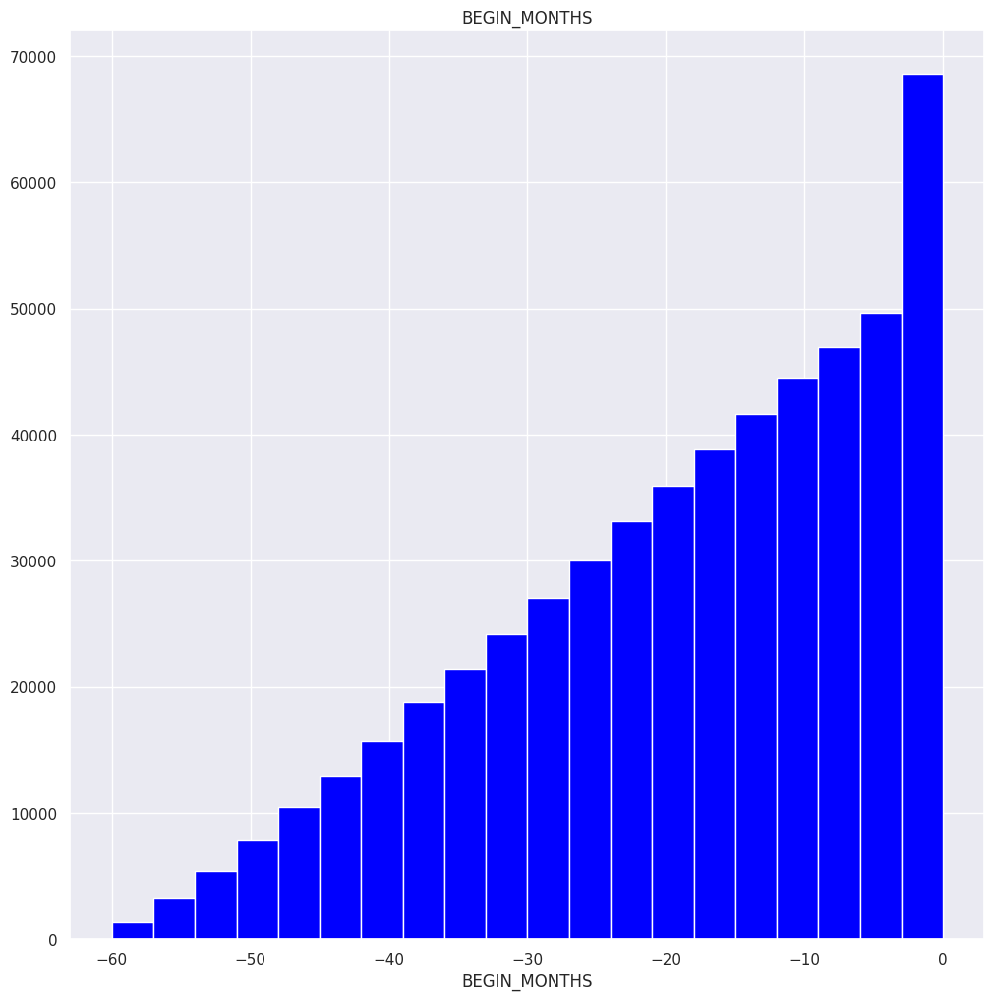

In [51]:
for col in num_cols:
    num_summary(df, col, plot=True, color='blue')

* Analysis of Numerical Variables should be **change into** **true value** and ought to analysis.

# Analysis of Categorical Variables by Target Variable

In [52]:
def target_summary_with_cat(dataframe, target, categorical_col, plot=False):
    print(pd.DataFrame({'TARGET_MEAN': dataframe.groupby(categorical_col)[target].mean()}), end='\n\n\n')
    if plot:
        sns.barplot(x=categorical_col, y=target, data=dataframe)
        plt.show(block=True)

             TARGET_MEAN
CODE_GENDER             
F                  0.003
M                  0.005




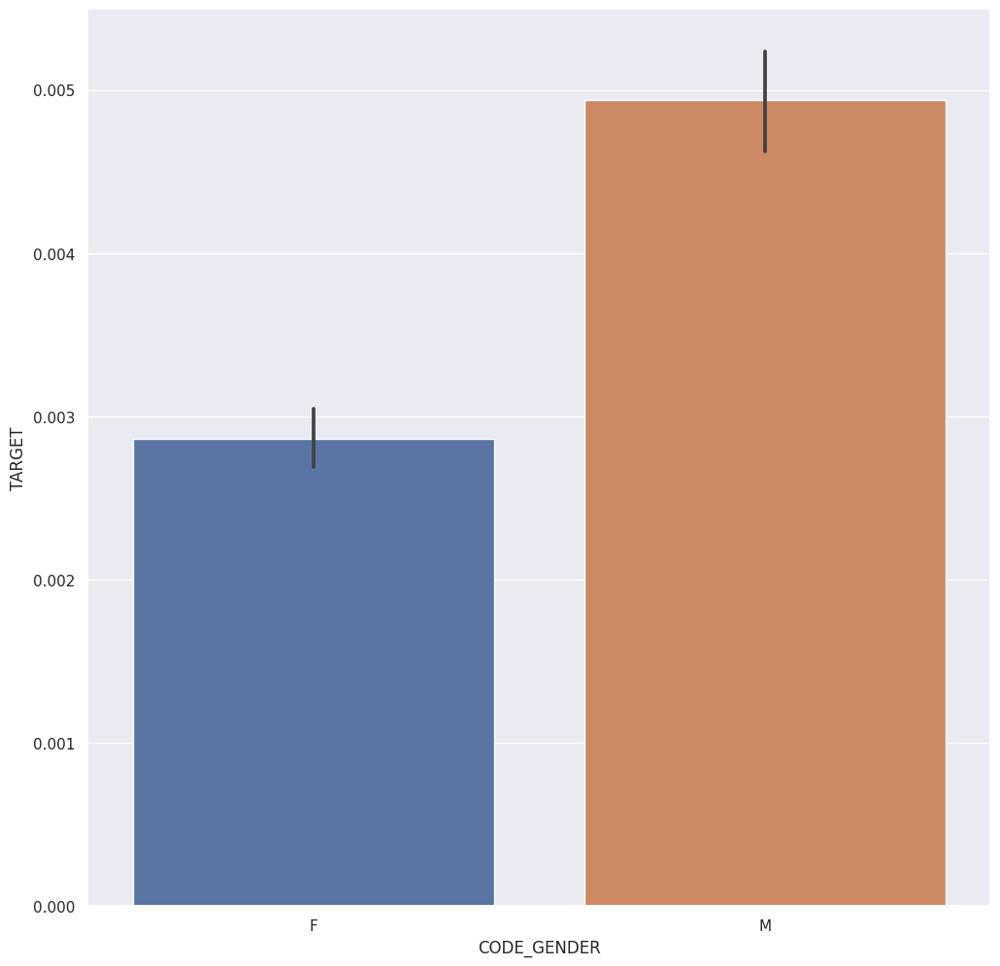

              TARGET_MEAN
FLAG_OWN_CAR             
N                   0.003
Y                   0.004




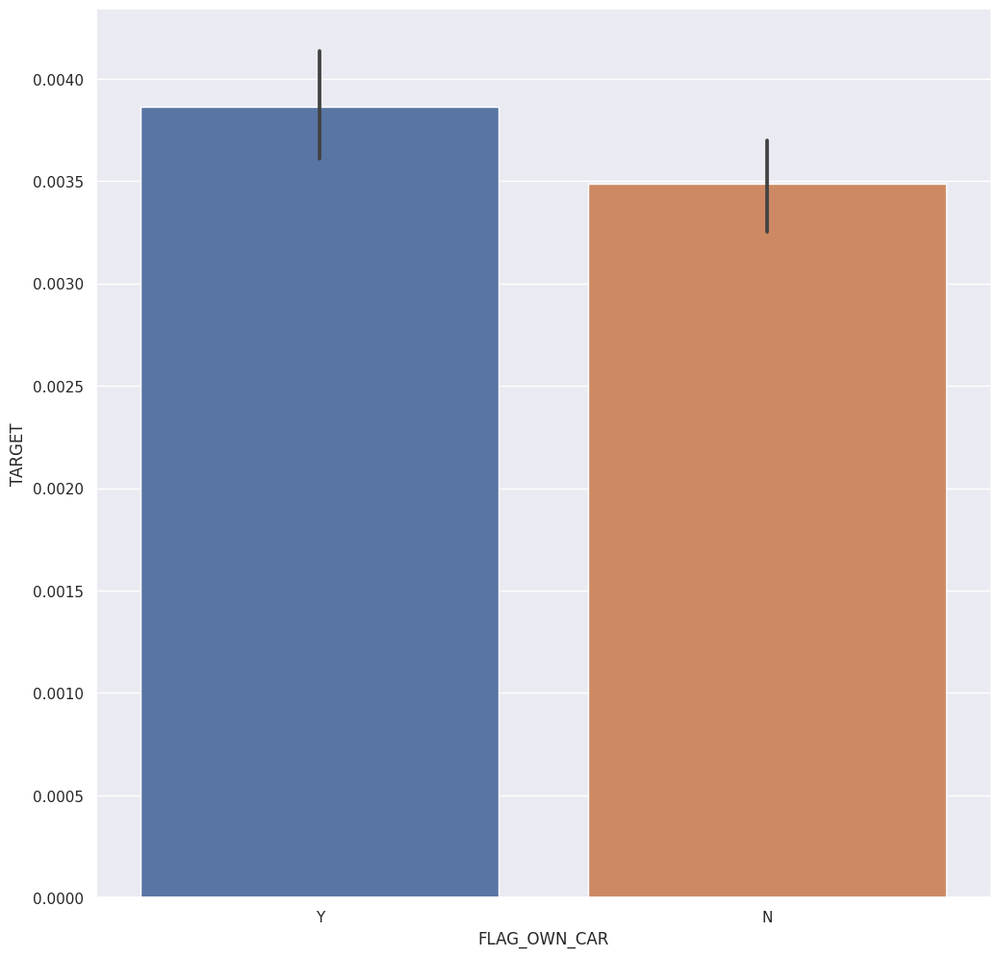

                 TARGET_MEAN
FLAG_OWN_REALTY             
N                      0.003
Y                      0.004




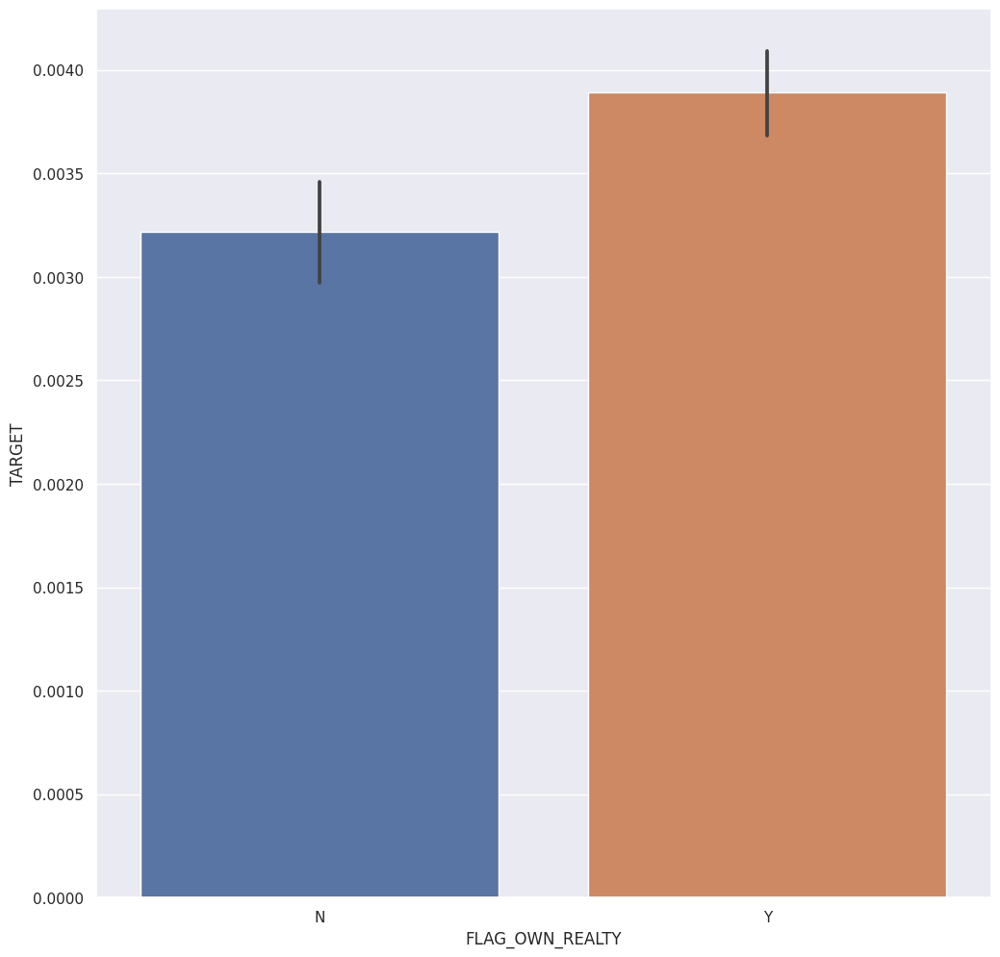

              TARGET_MEAN
CNT_CHILDREN             
1 children          0.005
2+ children         0.003
No children         0.003




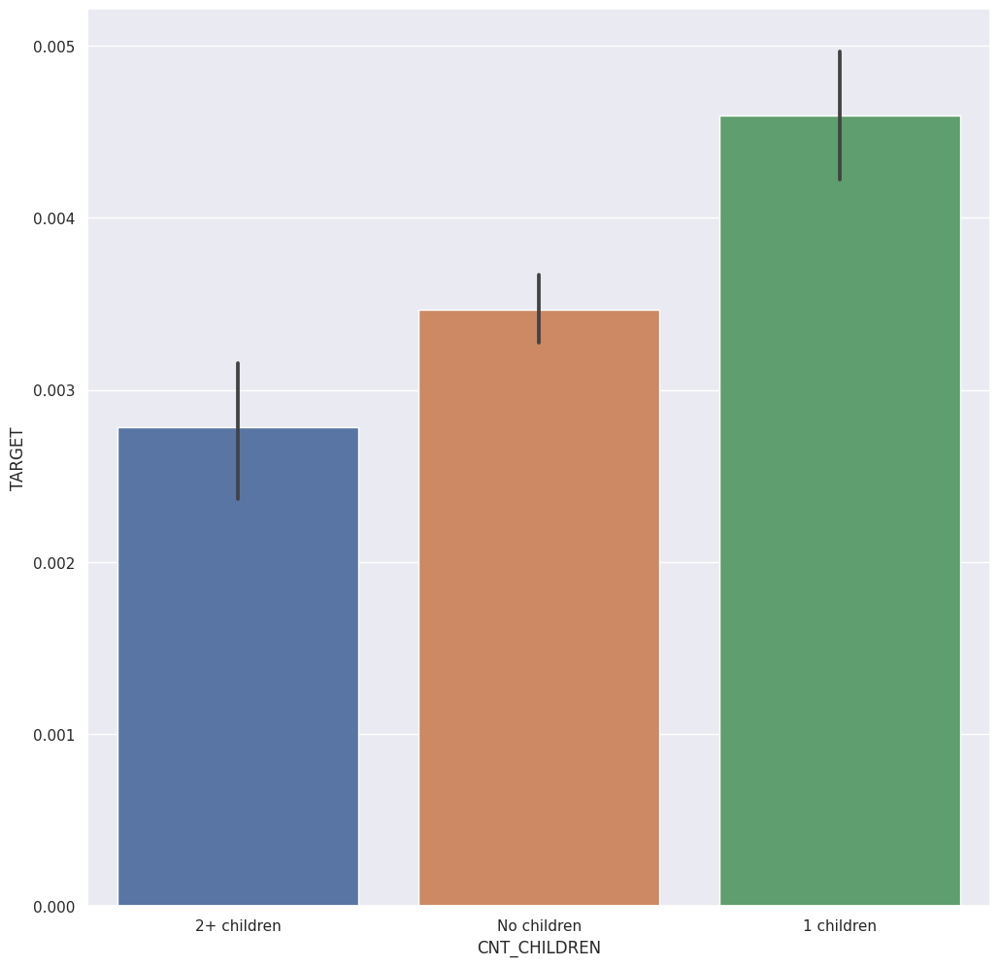

                               TARGET_MEAN
NAME_EDUCATION_TYPE                       
Academic degree                      0.000
Higher education                     0.004
Incomplete higher                    0.004
Lower secondary                      0.011
Secondary / secondary special        0.003




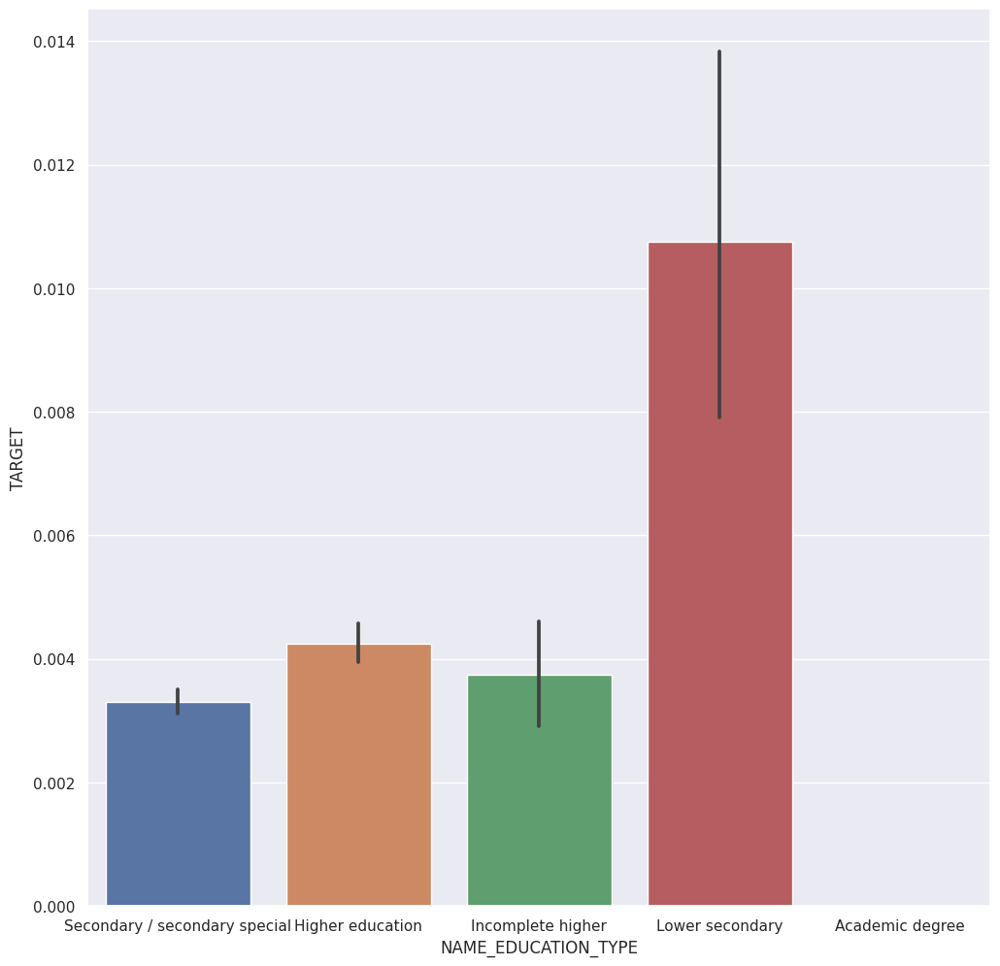

                      TARGET_MEAN
NAME_FAMILY_STATUS               
Civil marriage              0.001
Married                     0.004
Separated                   0.003
Single / not married        0.006
Widow                       0.006




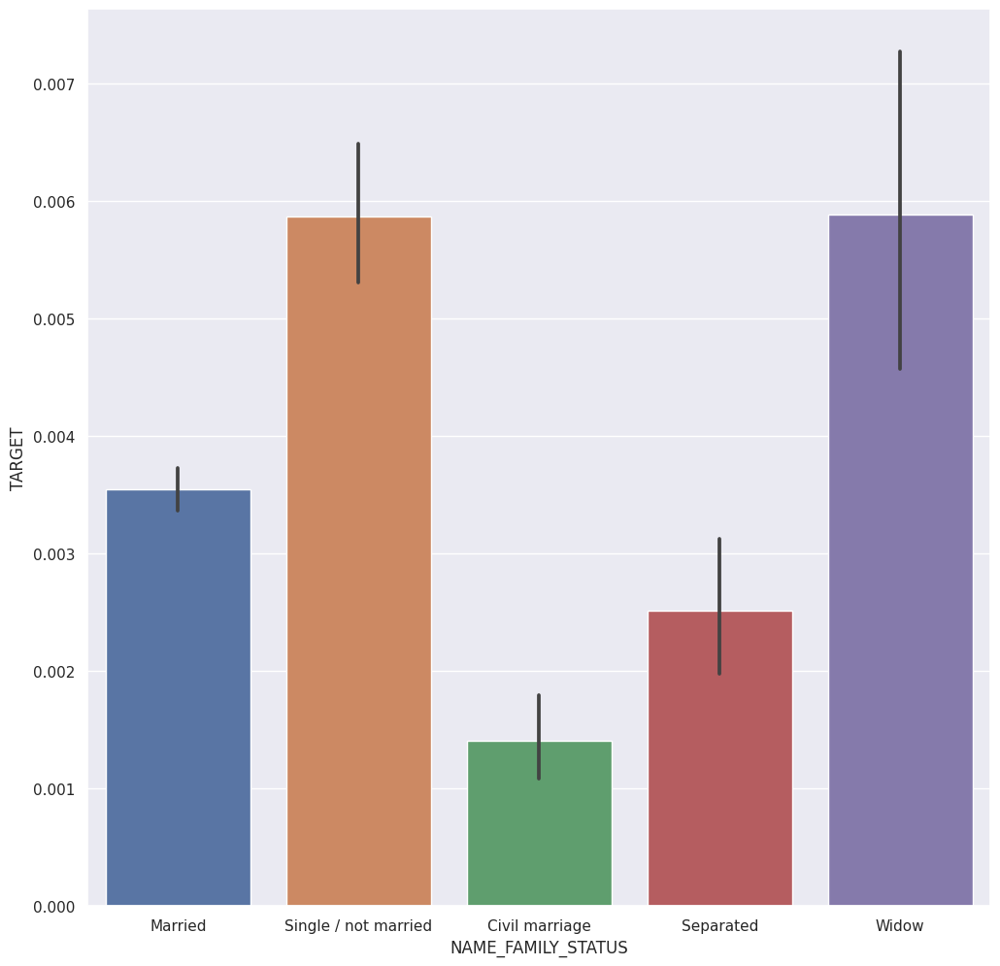

                     TARGET_MEAN
NAME_HOUSING_TYPE               
Co-op apartment            0.009
House / apartment          0.004
Municipal apartment        0.005
Office apartment           0.006
Rented apartment           0.003
With parents               0.003




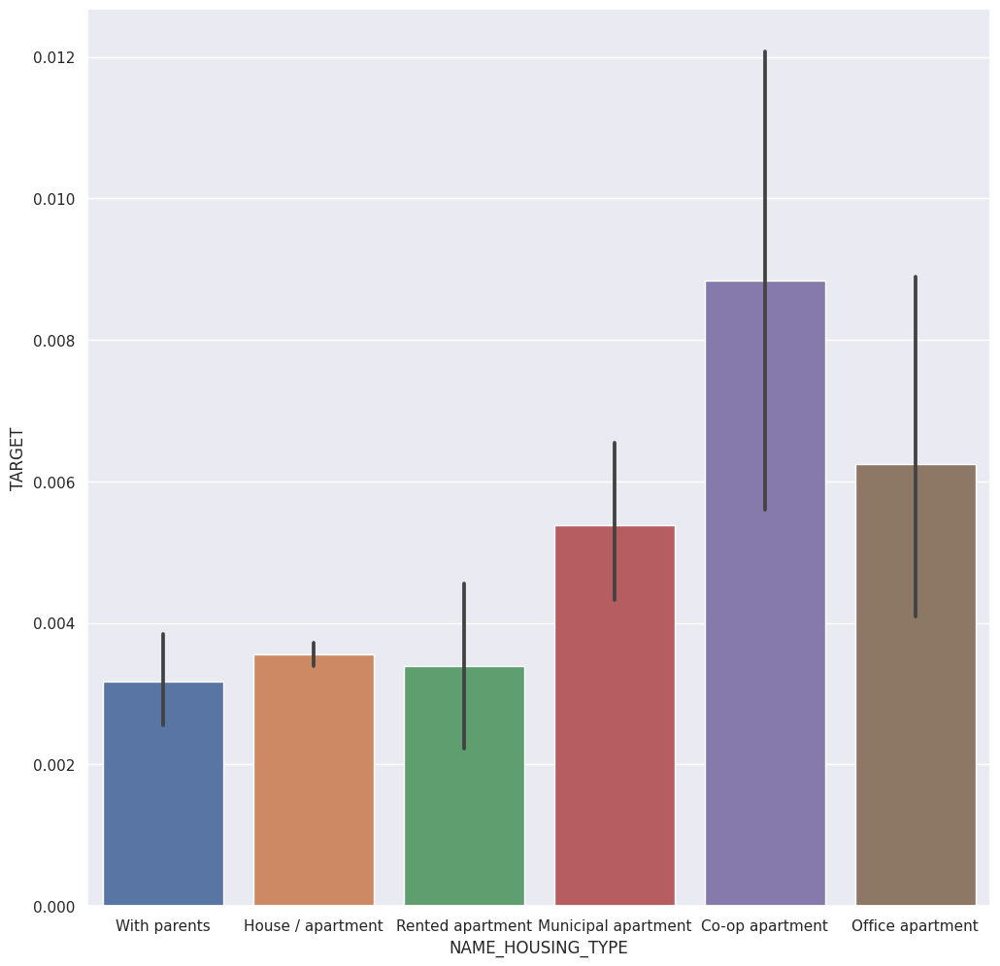

                       TARGET_MEAN
JOB                               
Accountants                  0.003
Cleaning staff               0.002
Cooking staff                0.004
Core staff                   0.004
Drivers                      0.004
HR staff                     0.001
High skill tech staff        0.004
IT staff                     0.016
Laborers                     0.003
Low-skill Laborers           0.017
Managers                     0.004
Medicine staff               0.002
Private service staff        0.001
Realty agents                0.000
Sales staff                  0.002
Secretaries                  0.001
Security staff               0.013
Waiters/barmen staff         0.004




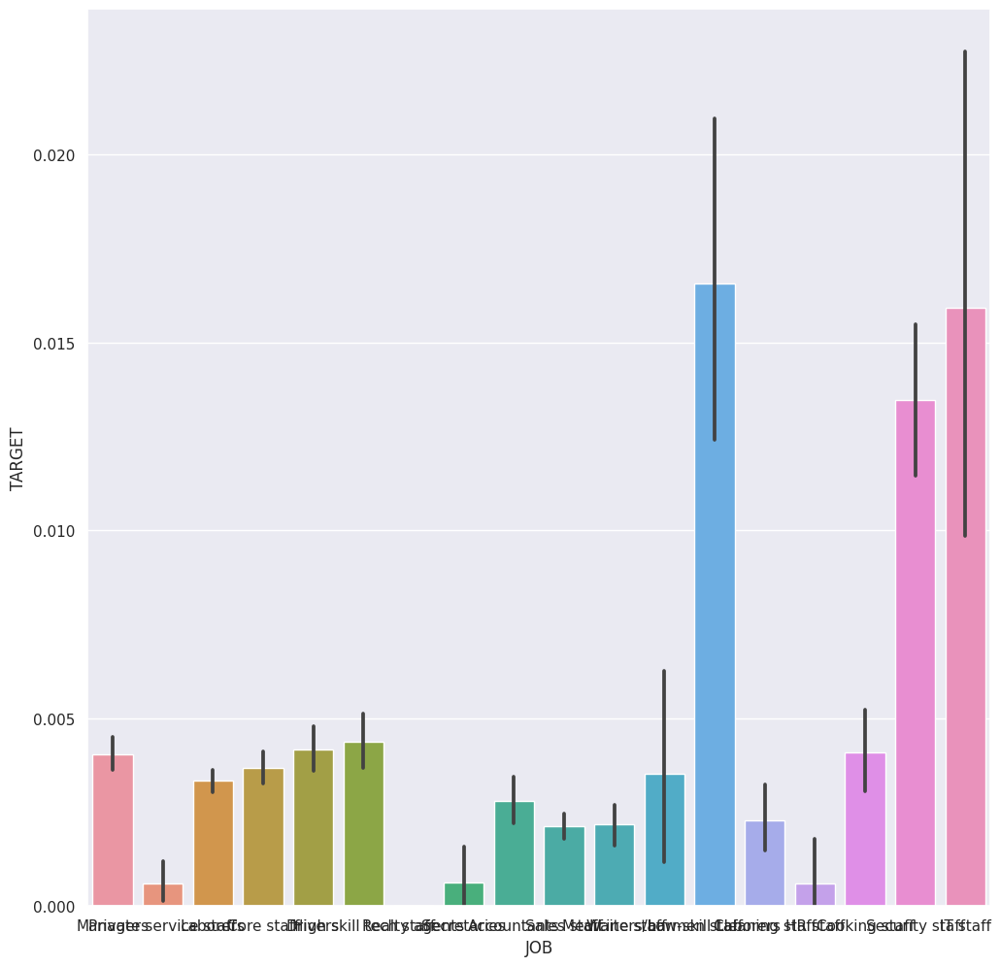

        TARGET_MEAN
STATUS             
0             0.000
1             0.000
2             1.000
3             1.000
4             1.000
5             1.000
C             0.000
X             0.000




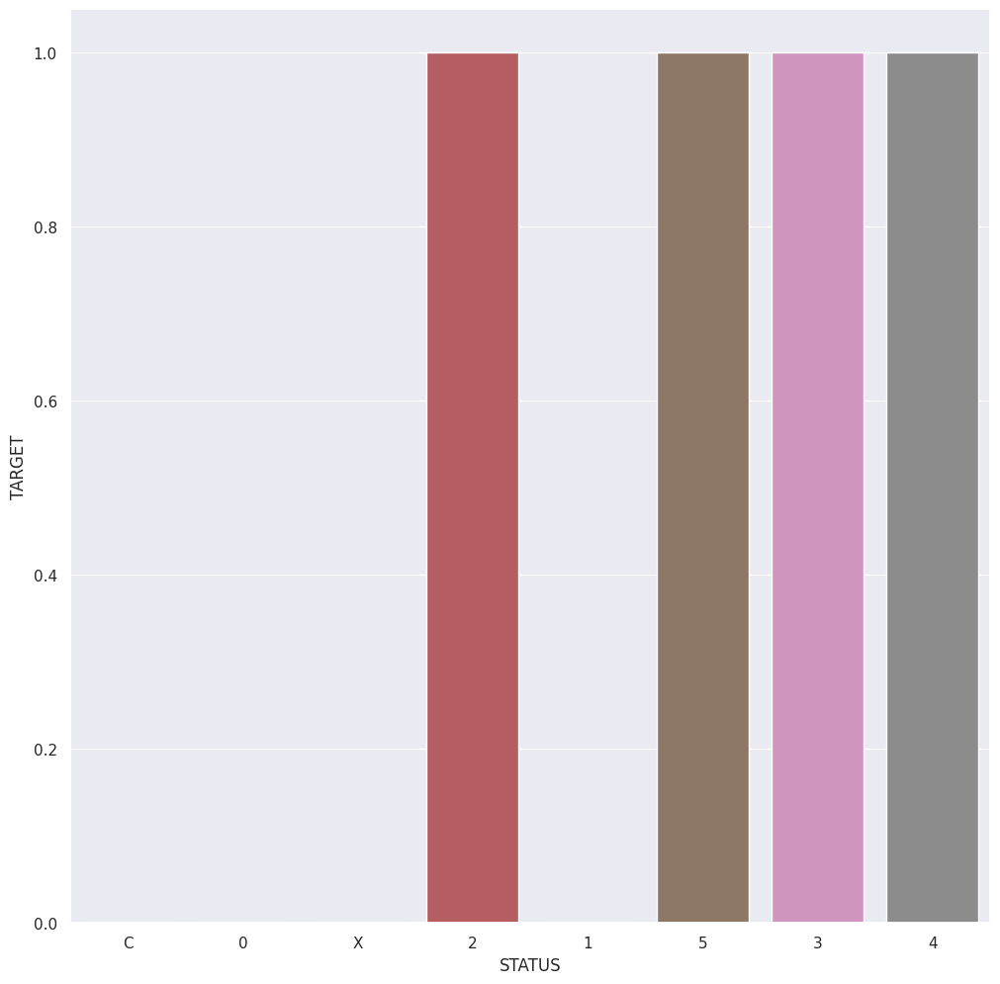

            TARGET_MEAN
FLAG_MOBIL             
1                 0.004




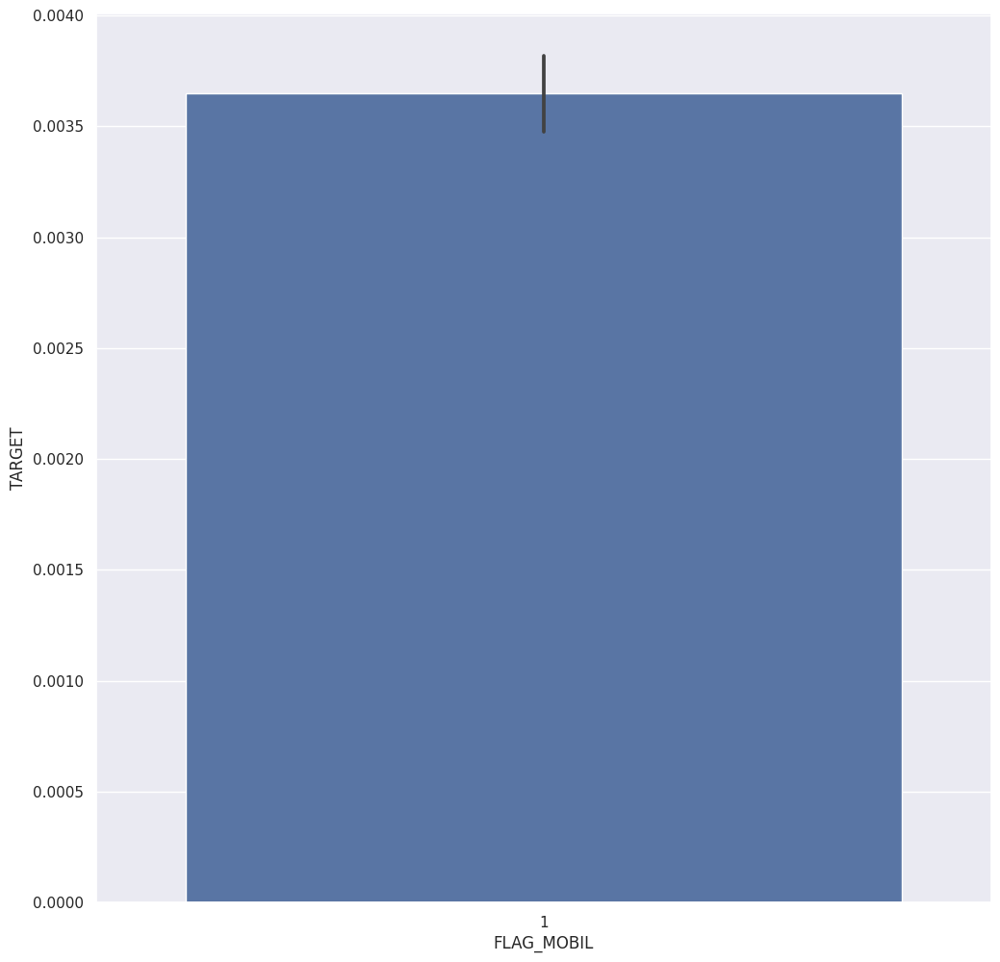

                 TARGET_MEAN
FLAG_WORK_PHONE             
0                      0.003
1                      0.004




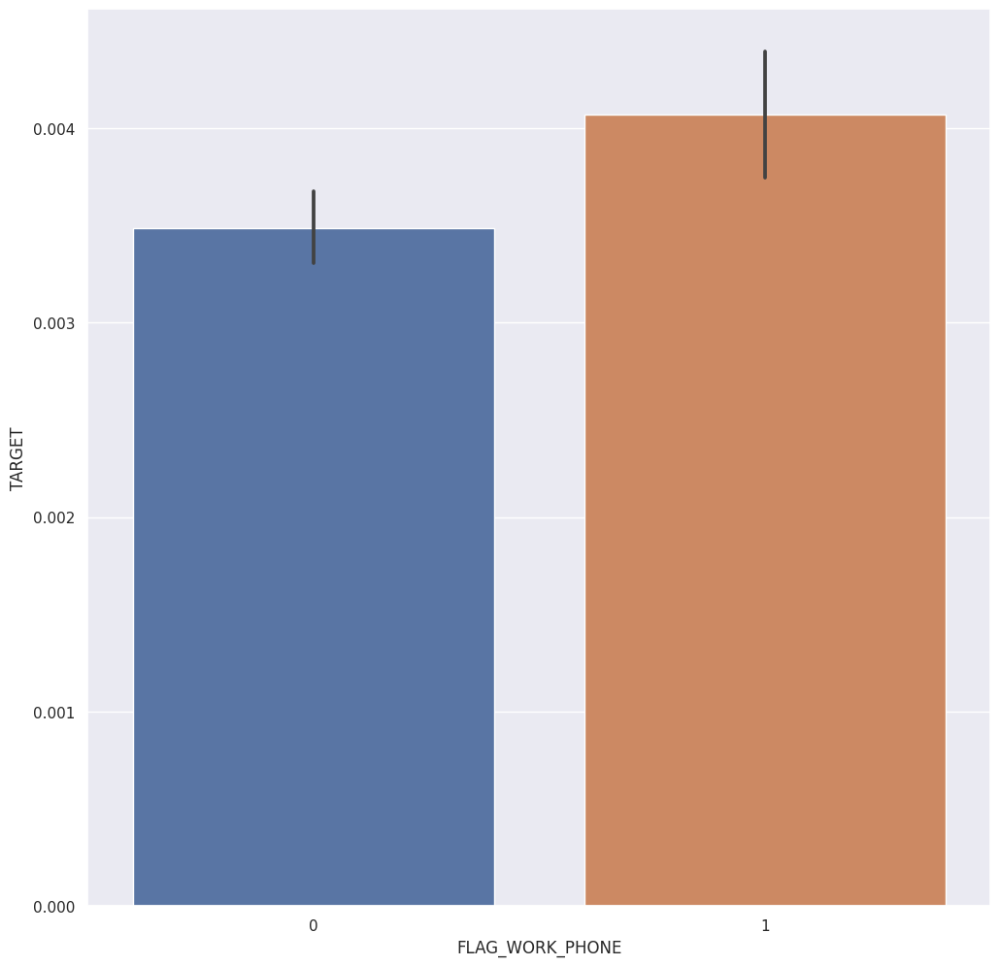

            TARGET_MEAN
FLAG_PHONE             
0                 0.003
1                 0.004




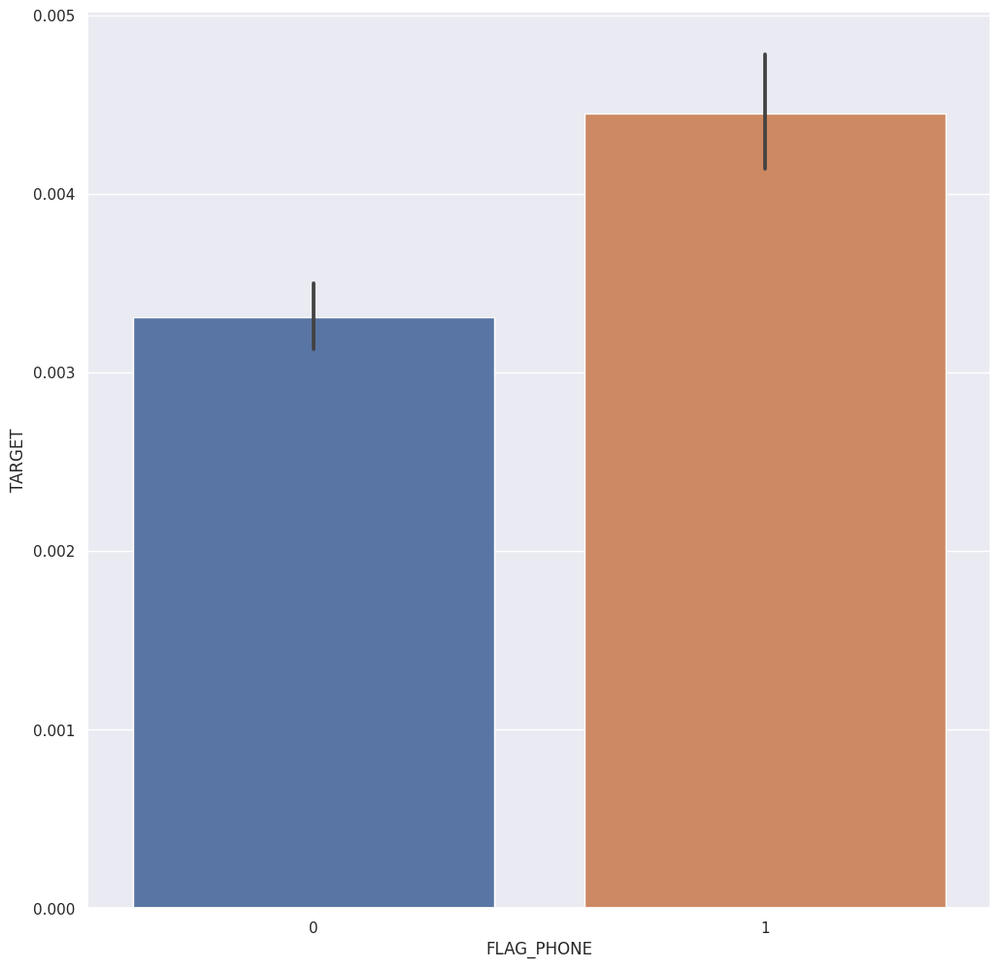

            TARGET_MEAN
FLAG_EMAIL             
0                 0.004
1                 0.003




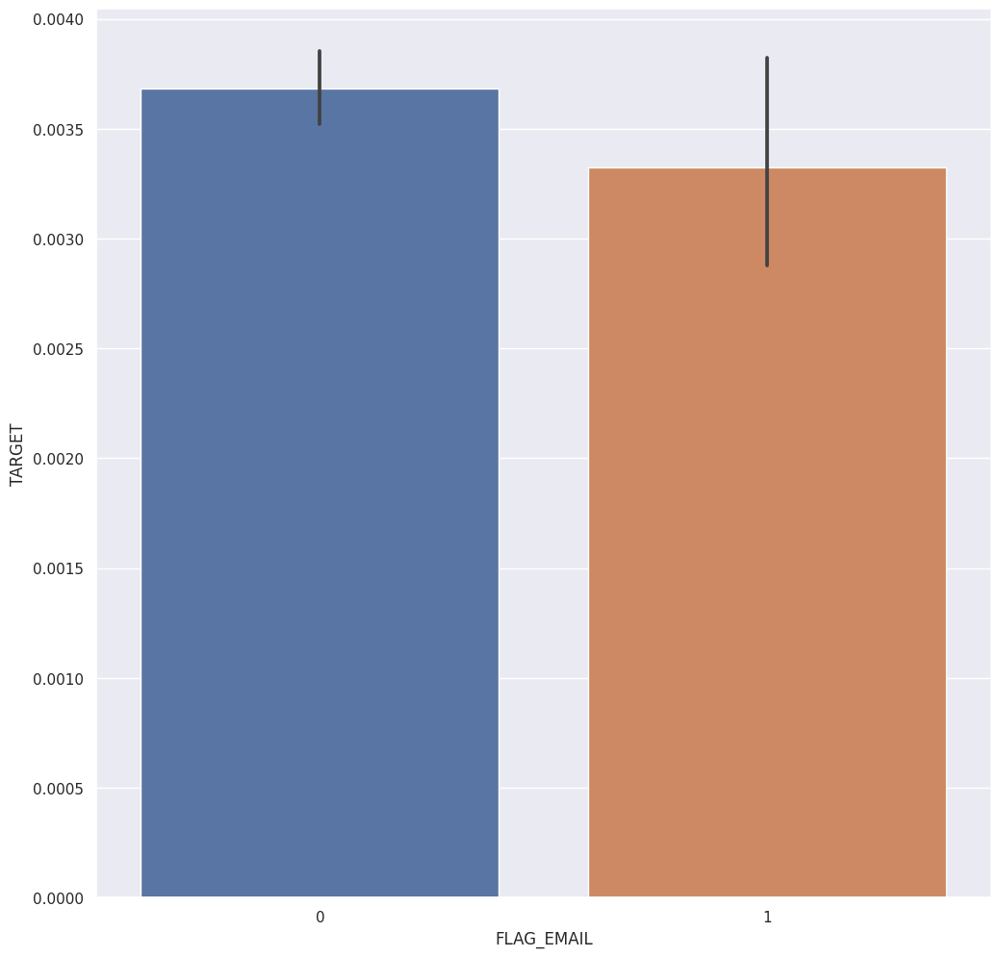

        TARGET_MEAN
TARGET             
0             0.000
1             1.000




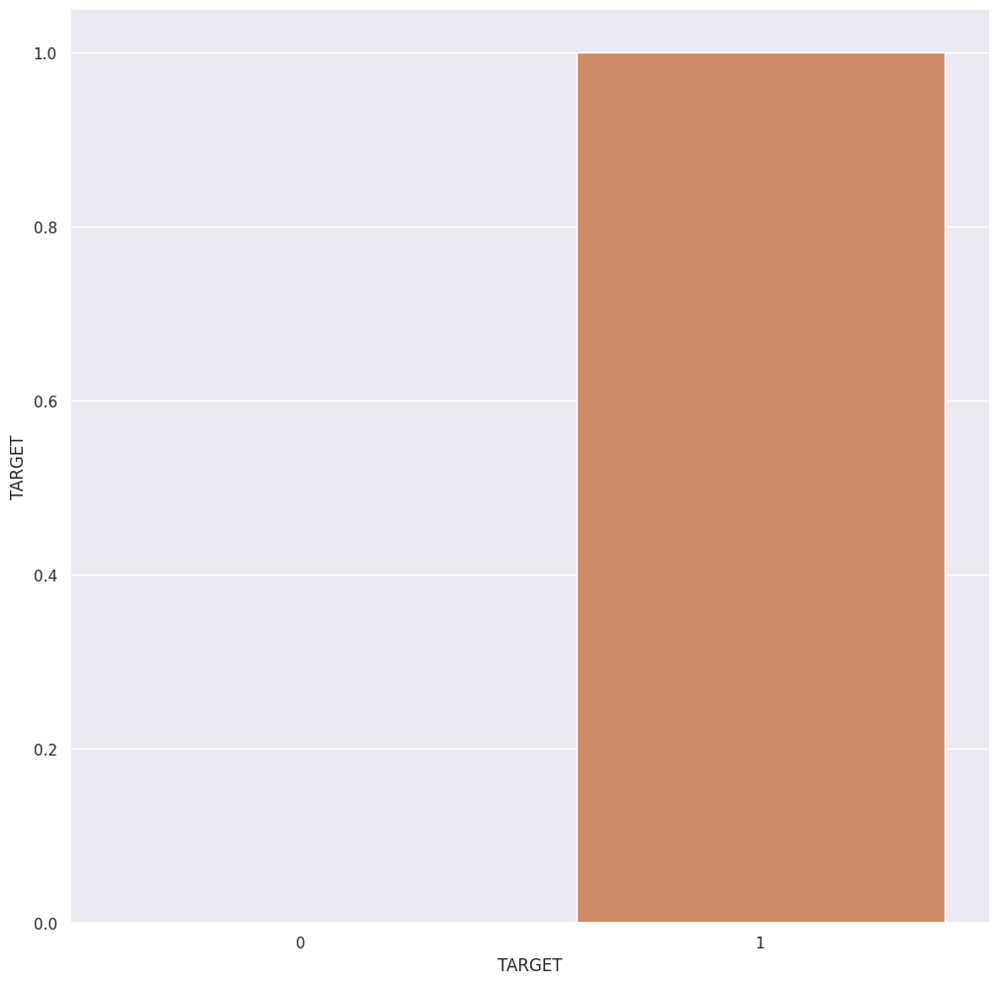

In [53]:
for col in cat_cols:
    target_summary_with_cat(df, "TARGET", col, plot=True)

# Analysis of Numeric Variables by Target Variable

In [54]:
def target_summary_with_num(dataframe, target, numerical_col, plot=False):
    print(pd.DataFrame({numerical_col+'_mean': dataframe.groupby(target)[numerical_col].mean()}), end='\n\n\n')
    if plot:
        sns.barplot(x=target, y=numerical_col, data=dataframe)
        plt.show(block=True)

           ID_mean
TARGET            
0      5079188.816
1      5090833.554




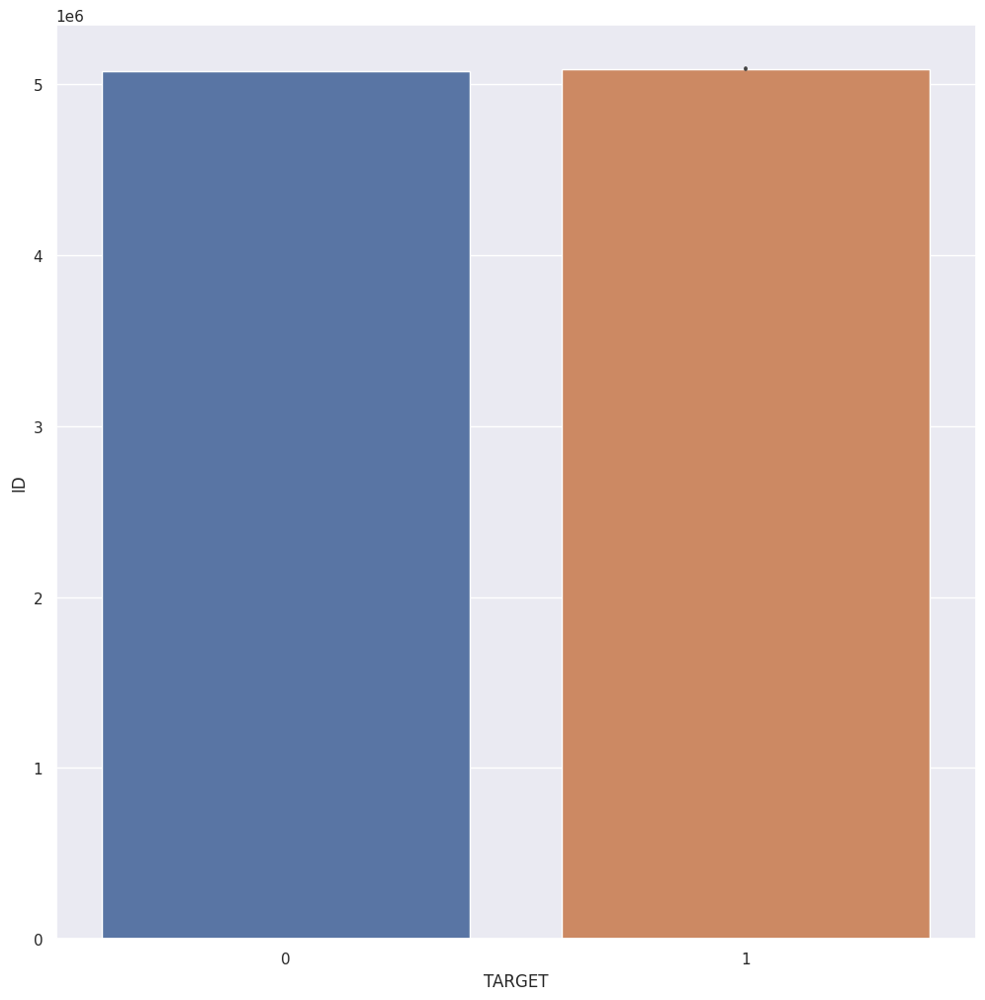

        AMT_INCOME_TOTAL_mean
TARGET                       
0                  197098.929
1                  202085.789




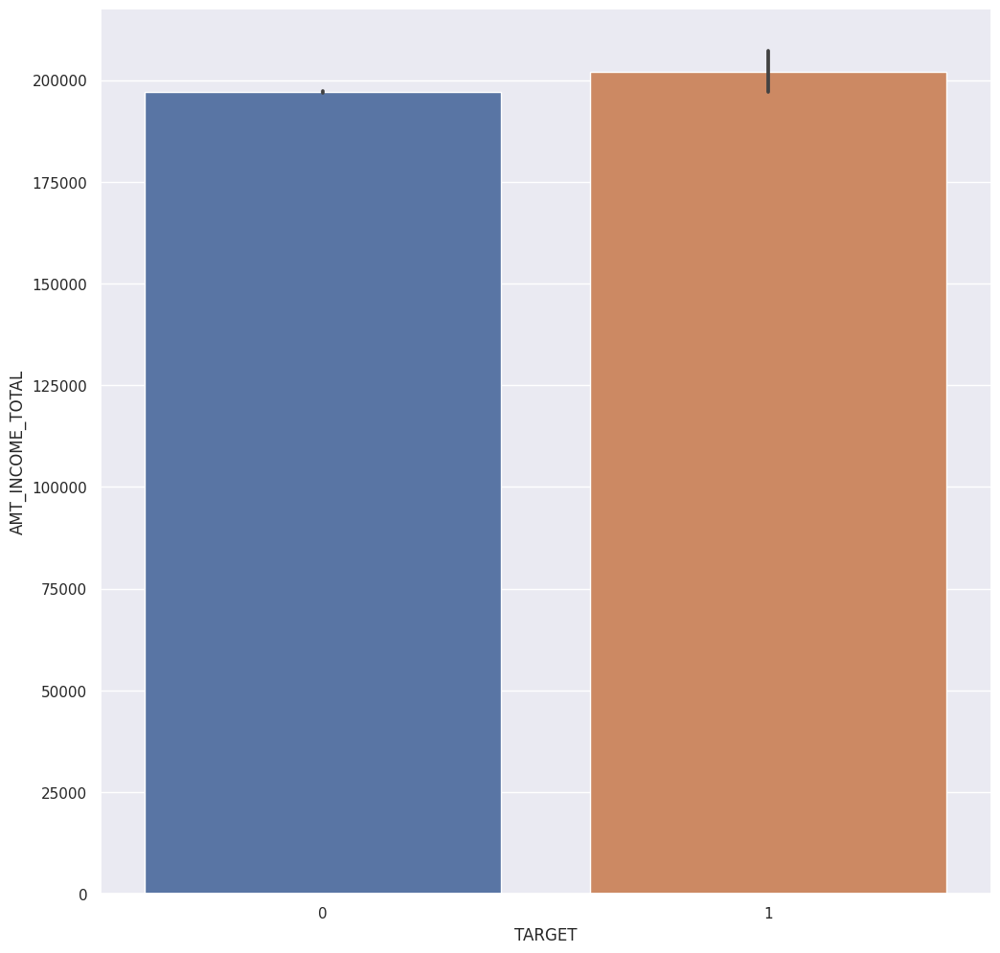

        DAYS_BIRTH_mean
TARGET                 
0            -15009.842
1            -15315.856




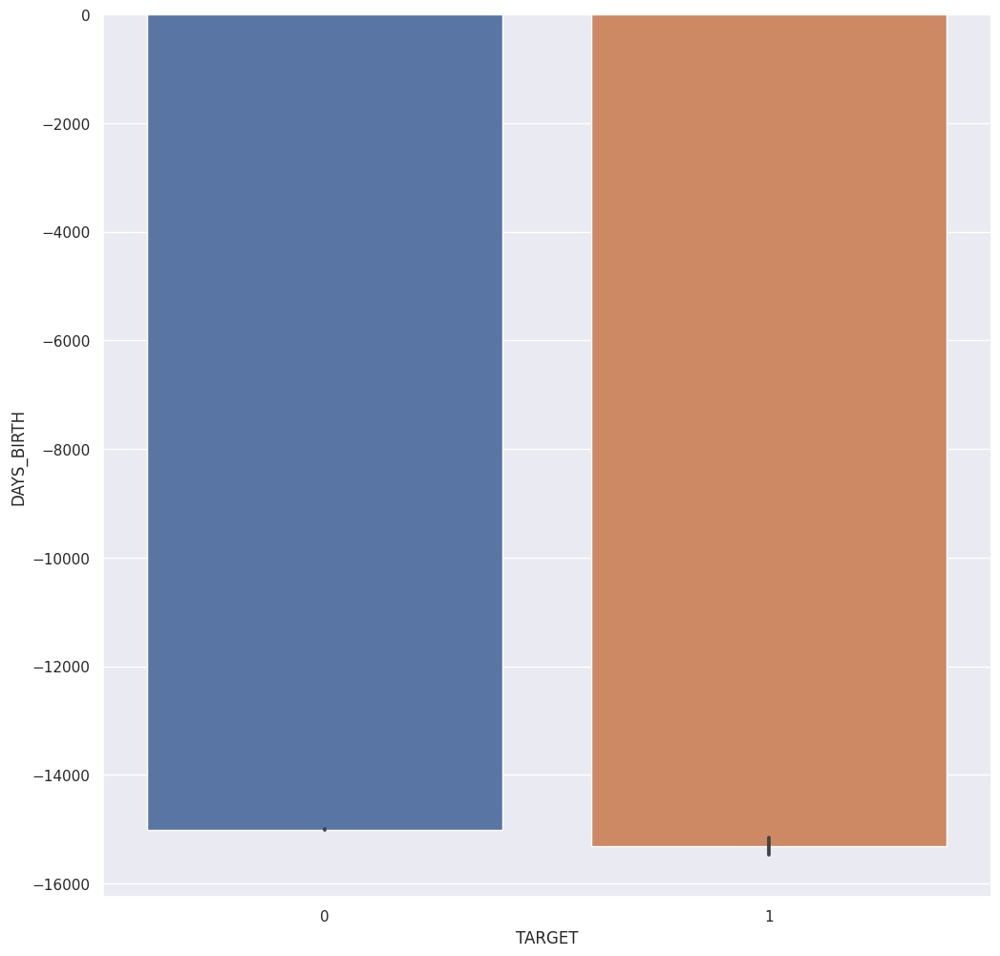

        DAYS_EMPLOYED_mean
TARGET                    
0                -2764.816
1                -2001.338




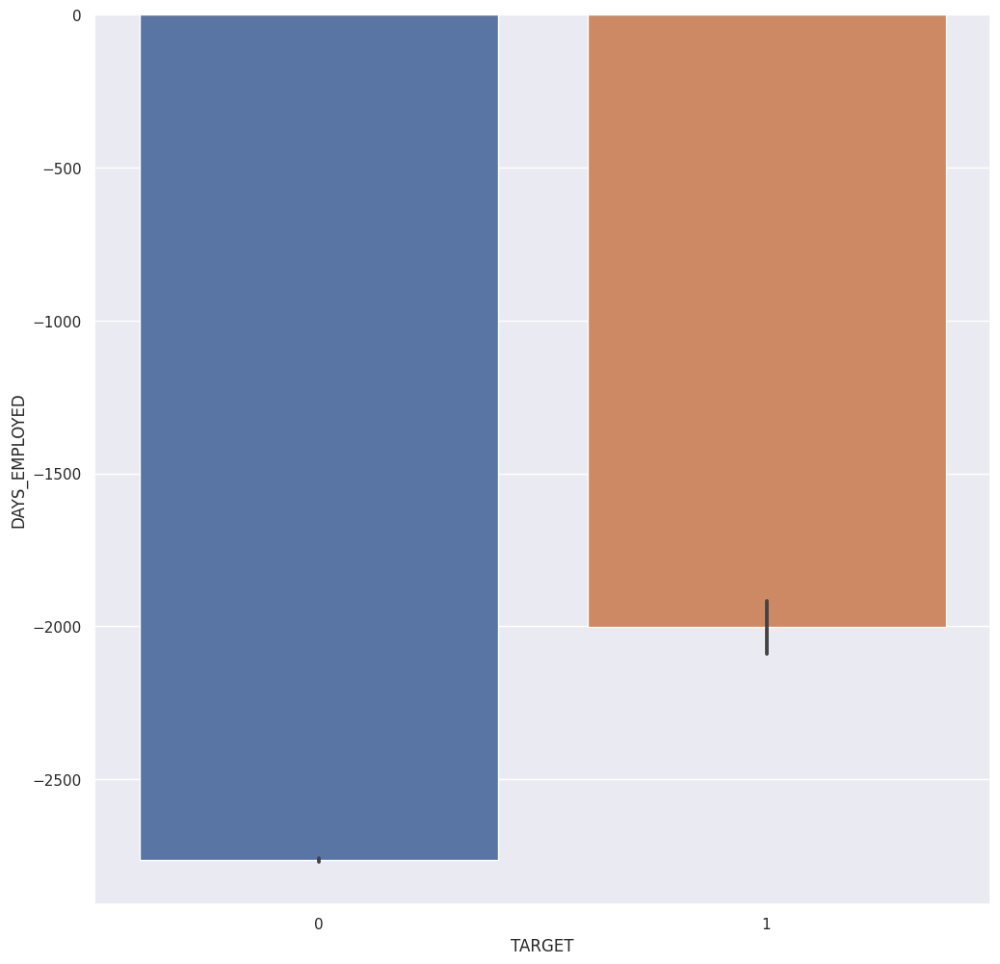

        BEGIN_MONTHS_mean
TARGET                   
0                 -19.304
1                 -19.687




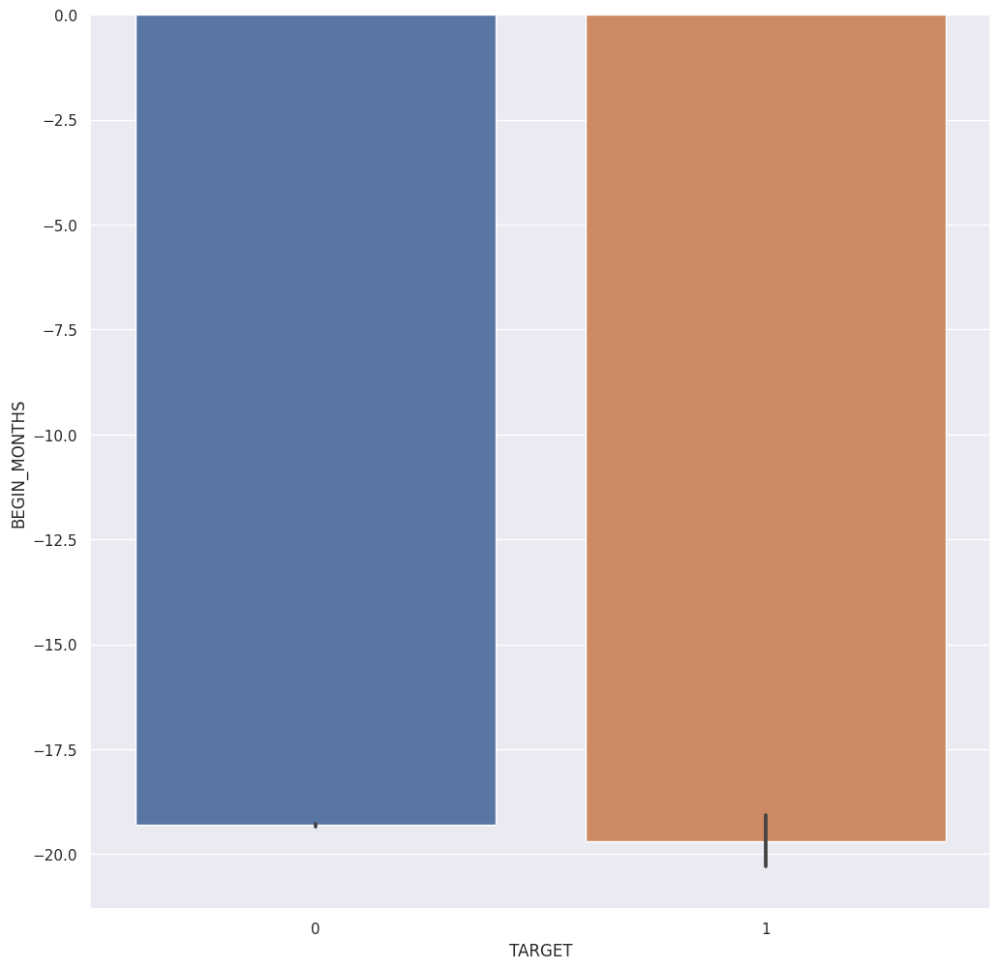

In [55]:
for col in num_cols:
    target_summary_with_num(df, "TARGET", col, plot=True)

# Target Variable Log Process

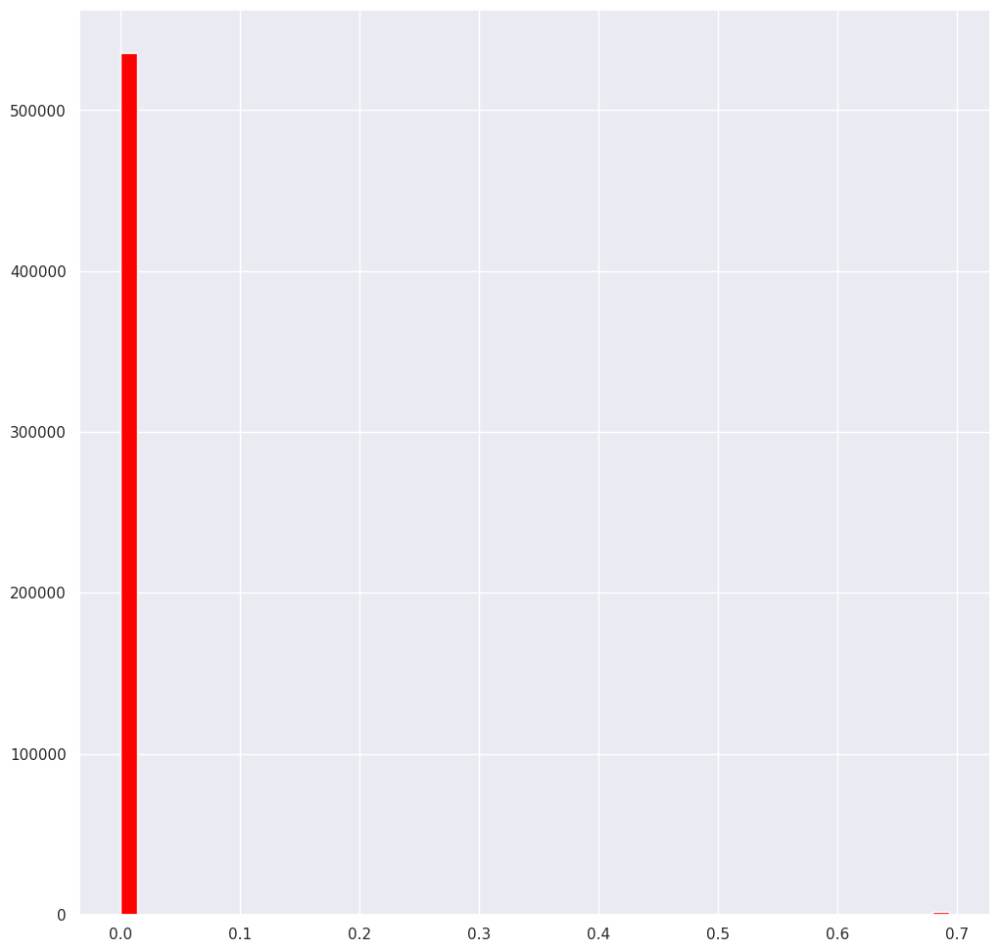

In [56]:
np.log1p(df["TARGET"]).hist(bins=50, color='red')
plt.show(block=True)

# Correlation Analysis With Numarical Variables

In [57]:
corr = df[num_cols].corr()

In [58]:
corr

,ID,AMT_INCOME_TOTAL,DAYS_BIRTH,DAYS_EMPLOYED,BEGIN_MONTHS
ID,1.000,-0.025,0.030,0.014,0.005
AMT_INCOME_TOTAL,-0.025,1.000,-0.048,-0.009,-0.002
DAYS_BIRTH,0.030,-0.048,1.000,0.324,0.051
DAYS_EMPLOYED,0.014,-0.009,0.324,1.000,0.044
BEGIN_MONTHS,0.005,-0.002,0.051,0.044,1.000


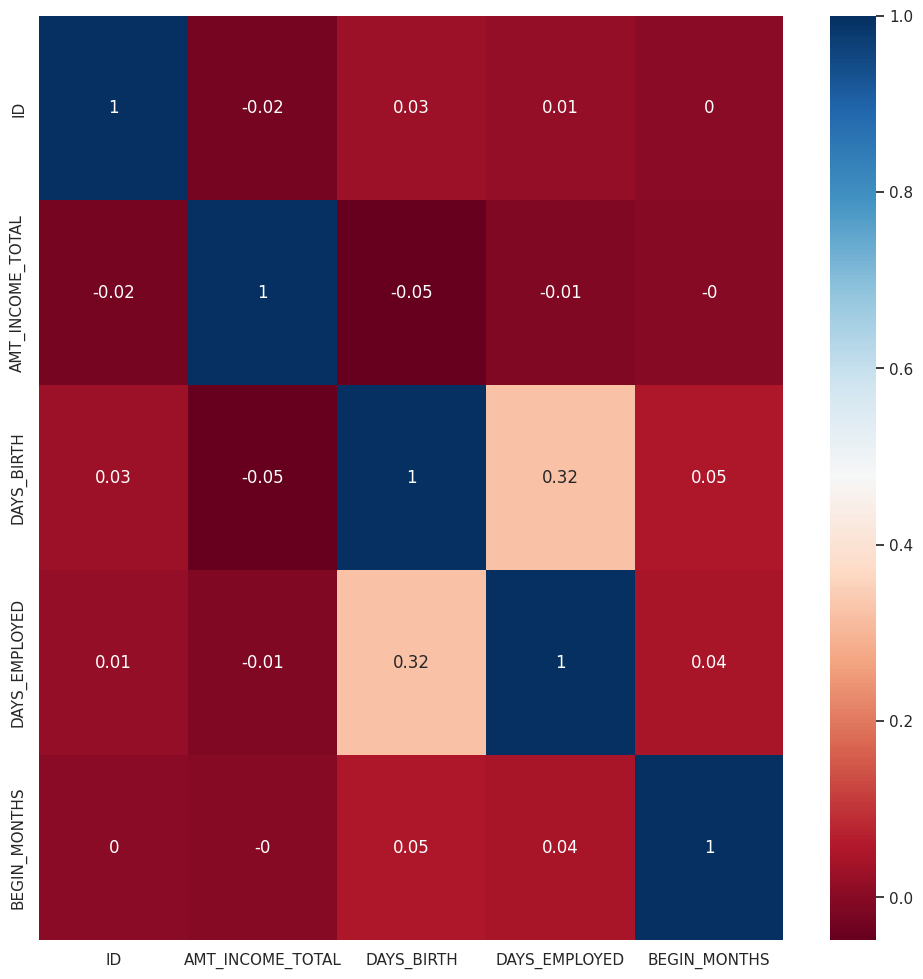

In [59]:
# Correlation heatmap without using functions

sns.set(rc={"figure.figsize": (12, 12)})
corr_values = corr.round(2)
sns.heatmap(corr, cmap="RdBu", annot=corr_values)
plt.show(block=True)

* **DAYS_EMPLOYED** and **DAYS_BIRTH** are positive and low correlation.(0.32)

# Target Variable Analysis

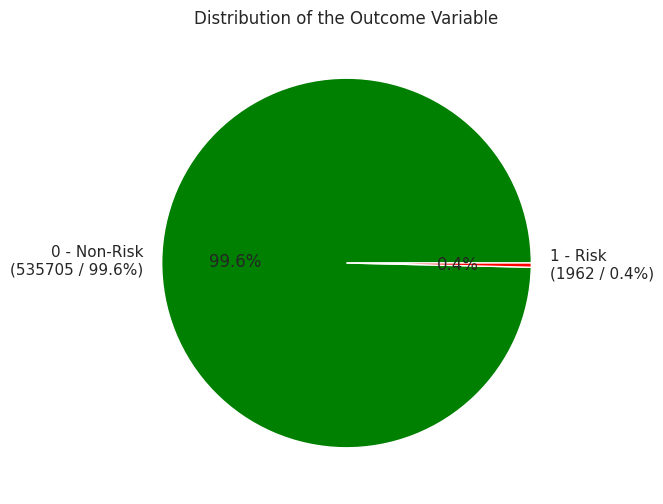

In [60]:
# Calculate the counts of each outcome
outcome_counts = df['TARGET'].value_counts()

# Calculate the total number of patients
total_patients = outcome_counts.sum()

# Calculate the percentages
percentages = outcome_counts / total_patients * 100

# Create labels with both quantity and percentage
labels = [f'0 - Non-Risk\n({outcome_counts[0]} / {percentages[0]:.1f}%)',
          f'1 - Risk\n({outcome_counts[1]} / {percentages[1]:.1f}%)']

# Plot the pie chart with labels and percentages
plt.figure(figsize=(8, 6))
plt.pie(outcome_counts, labels=labels, autopct='%1.1f%%', colors=['green', 'red'])
plt.title('Distribution of the Outcome Variable')
plt.show()

* **%0.4** has a risk for credit card applicants.(1962 applicants or people/women/men)

# FLAG_MOBIL Variable Process And Control

In [144]:
col = 'FLAG_MOBIL'

print(f"'{col}' değişkeni için özet:")
print(f"- Boş değer sayısı       : {df[col].isnull().sum()}")
print(f"- Boş değer oranı (%)     : {100 * df[col].isnull().mean():.2f}")
print(f"- Eşsiz değer sayısı      : {df[col].nunique()}")
print(f"- Eşsiz değerler          : {df[col].unique()}")


'FLAG_MOBIL' değişkeni için özet:
- Boş değer sayısı       : 0
- Boş değer oranı (%)     : 0.00
- Eşsiz değer sayısı      : 1
- Eşsiz değerler          : [1]


* FLAG_MOBILE has only a value and that does not mean to data and project; thus, this should delete from data and we should continue clear data.

**Deleting Process**

In [145]:
df.drop(columns=['FLAG_MOBIL'], inplace=True)

**Control Process**

In [146]:
'FLAG_MOBIL' in df.columns

False

# Numerical Variables Visualisation

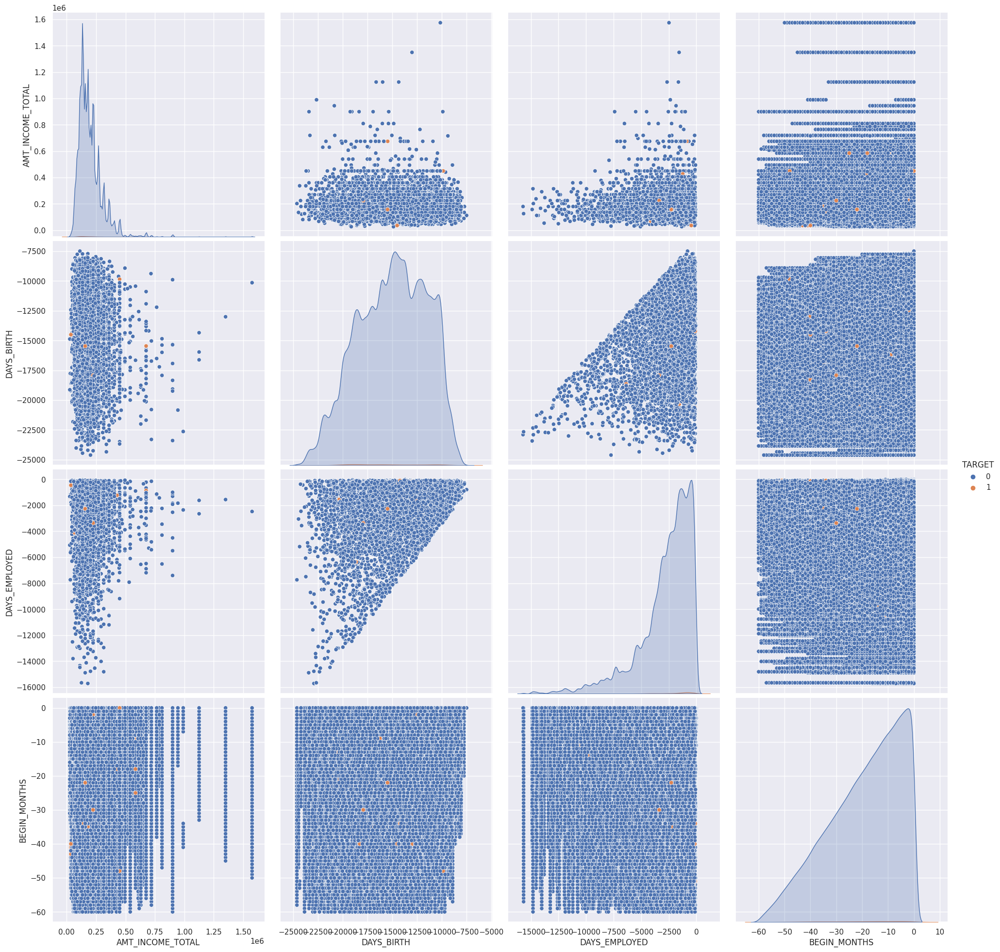

In [64]:
sns.pairplot(data=df, vars=['AMT_INCOME_TOTAL', 'DAYS_BIRTH', 'DAYS_EMPLOYED', 'BEGIN_MONTHS'], hue='TARGET', height=5)
plt.show(block=True)

# Pairwise Cramér's V Heatmap (Kategorik Korelasyon Haritası)

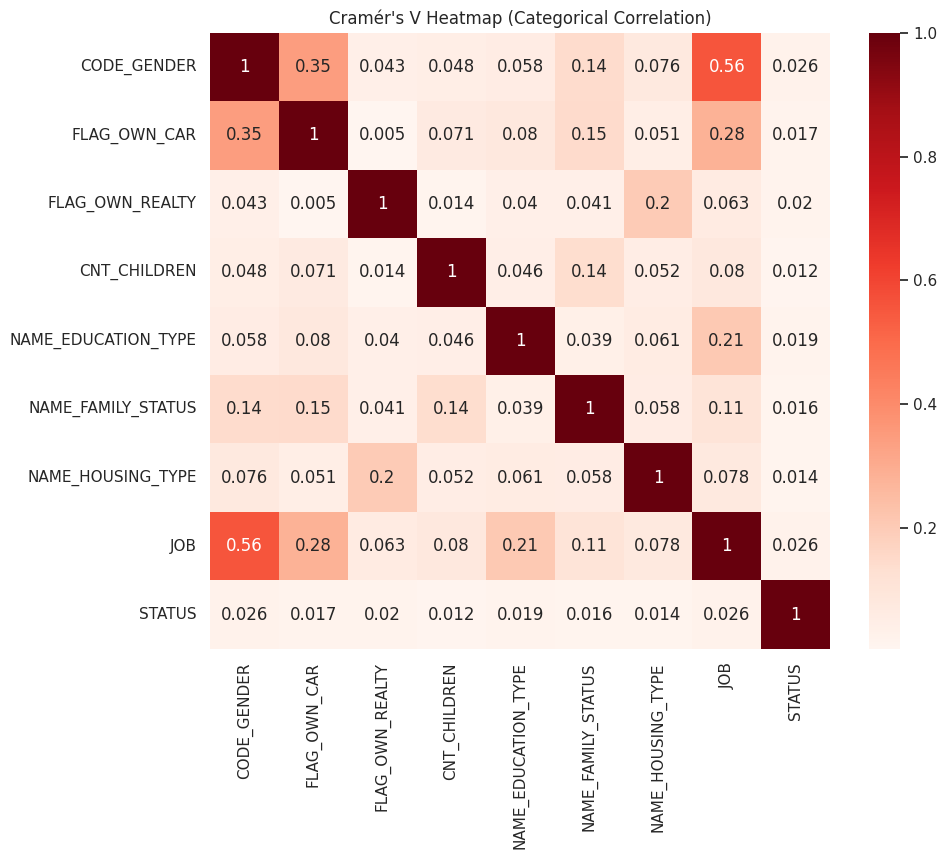

In [68]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import chi2_contingency

def cramers_v(x, y):
    confusion_matrix = pd.crosstab(x, y)
    chi2 = chi2_contingency(confusion_matrix)[0]
    n = confusion_matrix.sum().sum()
    phi2 = chi2 / n
    r,k = confusion_matrix.shape
    phi2corr = max(0, phi2 - ((k-1)*(r-1))/(n-1))
    rcorr = r - ((r-1)**2)/(n-1)
    kcorr = k - ((k-1)**2)/(n-1)
    return np.sqrt(phi2corr / min((kcorr-1), (rcorr-1)))

categorical_cols = df.select_dtypes(include='object').columns.tolist()
cramers_results = pd.DataFrame(index=categorical_cols, columns=categorical_cols)

for col1 in categorical_cols:
    for col2 in categorical_cols:
        if col1 == col2:
            cramers_results.loc[col1, col2] = 1.0
        else:
            cramers_results.loc[col1, col2] = cramers_v(df[col1], df[col2])

plt.figure(figsize=(10, 8))
sns.heatmap(cramers_results.astype(float), annot=True, cmap='Reds')
plt.title("Cramér's V Heatmap (Categorical Correlation)")
plt.show()


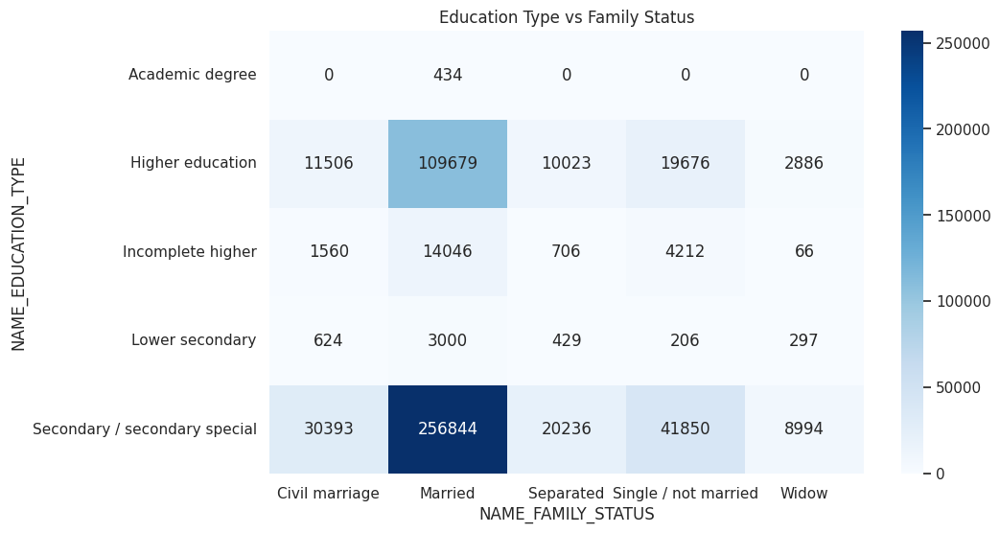

In [72]:
import seaborn as sns
import pandas as pd
import matplotlib.pyplot as plt

cross_tab = pd.crosstab(df['NAME_EDUCATION_TYPE'], df['NAME_FAMILY_STATUS'])
plt.figure(figsize=(10,6))
sns.heatmap(cross_tab, annot=True, fmt='d', cmap='Blues')
plt.title('Education Type vs Family Status')
plt.show()


# Kategorik Değişkenlerin Heatmap İle (Çapraz Frekans Tablosu ile) Görselleştirilmesi

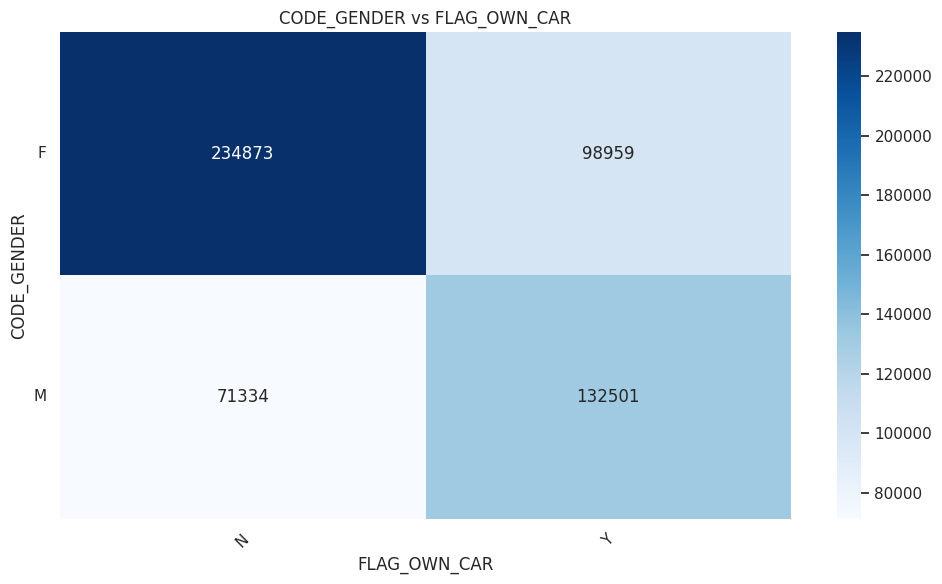

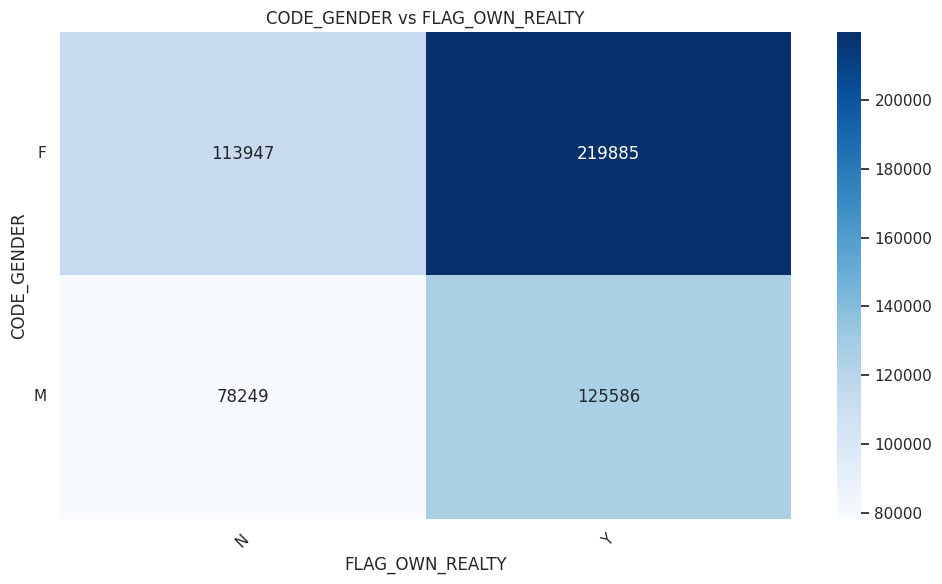

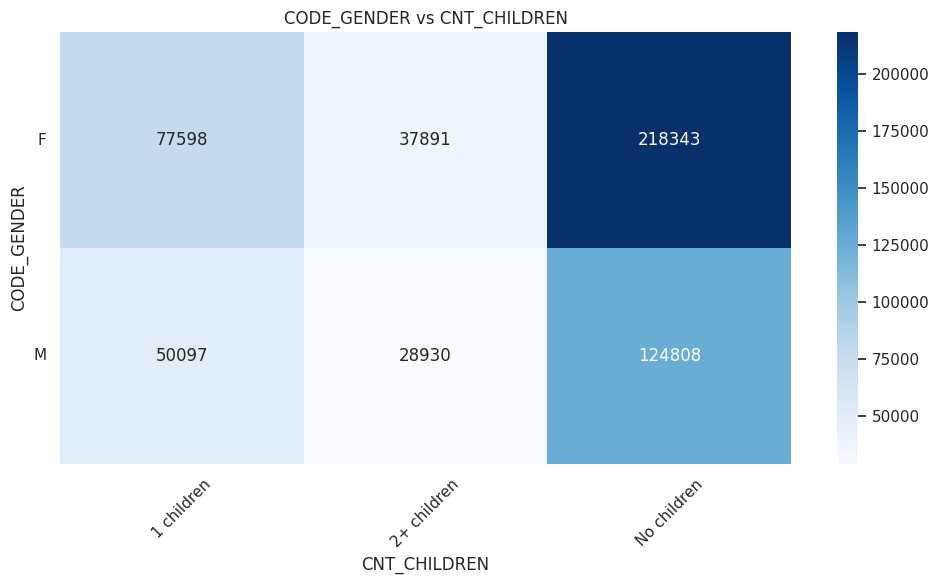

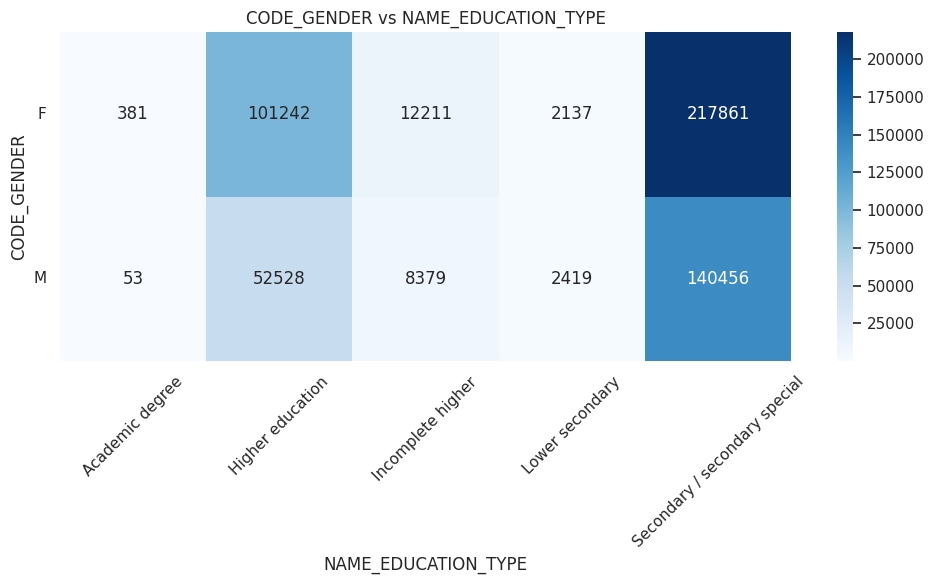

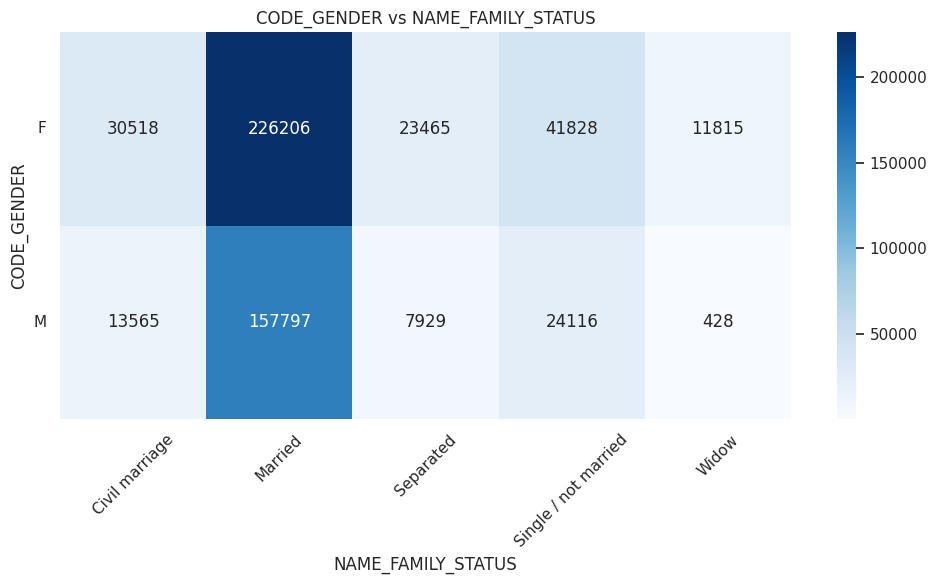

...

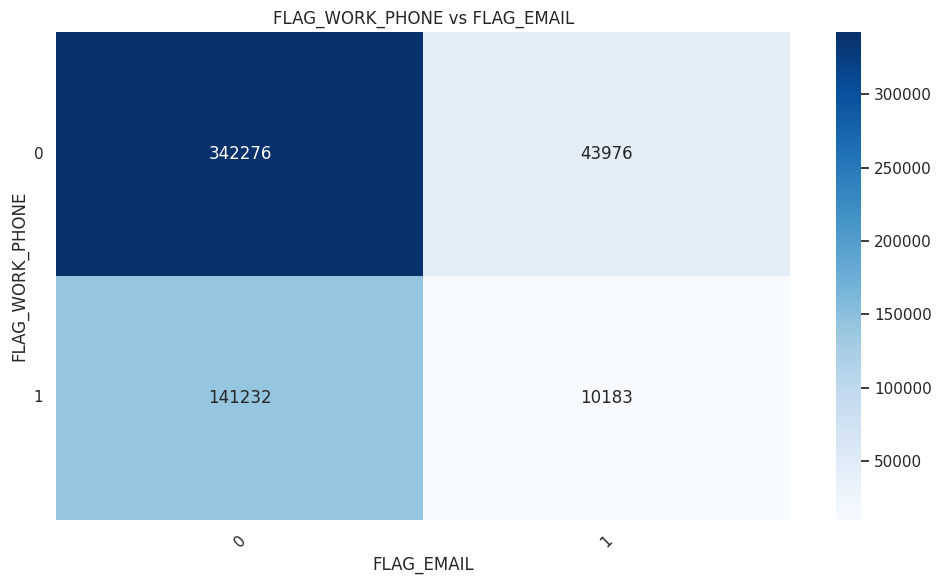

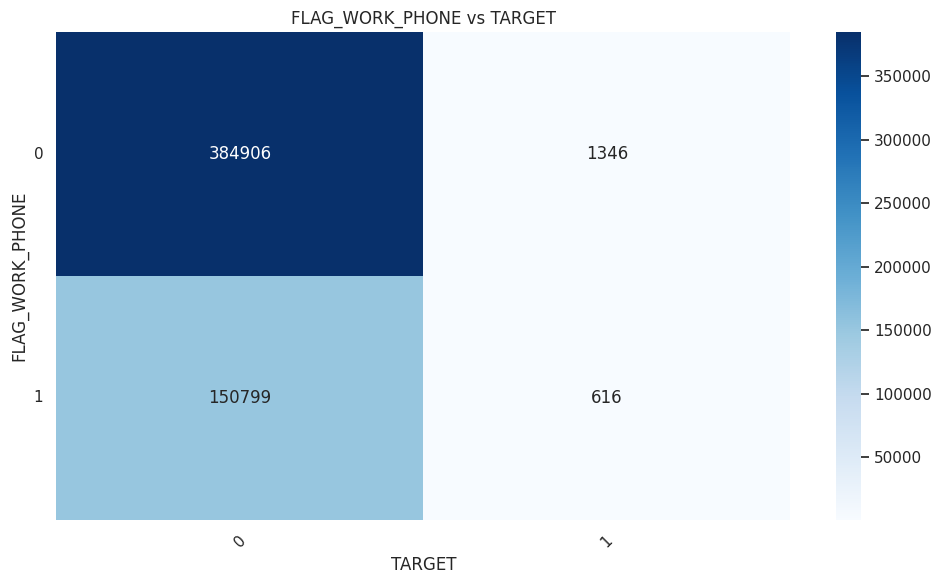

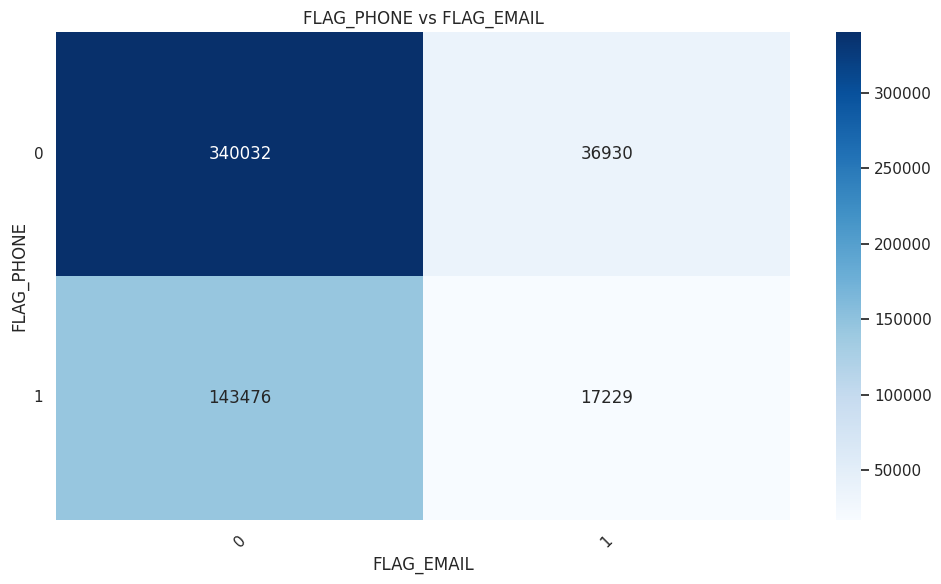

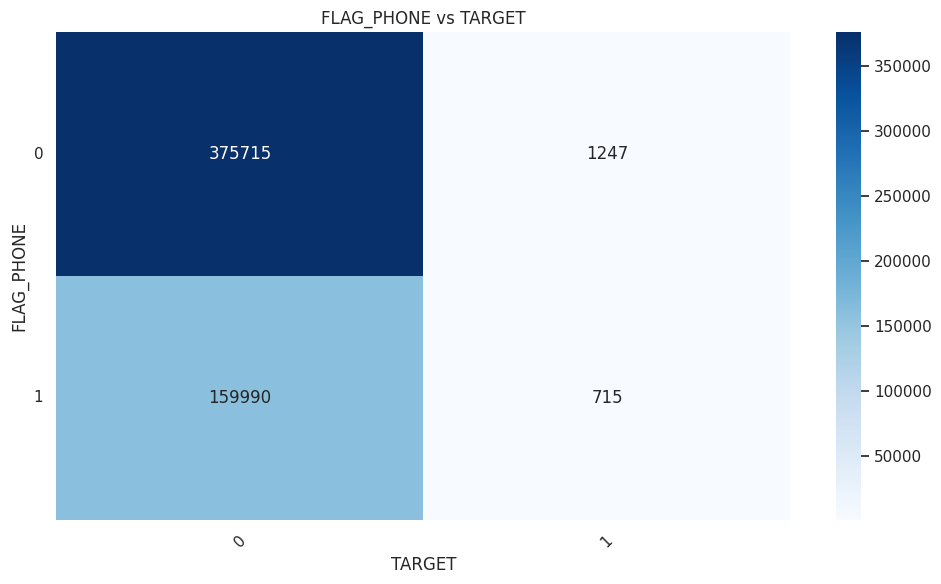

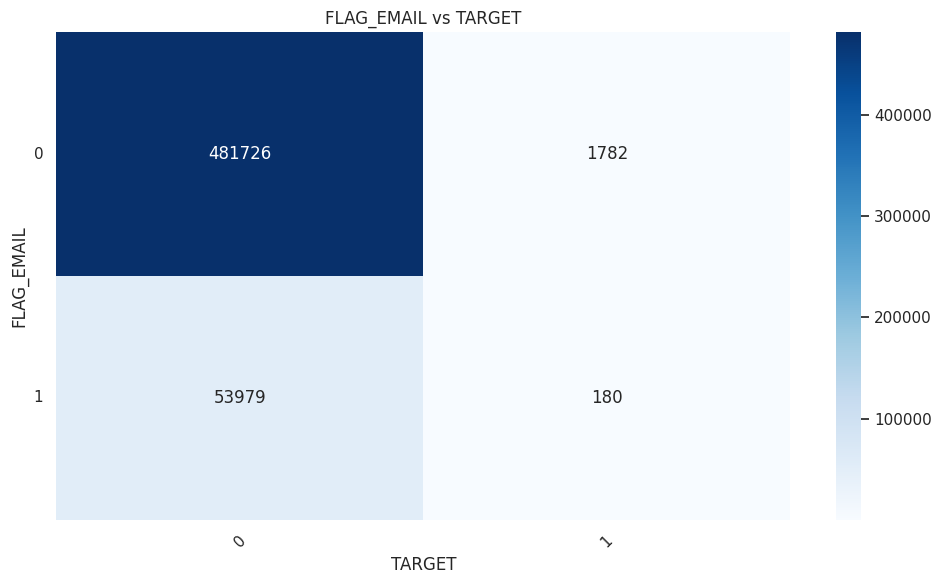

In [73]:
import seaborn as sns
import pandas as pd
import matplotlib.pyplot as plt
from itertools import combinations

# Kullanılacak kategorik sütunlar
categorical_columns = [
    'CODE_GENDER',
    'FLAG_OWN_CAR',
    'FLAG_OWN_REALTY',
    'CNT_CHILDREN',
    'NAME_EDUCATION_TYPE',
    'NAME_FAMILY_STATUS',
    'NAME_HOUSING_TYPE',
    'JOB',
    'STATUS',
    'FLAG_WORK_PHONE',
    'FLAG_PHONE',
    'FLAG_EMAIL',
    'TARGET'
]

# İkili kombinasyonlarını oluştur
combinations_list = list(combinations(categorical_columns, 2))

# Her kombinasyon için heatmap çiz
for col1, col2 in combinations_list:
    try:
        cross_tab = pd.crosstab(df[col1], df[col2])
        plt.figure(figsize=(10, 6))
        sns.heatmap(cross_tab, annot=True, fmt='d', cmap='Blues')
        plt.title(f'{col1} vs {col2}')
        plt.xlabel(col2)
        plt.ylabel(col1)
        plt.xticks(rotation=45)
        plt.yticks(rotation=0)
        plt.tight_layout()
        plt.show()
    except Exception as e:
        print(f"Error while plotting {col1} vs {col2}: {e}")


# Binary Categorical Variables Visualisation

In [ ]:
# Create combinations of binary categorical variables
#feature_combinations = list(itertools.combinations(['CODE_GENDER',
 #'FLAG_OWN_CAR',
 #'FLAG_OWN_REALTY',
 #'CNT_CHILDREN',
 #'NAME_EDUCATION_TYPE',
# 'NAME_FAMILY_STATUS','TARGET'], 2))

# Create a separate Bubble Chart for each binary categorical variable
#for i, (feature1, feature2) in enumerate(feature_combinations):
 #   fig = px.scatter(df, x=feature1, y=feature2, color='TARGET', size='TARGET',
  #                   title=f'{feature1} vs {feature2} Bubble Chart')

   # fig.show(block=True)

In [ ]:
# Create combinations of binary categorical variables
 #feature_combinations = list(itertools.combinations(['NAME_HOUSING_TYPE',
 # 'JOB',
  #'STATUS',
  #'FLAG_WORK_PHONE',
  #'FLAG_PHONE',
  #'FLAG_EMAIL',
  #'TARGET'], 2))

# Create a separate Bubble Chart for each binary categorical variable
 #for i, (feature1, feature2) in enumerate(feature_combinations):
    # fig = px.scatter(df, x=feature1, y=feature2, color='TARGET', size='TARGET',
        #              title=f'{feature1} vs {feature2} Bubble Chart')

    # fig.show(block=True)

* **Because of CPU.**

In [147]:
# Hem eşsiz değer sayısı hem de değerleri göster
for col in cat_cols:
    if col != 'FLAG_MOBIL':
        print(f"\n{col} ({df[col].nunique()} eşsiz değer):")
        print(df[col].unique())



CODE_GENDER (2 eşsiz değer):
['F' 'M']

FLAG_OWN_CAR (2 eşsiz değer):
['Y' 'N']

FLAG_OWN_REALTY (2 eşsiz değer):
['N' 'Y']

CNT_CHILDREN (3 eşsiz değer):
['2+ children' 'No children' '1 children']

NAME_EDUCATION_TYPE (5 eşsiz değer):
['Secondary / secondary special' 'Higher education' 'Incomplete higher'
 'Lower secondary' 'Academic degree']

NAME_FAMILY_STATUS (5 eşsiz değer):
['Married' 'Single / not married' 'Civil marriage' 'Separated' 'Widow']

NAME_HOUSING_TYPE (6 eşsiz değer):
['With parents' 'House / apartment' 'Rented apartment'
 'Municipal apartment' 'Co-op apartment' 'Office apartment']

JOB (18 eşsiz değer):
['Managers' 'Private service staff' 'Laborers' 'Core staff' 'Drivers'
 'High skill tech staff' 'Realty agents' 'Secretaries' 'Accountants'
 'Sales staff' 'Medicine staff' 'Waiters/barmen staff'
 'Low-skill Laborers' 'Cleaning staff' 'HR staff' 'Cooking staff'
 'Security staff' 'IT staff']

STATUS (8 eşsiz değer):
['C' '0' 'X' '2' '1' '5' '3' '4']

FLAG_WORK_PHONE (2 

In [148]:
for col in cat_cols:
    if col != 'FLAG_MOBIL' and df[col].nunique() == 2:
        print(f"\n{col} ({df[col].nunique()} eşsiz değer):")
        print(df[col].unique())


CODE_GENDER (2 eşsiz değer):
['F' 'M']

FLAG_OWN_CAR (2 eşsiz değer):
['Y' 'N']

FLAG_OWN_REALTY (2 eşsiz değer):
['N' 'Y']

FLAG_WORK_PHONE (2 eşsiz değer):
[0 1]

FLAG_PHONE (2 eşsiz değer):
[0 1]

FLAG_EMAIL (2 eşsiz değer):
[0 1]

TARGET (2 eşsiz değer):
[0 1]


In [149]:
binary_cols = [col for col in cat_cols if col in df.columns and df[col].nunique() == 2 and col != 'FLAG_MOBIL']
binary_cols

['CODE_GENDER',
 'FLAG_OWN_CAR',
 'FLAG_OWN_REALTY',
 'FLAG_WORK_PHONE',
 'FLAG_PHONE',
 'FLAG_EMAIL',
 'TARGET']

In [150]:
from sklearn.preprocessing import LabelEncoder

le = LabelEncoder()

for col in binary_cols:
    df[col] = le.fit_transform(df[col])

In [151]:
df.head()

,ID,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,DAYS_BIRTH,DAYS_EMPLOYED,FLAG_WORK_PHONE,FLAG_PHONE,FLAG_EMAIL,JOB,BEGIN_MONTHS,STATUS,TARGET
0,5065438,0,1,0,2+ children,270000.000,Secondary / secondary special,Married,With parents,-13258,-2300,0,0,0,Managers,-6,C,0
1,5142753,0,0,0,No children,81000.000,Secondary / secondary special,Single / not married,House / apartment,-17876,-377,1,1,0,Private service staff,-4,0,0
2,5111146,1,1,1,No children,270000.000,Higher education,Married,House / apartment,-19579,-1028,0,1,0,Laborers,0,C,0
3,5010310,0,1,1,1 children,112500.000,Secondary / secondary special,Married,House / apartment,-15109,-1956,0,0,0,Core staff,-3,0,0
4,5010835,1,1,1,2+ children,139500.000,Secondary / secondary special,Married,House / apartment,-17281,-5578,1,0,0,Drivers,-29,0,0


In [87]:
job_risk = df.groupby("JOB")["TARGET"].mean().sort_values()
job_risk

JOB
Realty agents           0.000
HR staff                0.001
Private service staff   0.001
Secretaries             0.001
Sales staff             0.002
Medicine staff          0.002
Cleaning staff          0.002
Accountants             0.003
Laborers                0.003
Waiters/barmen staff    0.004
Core staff              0.004
Managers                0.004
Cooking staff           0.004
Drivers                 0.004
High skill tech staff   0.004
Security staff          0.013
IT staff                0.016
Low-skill Laborers      0.017
Name: TARGET, dtype: float64

In [88]:
print(f"JOB ({df['JOB'].nunique()} eşsiz değer):")
print(df['JOB'].unique())

JOB (18 eşsiz değer):
['Managers' 'Private service staff' 'Laborers' 'Core staff' 'Drivers'
 'High skill tech staff' 'Realty agents' 'Secretaries' 'Accountants'
 'Sales staff' 'Medicine staff' 'Waiters/barmen staff'
 'Low-skill Laborers' 'Cleaning staff' 'HR staff' 'Cooking staff'
 'Security staff' 'IT staff']


# 🔢 CNT_CHILDREN with Ordinal Encoding

* Ekonomik yük açısından sıralanmalı (çocuk sayısı arttıkça yük artar)

In [152]:
print(df['CNT_CHILDREN'].unique())

['2+ children' 'No children' '1 children']


In [153]:
print(df['CNT_CHILDREN'].nunique())

3


In [154]:
df['CNT_CHILDREN'].head()

0    2+ children
1    No children
2    No children
3     1 children
4    2+ children
Name: CNT_CHILDREN, dtype: object

In [155]:
children_map = {
    'No children': 0,
    '1 children': 1,
    '2+ children': 2
}
df['CNT_CHILDREN'] = df['CNT_CHILDREN'].map(children_map)


In [156]:
df['CNT_CHILDREN'].head()

0    2
1    0
2    0
3    1
4    2
Name: CNT_CHILDREN, dtype: int64

# 🎓 NAME_EDUCATION_TYPE With Ordinal Encoding

In [157]:
education_map = {
    'Lower secondary': 1,
    'Secondary / secondary special': 2,
    'Incomplete higher': 3,
    'Higher education': 4,
    'Academic degree': 5
}
df['NAME_EDUCATION_TYPE'] = df['NAME_EDUCATION_TYPE'].map(education_map)


In [158]:
df['NAME_EDUCATION_TYPE'].head()

0    2
1    2
2    4
3    2
4    2
Name: NAME_EDUCATION_TYPE, dtype: int64

# 👪 NAME_FAMILY_STATUS With Ordinal Encoding

In [159]:
family_map = {
    'Married': 0,
    'Civil marriage': 1,
    'Single / not married': 2,
    'Widow': 3,
    'Separated': 4
}
df['NAME_FAMILY_STATUS'] = df['NAME_FAMILY_STATUS'].map(family_map)


In [160]:
df['NAME_FAMILY_STATUS'].head()

0    0
1    2
2    0
3    0
4    0
Name: NAME_FAMILY_STATUS, dtype: int64

Aile durumu risk sıralamasına göre değerlendirilebilir. Genelde:

* Evli kişiler daha stabil olabilir.

* Bekâr, boşanmış ve dul kişiler daha yüksek riskli olabilir.

# 🏠 NAME_HOUSING_TYPE With Ordinal Encoding

In [161]:
housing_map = {
    'House / apartment': 0,           # Sahip olunan
    'Co-op apartment': 1,             # Ortak sahiplik
    'With parents': 2,                # Aile yanında
    'Municipal apartment': 3,         # Kamu konutu
    'Rented apartment': 4,            # Kira
    'Office apartment': 5             # İş yeri adresi, riskli
}
df['NAME_HOUSING_TYPE'] = df['NAME_HOUSING_TYPE'].map(housing_map)

In [162]:
df['NAME_HOUSING_TYPE'].head()

0    2
1    0
2    0
3    0
4    0
Name: NAME_HOUSING_TYPE, dtype: int64

# 👷‍♂️ JOB With Ordinal Encoding

Meslek grupları maaş, iş güvencesi ve toplumsal prestij açısından sıralanabilir. 

Aşağıdaki sıralama ekonomik güç ve eğitim seviyesi gözetilerek yapılmıştır.

(0 en yüksek, 17 en düşük):

In [163]:
job_order = [
    'Managers', 'High skill tech staff', 'IT staff', 'Accountants',
    'Core staff', 'HR staff', 'Medicine staff', 'Sales staff',
    'Realty agents', 'Drivers', 'Security staff', 'Private service staff',
    'Cooking staff', 'Cleaning staff', 'Secretaries',
    'Waiters/barmen staff', 'Laborers', 'Low-skill Laborers'
]

job_map = {job: i for i, job in enumerate(job_order)}
df['JOB'] = df['JOB'].map(job_map)


In [164]:
df['JOB'].head()

0     0
1    11
2    16
3     4
4     9
Name: JOB, dtype: int64

# 📊 STATUS With Ordinal Encoding

| Değer | Anlamı (muhtemel)                                                  |
| ----- | ------------------------------------------------------------------ |
| `'0'` | Ödeme zamanında                                                    |
| `'1'` | 1 ay gecikme                                                       |
| `'2'` | 2 ay gecikme                                                       |
| `'3'` | 3 ay gecikme                                                       |
| `'4'` | 4 ay gecikme                                                       |
| `'5'` | 5+ ay gecikme                                                      |
| `'C'` | **Closed** (hesap kapatıldı veya kredi ödendi) ✅                   |
| `'X'` | **No loan / No history** (kredi yok, veri eksik veya bilinmeyen) ❓ |


🧠 Yorum:
C: Kredi tamamen ödenmiş olabilir (risksiz veya düşük riskli kabul edilir).

X: Hiç kredi almamış ya da verisi olmayan müşteri olabilir (riskli de olabilir, model belirsizliğe karşı dikkatli olmalı).

In [165]:
status_order = ['0', '1', '2', '3', '4', '5', 'C', 'X']
status_map = {k: i for i, k in enumerate(status_order)}
df['STATUS'] = df['STATUS'].map(status_map)

In [166]:
df['STATUS'].head()

0    6
1    0
2    6
3    0
4    0
Name: STATUS, dtype: int64

In [167]:
df.head()

,ID,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,DAYS_BIRTH,DAYS_EMPLOYED,FLAG_WORK_PHONE,FLAG_PHONE,FLAG_EMAIL,JOB,BEGIN_MONTHS,STATUS,TARGET
0,5065438,0,1,0,2,270000.000,2,0,2,-13258,-2300,0,0,0,0,-6,6,0
1,5142753,0,0,0,0,81000.000,2,2,0,-17876,-377,1,1,0,11,-4,0,0
2,5111146,1,1,1,0,270000.000,4,0,0,-19579,-1028,0,1,0,16,0,6,0
3,5010310,0,1,1,1,112500.000,2,0,0,-15109,-1956,0,0,0,4,-3,0,0
4,5010835,1,1,1,2,139500.000,2,0,0,-17281,-5578,1,0,0,9,-29,0,0


In [168]:
df.tail()

,ID,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,DAYS_BIRTH,DAYS_EMPLOYED,FLAG_WORK_PHONE,FLAG_PHONE,FLAG_EMAIL,JOB,BEGIN_MONTHS,STATUS,TARGET
537662,5142999,1,1,0,1,166500.000,2,0,2,-12372,-5401,0,1,0,4,-8,0,0
537663,5010773,0,0,1,0,135000.000,4,0,2,-14160,-4635,0,0,0,7,-8,0,0
537664,5105601,1,0,1,0,180000.000,4,0,0,-24204,-2462,0,0,0,11,-7,0,0
537665,5132833,1,1,0,0,220500.000,2,0,0,-22647,-3847,0,1,0,16,-1,0,0
537666,5135381,0,0,1,0,387000.000,2,0,0,-20082,-4979,0,0,0,7,-45,6,0


# 📌 BEGIN_MONTHS With Positive Change For Model Evaluation

In [169]:
df["BEGIN_MONTHS"] = -df["BEGIN_MONTHS"]

In [170]:
df["BEGIN_MONTHS"].head()

0     6
1     4
2     0
3     3
4    29
Name: BEGIN_MONTHS, dtype: int64

# 📌 DAYS_BIRTH With Positive And Real Age Change For Model Evaluation 

In [171]:
df["DAYS_BIRTH"] = (-df["DAYS_BIRTH"]) // 365

In [172]:
df["DAYS_BIRTH"].head()

0    36
1    48
2    53
3    41
4    47
Name: DAYS_BIRTH, dtype: int64

# 📌 DAYS_EMPLOYED With Positive And Real Day-Year Change For Model Evaluation

In [173]:
df["DAYS_EMPLOYED"].value_counts().head()

DAYS_EMPLOYED
-1539    1528
-1812    1219
-401     1196
-309     1154
-2531    1122
Name: count, dtype: int64

In [174]:
(365243 in df["DAYS_EMPLOYED"].values)

False

In [175]:
df[df["DAYS_EMPLOYED"] == 365243].shape[0]

0

In [176]:
df["DAYS_EMPLOYED"] = df["DAYS_EMPLOYED"].replace(365243, np.nan)
df["DAYS_EMPLOYED"] = (-df["DAYS_EMPLOYED"]) / 365

In [177]:
df["DAYS_EMPLOYED"].head()

0    6.301
1    1.033
2    2.816
3    5.359
4   15.282
Name: DAYS_EMPLOYED, dtype: float64

In [178]:
df.head()

,ID,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,DAYS_BIRTH,DAYS_EMPLOYED,FLAG_WORK_PHONE,FLAG_PHONE,FLAG_EMAIL,JOB,BEGIN_MONTHS,STATUS,TARGET
0,5065438,0,1,0,2,270000.000,2,0,2,36,6.301,0,0,0,0,6,6,0
1,5142753,0,0,0,0,81000.000,2,2,0,48,1.033,1,1,0,11,4,0,0
2,5111146,1,1,1,0,270000.000,4,0,0,53,2.816,0,1,0,16,0,6,0
3,5010310,0,1,1,1,112500.000,2,0,0,41,5.359,0,0,0,4,3,0,0
4,5010835,1,1,1,2,139500.000,2,0,0,47,15.282,1,0,0,9,29,0,0


In [179]:
df.tail()

,ID,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,DAYS_BIRTH,DAYS_EMPLOYED,FLAG_WORK_PHONE,FLAG_PHONE,FLAG_EMAIL,JOB,BEGIN_MONTHS,STATUS,TARGET
537662,5142999,1,1,0,1,166500.000,2,0,2,33,14.797,0,1,0,4,8,0,0
537663,5010773,0,0,1,0,135000.000,4,0,2,38,12.699,0,0,0,7,8,0,0
537664,5105601,1,0,1,0,180000.000,4,0,0,66,6.745,0,0,0,11,7,0,0
537665,5132833,1,1,0,0,220500.000,2,0,0,62,10.540,0,1,0,16,1,0,0
537666,5135381,0,0,1,0,387000.000,2,0,0,55,13.641,0,0,0,7,45,6,0


# Quantiles With All Numerrical Variables

In [180]:
def check_df(dataframe, head=5):    
    print("##################### Quantiles #####################")
    print(dataframe.quantile([0, 0.05, 0.50, 0.95, 0.99, 1]).T)  

check_df(df)

##################### Quantiles #####################
                          0.000       0.050       0.500       0.950  \
ID                  5008806.000 5011006.000 5079091.000 5146139.000   
CODE_GENDER               0.000       0.000       0.000       1.000   
FLAG_OWN_CAR              0.000       0.000       0.000       1.000   
FLAG_OWN_REALTY           0.000       0.000       1.000       1.000   
CNT_CHILDREN              0.000       0.000       0.000       2.000   
AMT_INCOME_TOTAL      27000.000   81000.000  180000.000  360000.000   
NAME_EDUCATION_TYPE       1.000       2.000       2.000       4.000   
NAME_FAMILY_STATUS        0.000       0.000       0.000       4.000   
NAME_HOUSING_TYPE         0.000       0.000       0.000       3.000   
DAYS_BIRTH               20.000      27.000      40.000      57.000   
DAYS_EMPLOYED             0.047       0.682       5.882      21.195   
FLAG_WORK_PHONE           0.000       0.000       0.000       1.000   
FLAG_PHONE             

# Correlation Analysis With Trashold

In [181]:
# Creation of correlation heat map using the function

def high_correlated_cols(dataframe, plot=False, corr_th=0.70):
    corr = dataframe.corr()
    cor_matrix = corr.abs()
    upper_triangle_matrix = cor_matrix.where(np.triu(np.ones(cor_matrix.shape), k=1).astype(bool))
    drop_list = [col for col in upper_triangle_matrix.columns if any(upper_triangle_matrix[col] > corr_th)]
    if plot:
        import seaborn as sns
        import matplotlib.pyplot as plt
        sns.set(rc={"figure.figsize": (12, 12)})
        corr_values = corr.round(2)
        sns.heatmap(corr, cmap="RdBu", annot=corr_values)
        plt.show(block=True)
    return drop_list

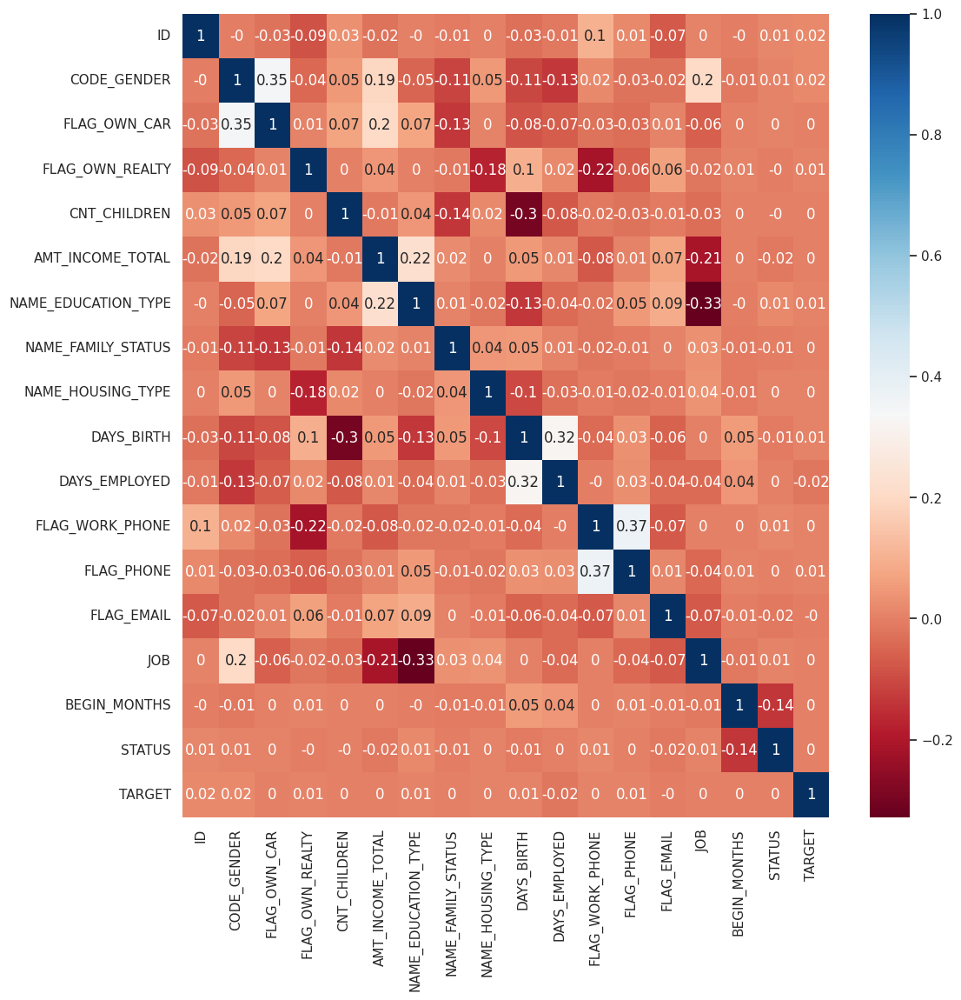

[]

In [182]:
high_correlated_cols(df, plot=True)

0.37 'FLAG_WORK_PHONE' - 'FLAG_PHONE'

0.35 'CODE_GENDER' - 'FLAG_OWN_CAR'

0.32 'DAYS_BIRTH' - 'DAYS_EMPLOYED' *

0.22 'NAME_EDUCATION_TYPE' - 'AMT_INCOME_TOTAL'

0.20 'CODE_GENDER' - 'JOB'

0.19 'AMT_INCOME_TOTAL' - 'CODE_GENDER'

0.10 'FLAG_WORK_PHONE' - 'ID' is not logical

0.09 'FLAG_EMAIL' - 'NAME_EDUCATION_TYPE' 

0.07 'FLAG_EMAIL' - 'AMT_INCOME_TOTAL'

0.06 'FLAG_EMAIL' - 'FLAG_OWN_REALTY'

0.05 'BEGIN_MONTHS' - 'DAYS_BIRTH' * 

0.04 'BEGIN_MONTHS' - 'DAYS_EMPLOYED'

0.03 'FLAG_PHONE' - 'DAYS_BIRTH', 'DAYS_EMPLOYED' *

0.02 'FLAG_WORK_PHONE' - 'CODE_GENDER'

0.01 'TARGET' - 'FLAG_OWN_REALTY'

# After Changing Into Real Values, Analysis of Numerical Variables

count    537667.000
mean    5079231.309
std       42002.000
min     5008806.000
5%      5011006.000
10%     5023480.000
20%     5036128.000
30%     5050504.000
40%     5062291.000
50%     5079091.000
60%     5092424.000
70%     5112802.000
80%     5117971.000
90%     5139916.000
95%     5146139.000
99%     5149858.000
max     5150487.000
Name: ID, dtype: float64


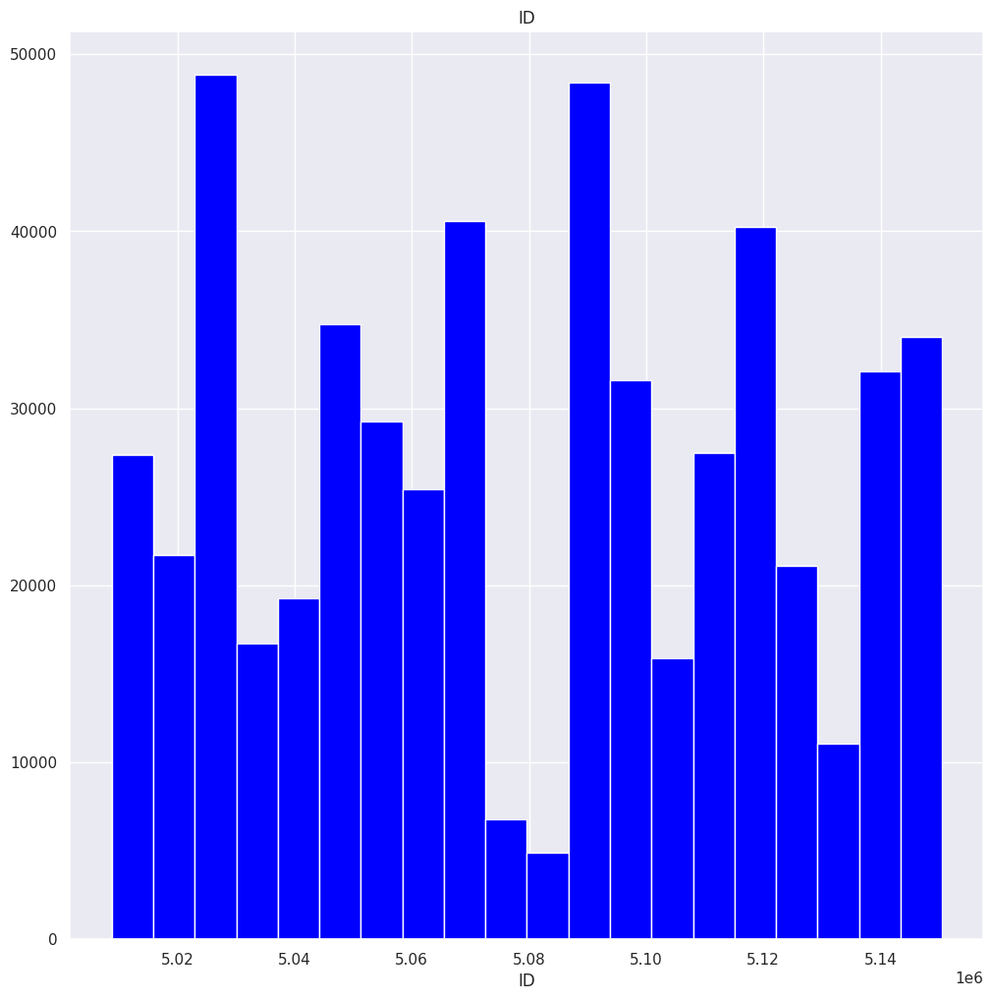

count    537667.000
mean     197117.127
std      104138.963
min       27000.000
5%        81000.000
10%       99000.000
20%      121500.000
30%      135000.000
40%      157500.000
50%      180000.000
60%      202500.000
70%      225000.000
80%      270000.000
90%      315000.000
95%      360000.000
99%      585000.000
max     1575000.000
Name: AMT_INCOME_TOTAL, dtype: float64


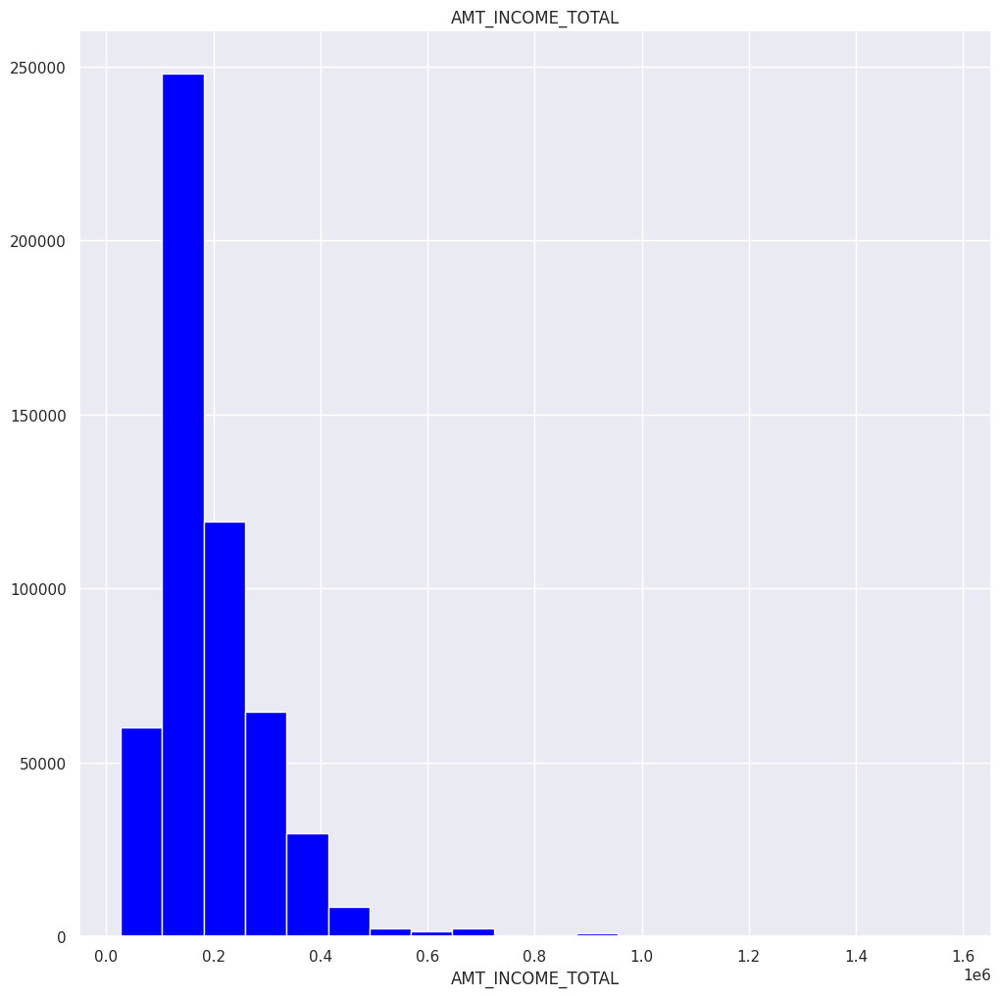

count   537667.000
mean        40.620
std          9.362
min         20.000
5%          27.000
10%         28.000
20%         32.000
30%         34.000
40%         37.000
50%         40.000
60%         43.000
70%         46.000
80%         50.000
90%         54.000
95%         57.000
99%         62.000
max         67.000
Name: DAYS_BIRTH, dtype: float64


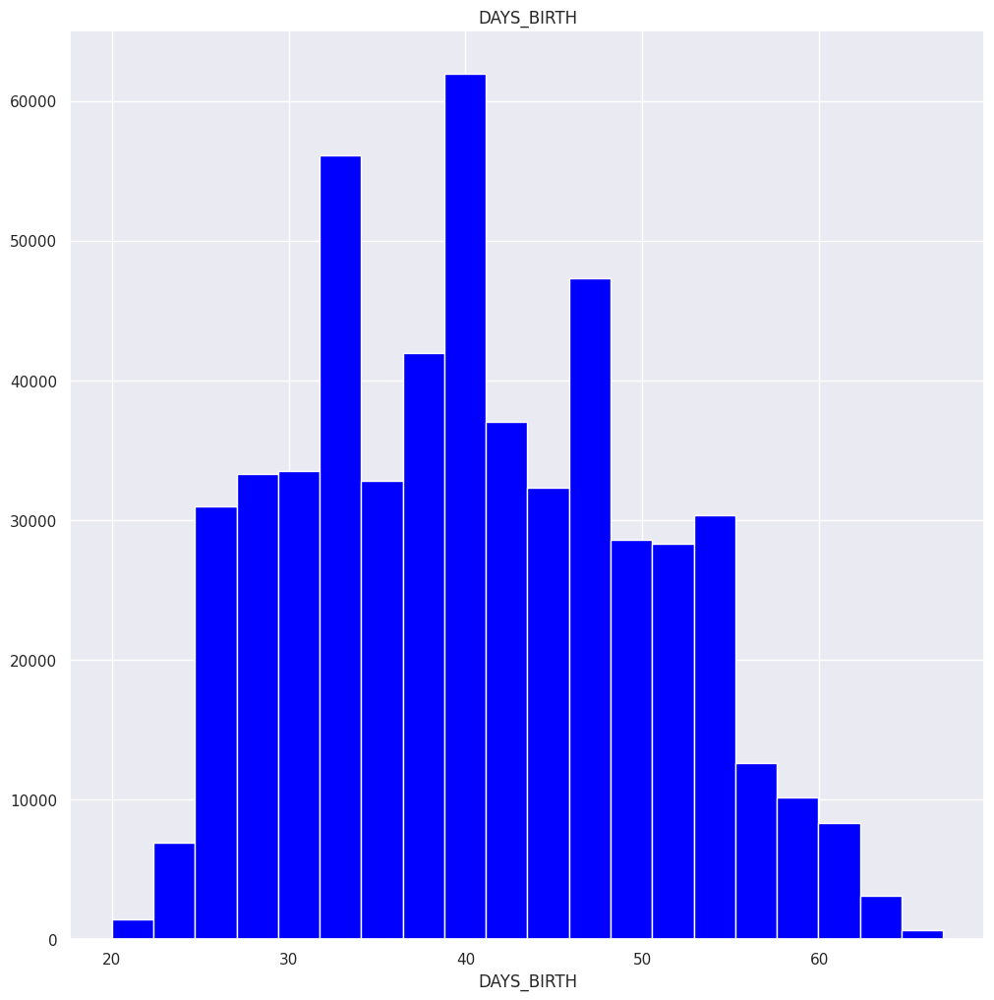

count   537667.000
mean         7.567
std          6.559
min          0.047
5%           0.682
10%          1.181
20%          2.299
30%          3.449
40%          4.551
50%          5.882
60%          7.307
70%          8.964
80%         11.356
90%         16.025
95%         21.195
99%         31.490
max         43.049
Name: DAYS_EMPLOYED, dtype: float64


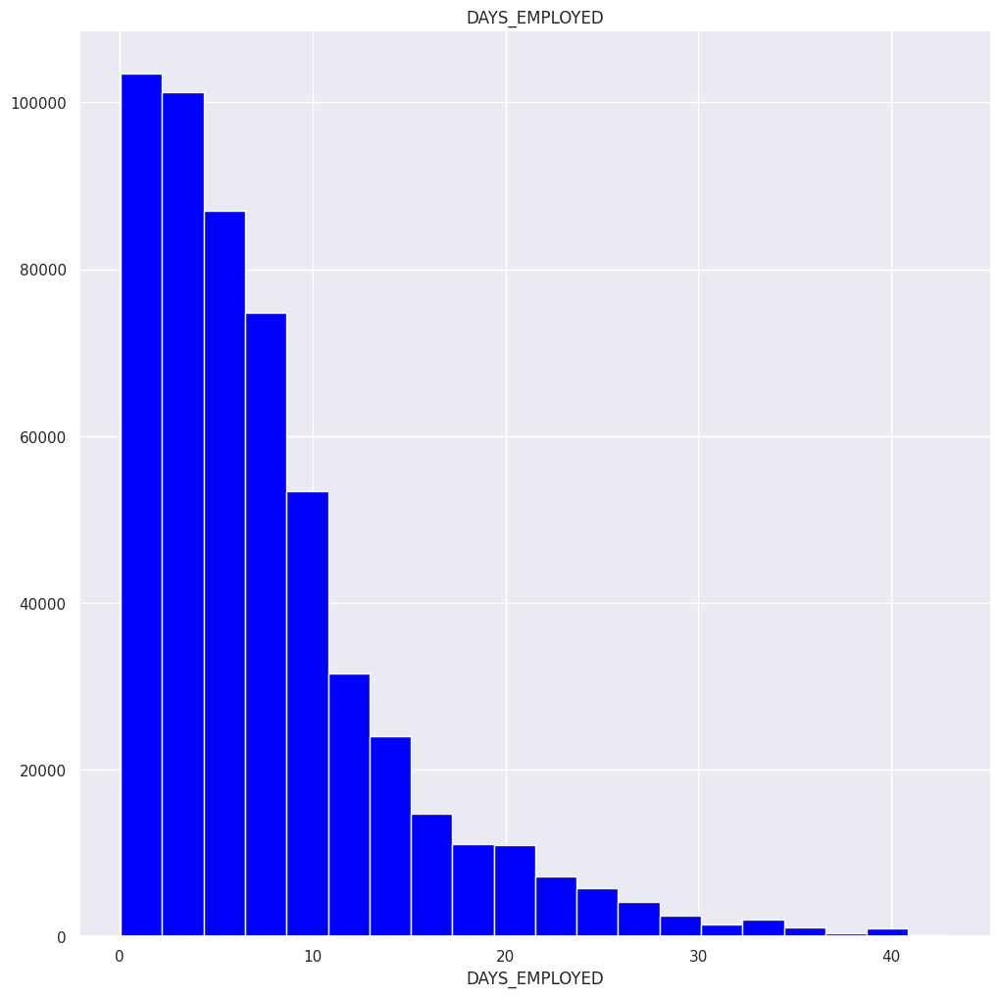

count   537667.000
mean        19.305
std         14.038
min          0.000
5%           1.000
10%          3.000
20%          6.000
30%          9.000
40%         13.000
50%         17.000
60%         21.000
70%         26.000
80%         32.000
90%         40.000
95%         46.000
99%         54.000
max         60.000
Name: BEGIN_MONTHS, dtype: float64


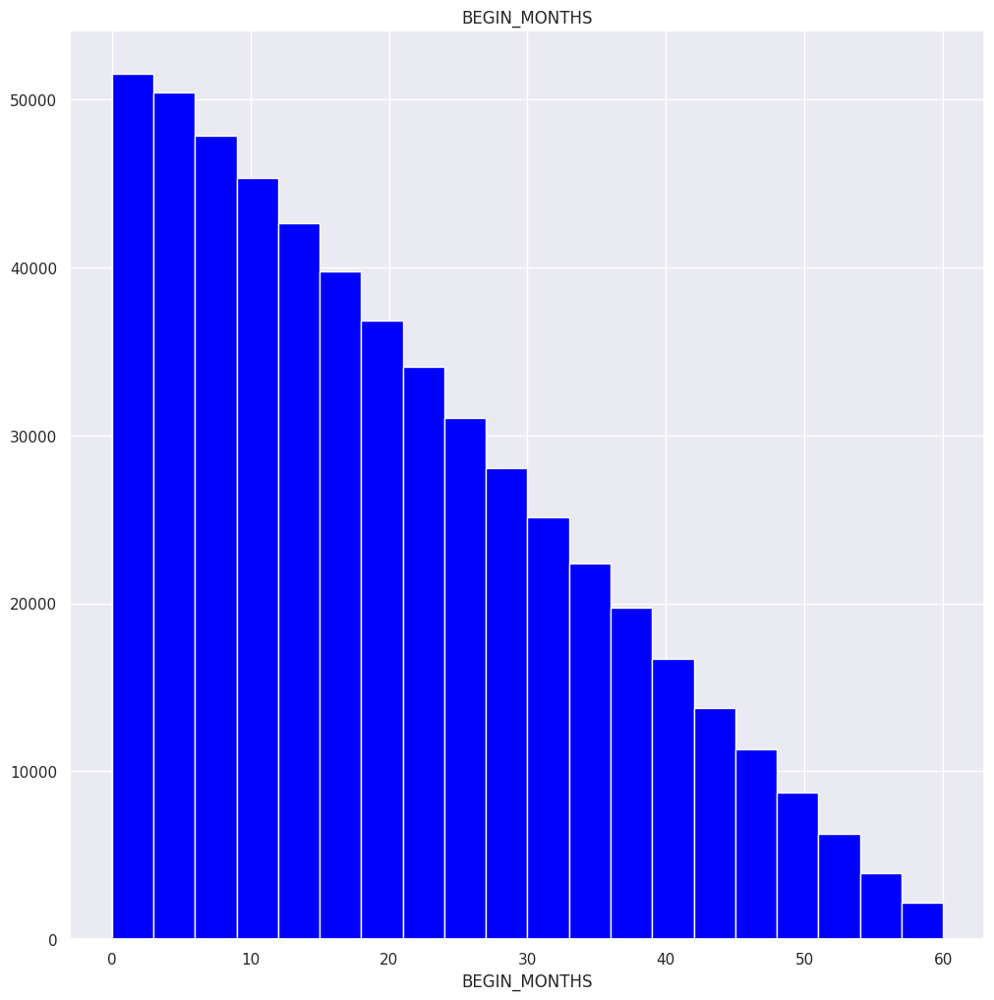

In [183]:
def num_summary(dataframe, numerical_col, plot=False, color='blue'):
    quantiles = [0.05, 0.10, 0.20, 0.30, 0.40, 0.50, 0.60, 0.70, 0.80, 0.90, 0.95, 0.99]
    print(dataframe[numerical_col].describe(quantiles).T)

    if plot:
        dataframe[numerical_col].hist(bins=20,color='blue')
        plt.xlabel(numerical_col)
        plt.title(numerical_col)
        plt.show(block=True)

for col in num_cols:
    num_summary(df, col, plot=True, color='blue')

# After Changing Into Real Values, Analysis of Numeric Variables by Target Variable

           ID_mean
TARGET            
0      5079188.816
1      5090833.554




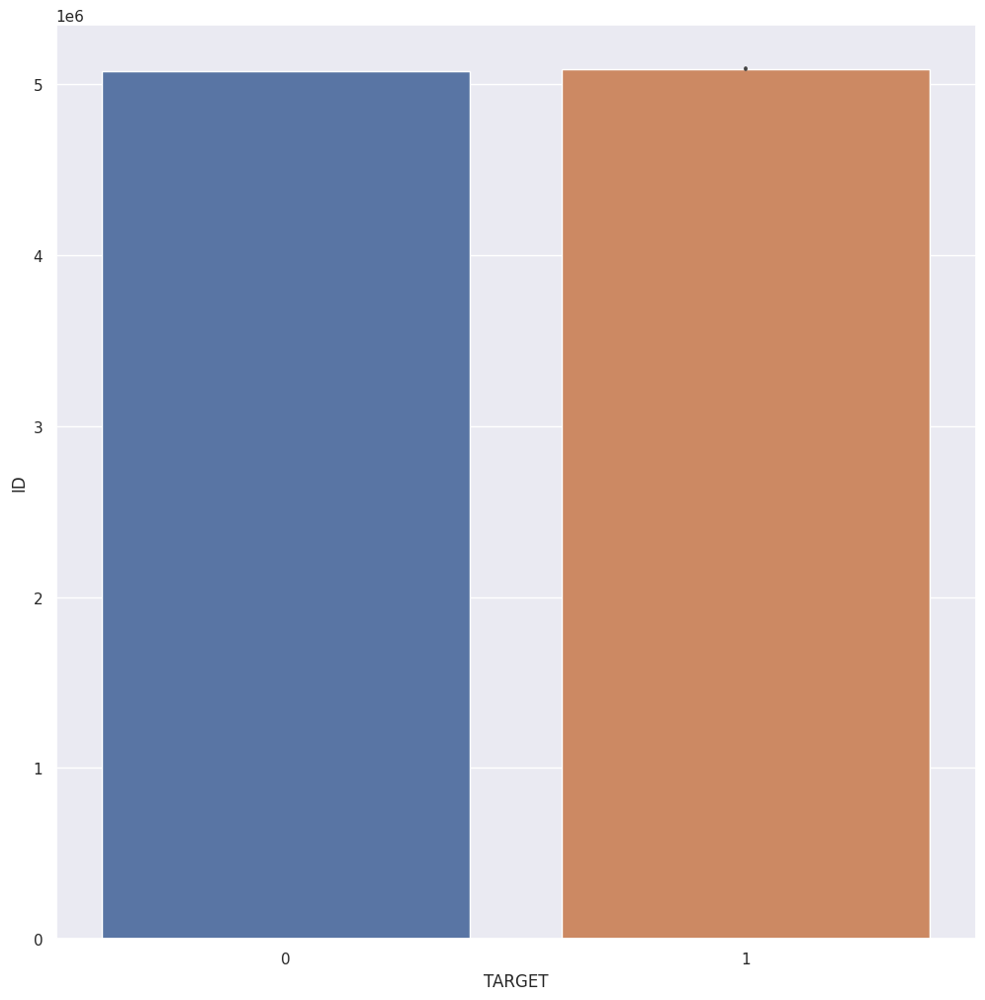

        AMT_INCOME_TOTAL_mean
TARGET                       
0                  197098.929
1                  202085.789




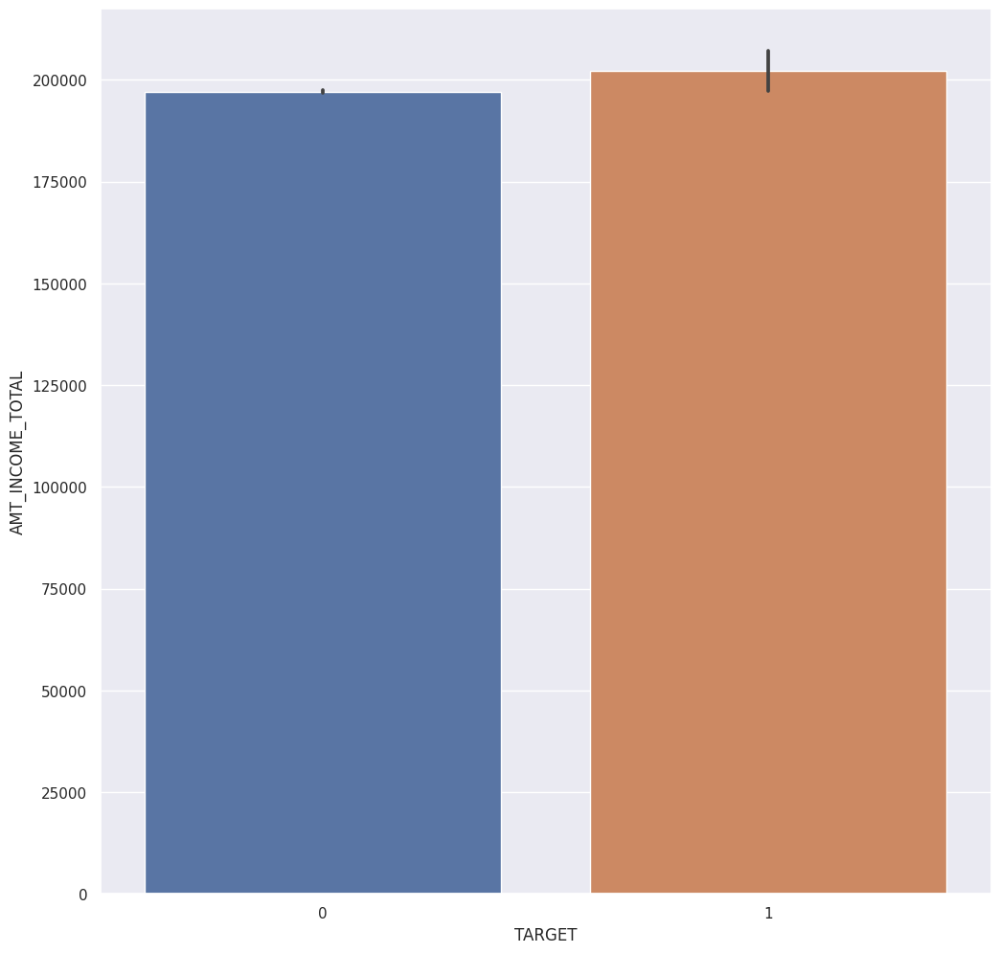

        DAYS_BIRTH_mean
TARGET                 
0                40.617
1                41.431




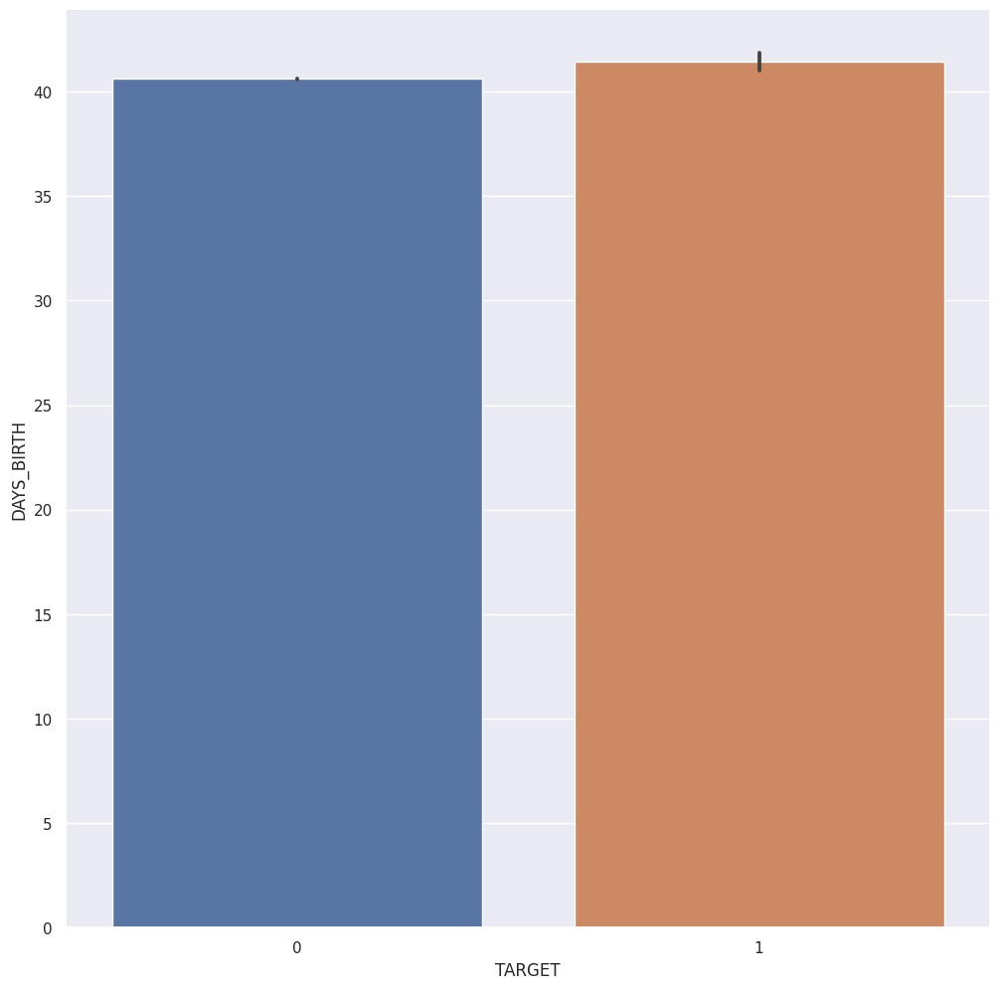

        DAYS_EMPLOYED_mean
TARGET                    
0                    7.575
1                    5.483




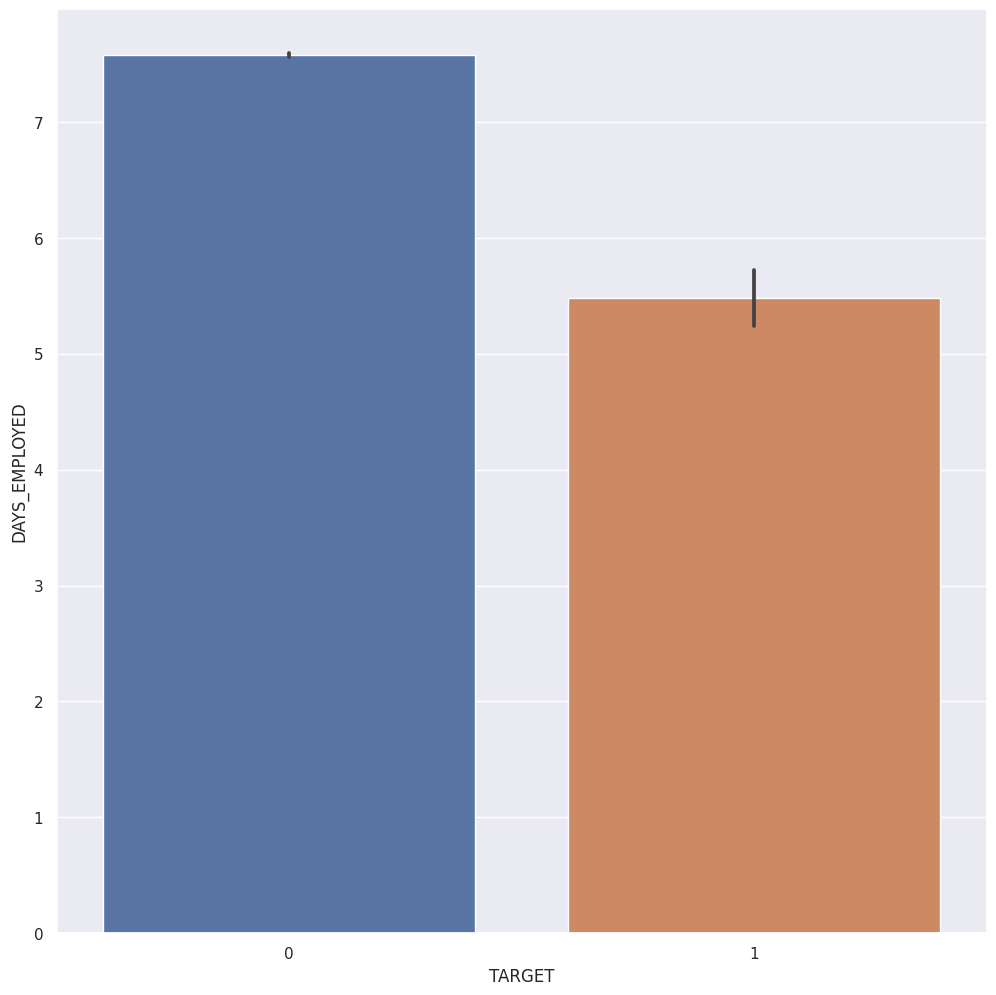

        BEGIN_MONTHS_mean
TARGET                   
0                  19.304
1                  19.687




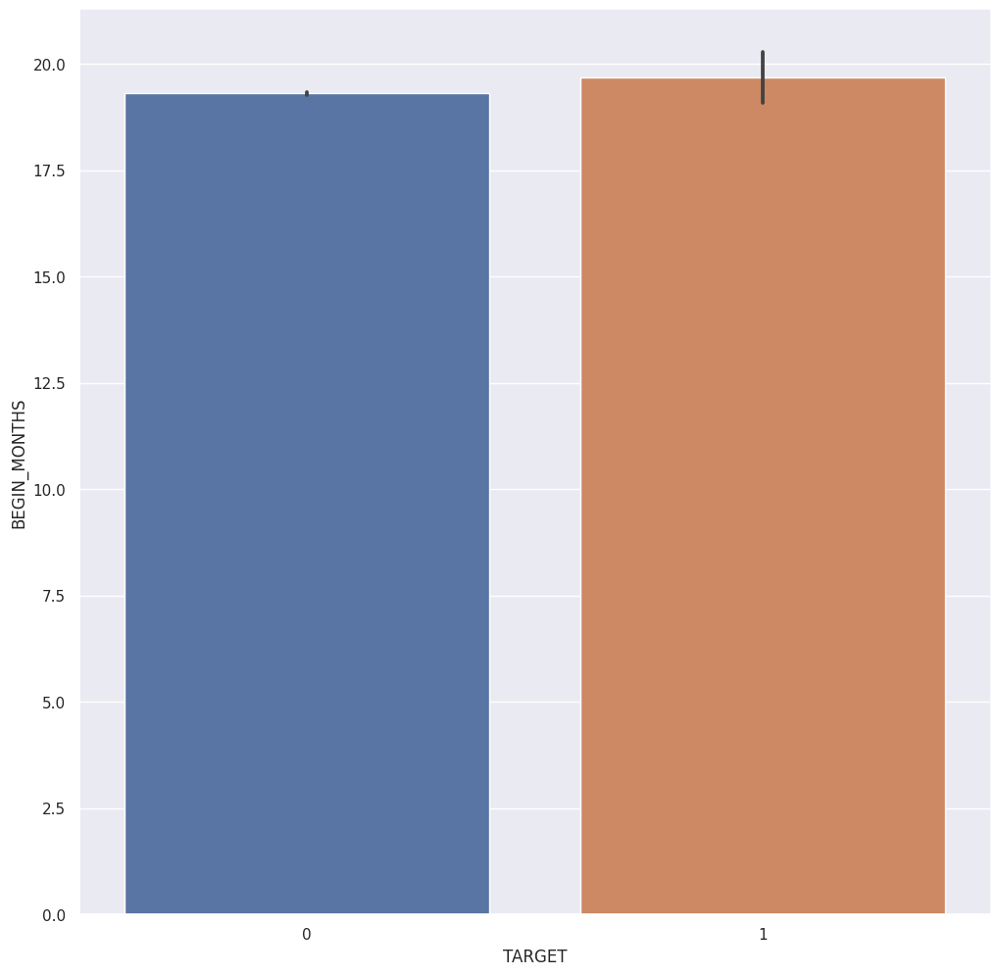

In [184]:
def target_summary_with_num(dataframe, target, numerical_col, plot=False):
    print(pd.DataFrame({numerical_col+'_mean': dataframe.groupby(target)[numerical_col].mean()}), end='\n\n\n')
    if plot:
        sns.barplot(x=target, y=numerical_col, data=dataframe)
        plt.show(block=True)

for col in num_cols:
    target_summary_with_num(df, "TARGET", col, plot=True)

* Numerical variables have a balanced at data and compared to target with these, model has a huge power on that selection.

In [185]:
num_but_cat

['FLAG_MOBIL', 'FLAG_WORK_PHONE', 'FLAG_PHONE', 'FLAG_EMAIL', 'TARGET']

In [186]:
cat_cols

['CODE_GENDER',
 'FLAG_OWN_CAR',
 'FLAG_OWN_REALTY',
 'CNT_CHILDREN',
 'NAME_EDUCATION_TYPE',
 'NAME_FAMILY_STATUS',
 'NAME_HOUSING_TYPE',
 'JOB',
 'STATUS',
 'FLAG_MOBIL',
 'FLAG_WORK_PHONE',
 'FLAG_PHONE',
 'FLAG_EMAIL',
 'TARGET']

In [187]:
num_cols

['ID', 'AMT_INCOME_TOTAL', 'DAYS_BIRTH', 'DAYS_EMPLOYED', 'BEGIN_MONTHS']

# Veri odaklı risk bazlı encoding
risk_order = df.groupby("CNT_CHILDREN")["TARGET"].mean().sort_values().index
children_map = {k: i for i, k in enumerate(risk_order)}
df["CNT_CHILDREN_ENCODED"] = df["CNT_CHILDREN"].map(children_map)
# Veri odaklı risk bazlı encoding
risk_order = df.groupby("CNT_CHILDREN")["TARGET"].mean().sort_values().index
children_map = {k: i for i, k in enumerate(risk_order)}
df["CNT_CHILDREN_ENCODED"] = df["CNT_CHILDREN"].map(children_map)


job_order = {
    'Low-skill Laborers': 1,
    'Cleaning staff': 2,
    'Cooking staff': 3,
    'Waiters/barmen staff': 4,
    'Drivers': 5,
    'Security staff': 6,
    'Private service staff': 7,
    'Core staff': 8,
    'Sales staff': 8,
    'Realty agents': 8,
    'Secretaries': 8,
    'Accountants': 9,
    'HR staff': 9,
    'IT staff': 9,
    'Medicine staff': 9,
    'High skill tech staff': 10,
    'Managers': 10
}

df['JOB'] = df['JOB'].map(job_order)

In [188]:
df.head()

,ID,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,DAYS_BIRTH,DAYS_EMPLOYED,FLAG_WORK_PHONE,FLAG_PHONE,FLAG_EMAIL,JOB,BEGIN_MONTHS,STATUS,TARGET
0,5065438,0,1,0,2,270000.000,2,0,2,36,6.301,0,0,0,0,6,6,0
1,5142753,0,0,0,0,81000.000,2,2,0,48,1.033,1,1,0,11,4,0,0
2,5111146,1,1,1,0,270000.000,4,0,0,53,2.816,0,1,0,16,0,6,0
3,5010310,0,1,1,1,112500.000,2,0,0,41,5.359,0,0,0,4,3,0,0
4,5010835,1,1,1,2,139500.000,2,0,0,47,15.282,1,0,0,9,29,0,0


In [189]:
df.tail()

,ID,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,DAYS_BIRTH,DAYS_EMPLOYED,FLAG_WORK_PHONE,FLAG_PHONE,FLAG_EMAIL,JOB,BEGIN_MONTHS,STATUS,TARGET
537662,5142999,1,1,0,1,166500.000,2,0,2,33,14.797,0,1,0,4,8,0,0
537663,5010773,0,0,1,0,135000.000,4,0,2,38,12.699,0,0,0,7,8,0,0
537664,5105601,1,0,1,0,180000.000,4,0,0,66,6.745,0,0,0,11,7,0,0
537665,5132833,1,1,0,0,220500.000,2,0,0,62,10.540,0,1,0,16,1,0,0
537666,5135381,0,0,1,0,387000.000,2,0,0,55,13.641,0,0,0,7,45,6,0


# Eksik (NaN) Değerleri Kontrol Et

In [191]:
# Eksik değerlerin sayısı ve oranını göster
def missing_values(df):
    missing_count = df.isnull().sum()
    missing_ratio = 100 * missing_count / len(df)
    missing_df = pd.DataFrame({
        'Missing Count': missing_count,
        'Missing Ratio (%)': missing_ratio
    })
    return missing_df[missing_df['Missing Count'] > 0].sort_values(by='Missing Ratio (%)', ascending=False)

missing_values(df)


,Missing Count,Missing Ratio (%)


# Outliers Investigating

In [192]:
# Aykırı değerleri IQR yöntemine göre bulan fonksiyon
def detect_outliers(df, num_cols):
    outlier_summary = {}
    for col in num_cols:
        Q1 = df[col].quantile(0.25)
        Q3 = df[col].quantile(0.75)
        IQR = Q3 - Q1
        lower = Q1 - 1.5 * IQR
        upper = Q3 + 1.5 * IQR
        outliers = df[(df[col] < lower) | (df[col] > upper)]
        outlier_summary[col] = {
            'Outlier Count': len(outliers),
            'Outlier Ratio (%)': round(len(outliers) * 100 / len(df), 2)
        }
    return pd.DataFrame(outlier_summary).T.sort_values(by='Outlier Count', ascending=False)

# Sayısal değişkenleri seç
numeric_cols = df.select_dtypes(include=['int64', 'float64']).columns.tolist()

# Aykırı değer kontrolü
detect_outliers(df, numeric_cols)


,Outlier Count,Outlier Ratio (%)
NAME_HOUSING_TYPE,63490.000,11.810
FLAG_EMAIL,54159.000,10.070
NAME_FAMILY_STATUS,43637.000,8.120
DAYS_EMPLOYED,28325.000,5.270
AMT_INCOME_TOTAL,26562.000,4.940
TARGET,1962.000,0.360
FLAG_WORK_PHONE,0.000,0.000
STATUS,0.000,0.000
BEGIN_MONTHS,0.000,0.000
JOB,0.000,0.000


# Outliers Visualisation 

##################### Quantiles #####################
                          0.000       0.050       0.500       0.950  \
ID                  5008806.000 5011006.000 5079091.000 5146139.000   
CODE_GENDER               0.000       0.000       0.000       1.000   
FLAG_OWN_CAR              0.000       0.000       0.000       1.000   
FLAG_OWN_REALTY           0.000       0.000       1.000       1.000   
CNT_CHILDREN              0.000       0.000       0.000       2.000   
AMT_INCOME_TOTAL      27000.000   81000.000  180000.000  360000.000   
NAME_EDUCATION_TYPE       1.000       2.000       2.000       4.000   
NAME_FAMILY_STATUS        0.000       0.000       0.000       4.000   
NAME_HOUSING_TYPE         0.000       0.000       0.000       3.000   
DAYS_BIRTH               20.000      27.000      40.000      57.000   
DAYS_EMPLOYED             0.047       0.682       5.882      21.195   
FLAG_WORK_PHONE           0.000       0.000       0.000       1.000   
FLAG_PHONE             

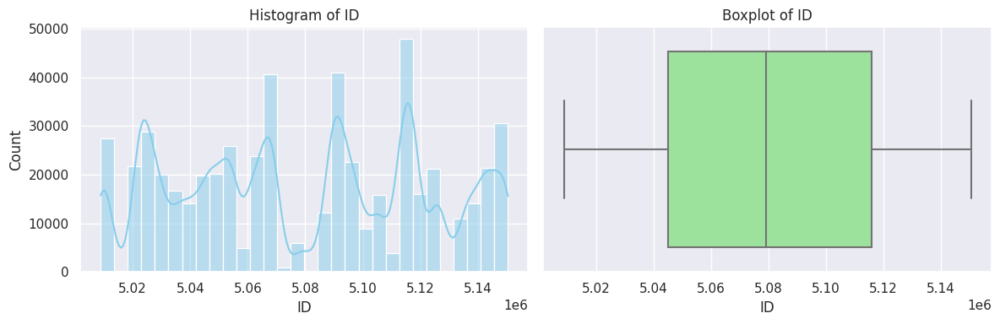

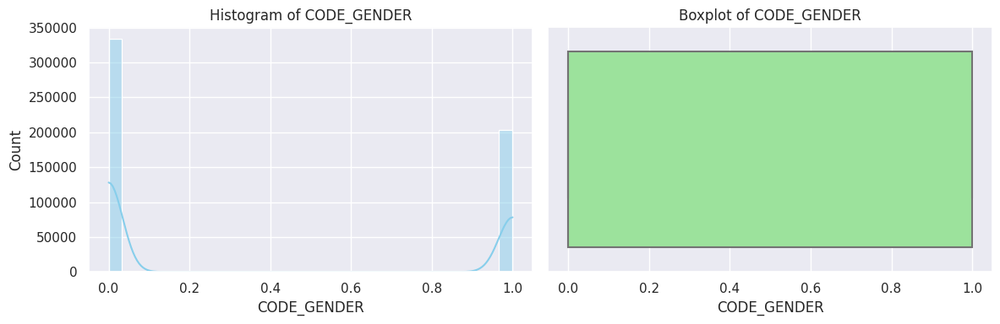

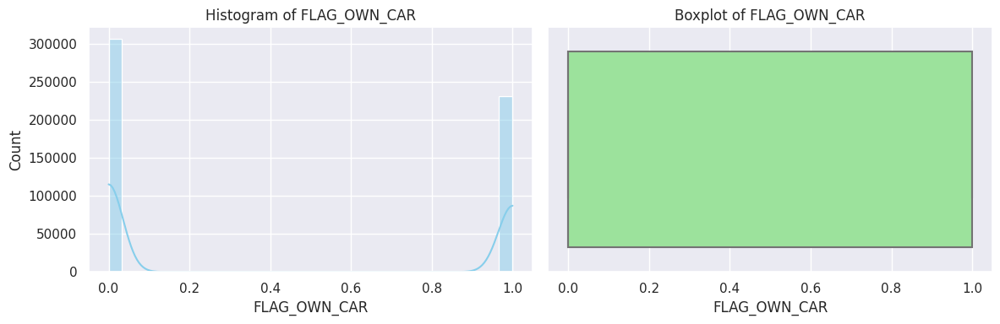

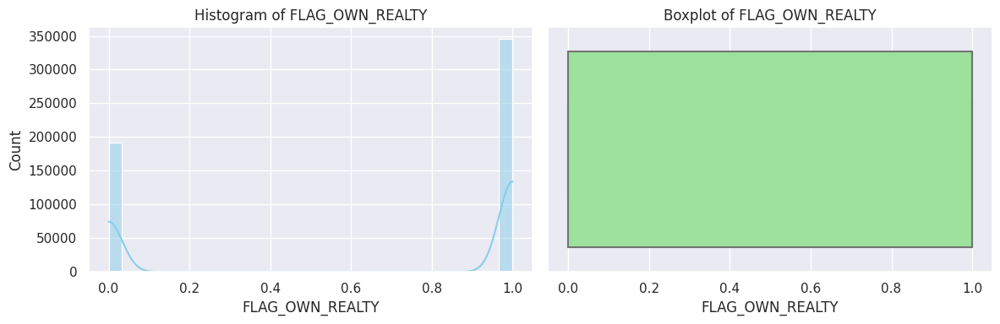

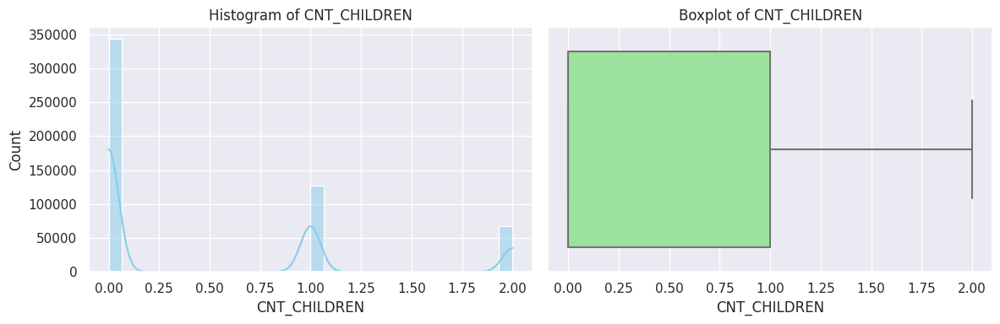

...

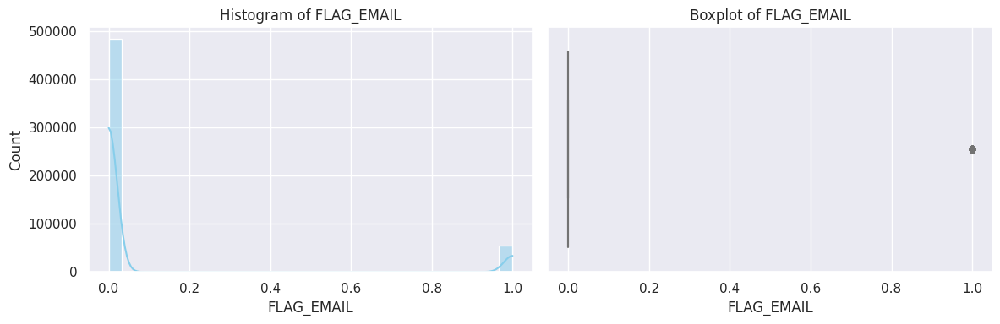

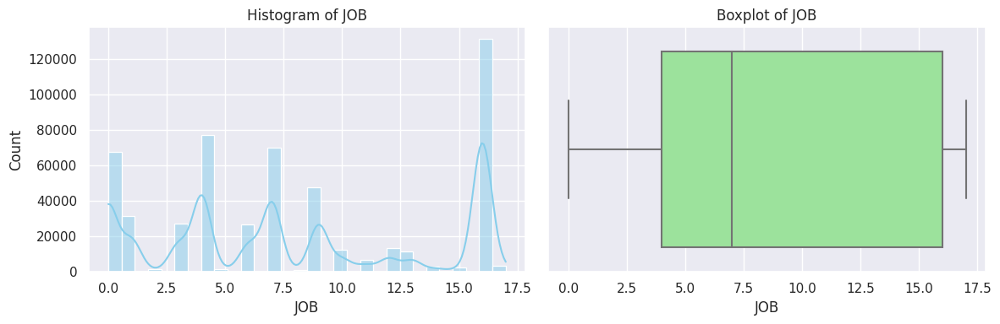

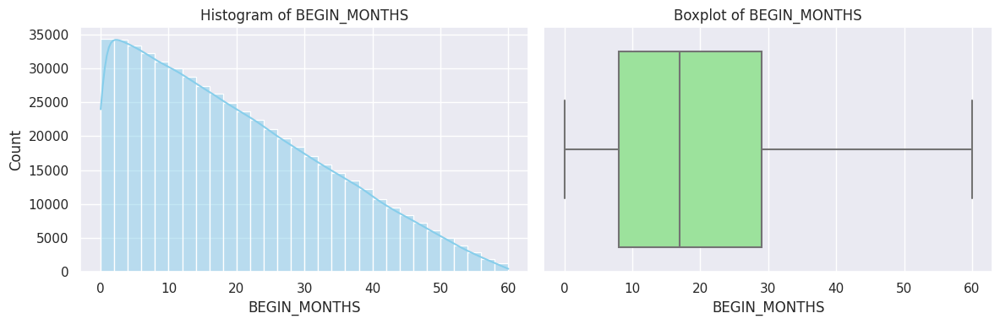

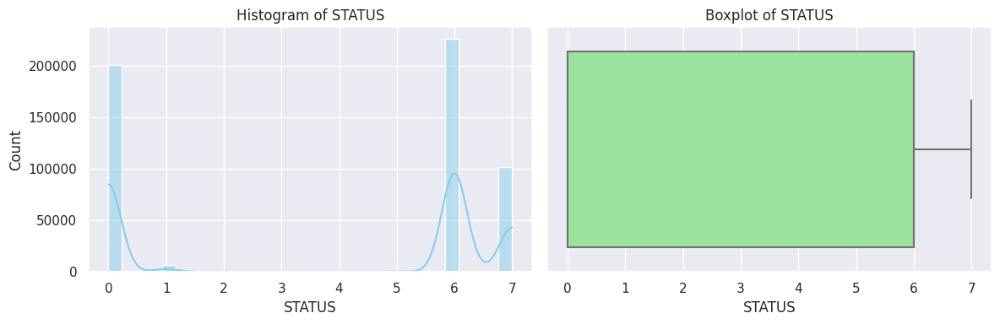

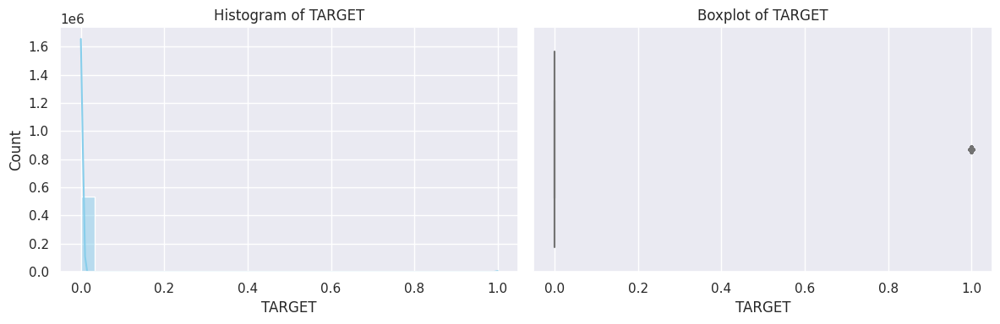

In [193]:
import matplotlib.pyplot as plt
import seaborn as sns

def check_df(dataframe, head=5):
    print("##################### Quantiles #####################")
    print(dataframe.quantile([0, 0.05, 0.50, 0.95, 0.99, 1]).T)
    
    num_cols = dataframe.select_dtypes(include=["number"]).columns
    
    for col in num_cols:
        fig, axes = plt.subplots(1, 2, figsize=(12, 4))
        
        sns.histplot(dataframe[col], bins=30, kde=True, ax=axes[0], color="skyblue")
        axes[0].set_title(f'Histogram of {col}')
        
        sns.boxplot(x=dataframe[col], ax=axes[1], color="lightgreen")
        axes[1].set_title(f'Boxplot of {col}')
        
        plt.tight_layout()
        plt.show()

# Kullanımı:
check_df(df)


# 'NAME_HOUSING_TYPE', 'FLAG_EMAIL', 'NAME_FAMILY_STATUS', 'DAYS_EMPLOYED', 'AMT_INCOME_TOTAL' Analysis For Outliers

##################### Quantiles #####################
                       0.000     0.050      0.500      0.950      0.990  \
NAME_HOUSING_TYPE      0.000     0.000      0.000      3.000      4.000   
FLAG_EMAIL             0.000     0.000      0.000      1.000      1.000   
NAME_FAMILY_STATUS     0.000     0.000      0.000      4.000      4.000   
DAYS_EMPLOYED          0.047     0.682      5.882     21.195     31.490   
AMT_INCOME_TOTAL   27000.000 81000.000 180000.000 360000.000 585000.000   

                         1.000  
NAME_HOUSING_TYPE        5.000  
FLAG_EMAIL               1.000  
NAME_FAMILY_STATUS       4.000  
DAYS_EMPLOYED           43.049  
AMT_INCOME_TOTAL   1575000.000  


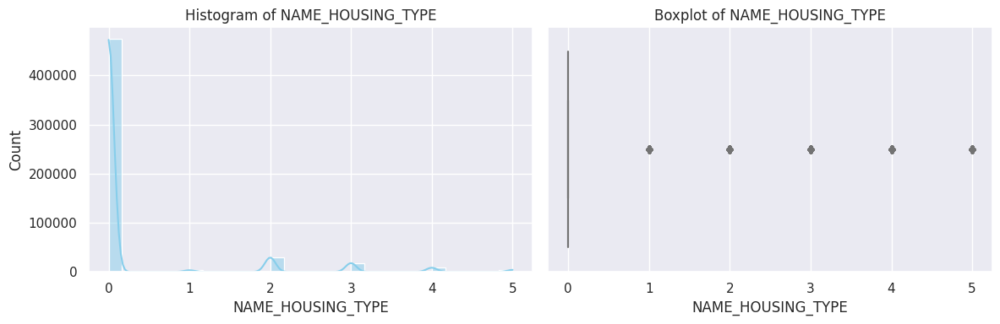

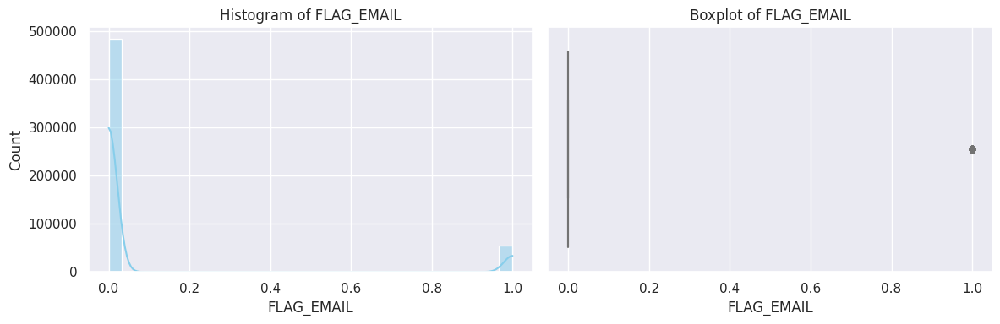

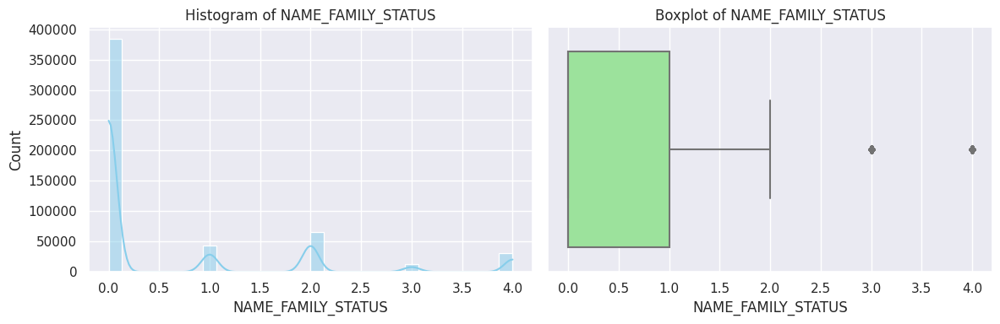

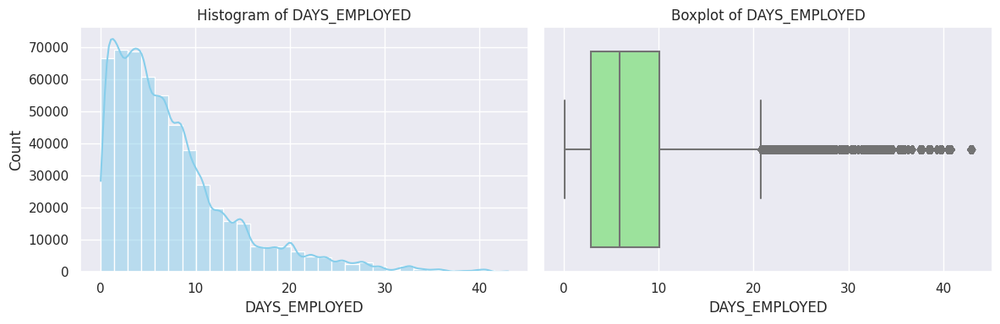

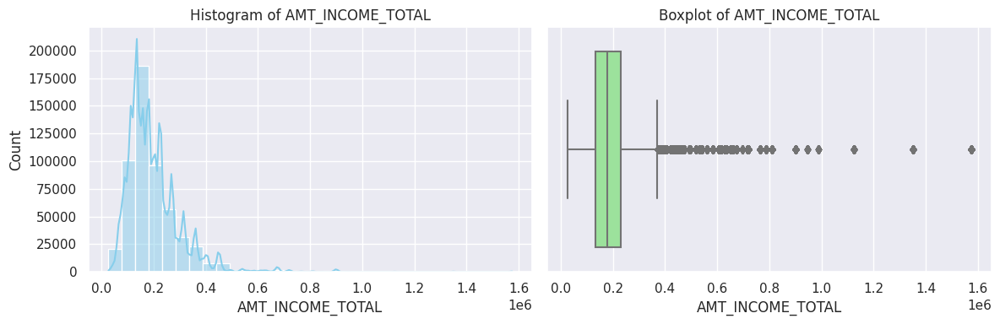

In [194]:
import matplotlib.pyplot as plt
import seaborn as sns

def check_selected_cols(dataframe, cols):
    print("##################### Quantiles #####################")
    print(dataframe[cols].quantile([0, 0.05, 0.50, 0.95, 0.99, 1]).T)
    
    for col in cols:
        if pd.api.types.is_numeric_dtype(dataframe[col]):
            fig, axes = plt.subplots(1, 2, figsize=(12, 4))
            
            sns.histplot(dataframe[col], bins=30, kde=True, ax=axes[0], color="skyblue")
            axes[0].set_title(f'Histogram of {col}')
            
            sns.boxplot(x=dataframe[col], ax=axes[1], color="lightgreen")
            axes[1].set_title(f'Boxplot of {col}')
            
            plt.tight_layout()
            plt.show()
        else:
            print(f"'{col}' sayısal değil, grafik çizilmiyor.")

# Kullanımı:
selected_columns = ['NAME_HOUSING_TYPE', 'FLAG_EMAIL', 'NAME_FAMILY_STATUS', 'DAYS_EMPLOYED', 'AMT_INCOME_TOTAL']
check_selected_cols(df, selected_columns)


In [195]:
import pandas as pd

def fill_outliers_and_missing(df):
    # Sayısal değişkenler için IQR yöntemi ile aykırı değerleri ortalama ile doldurma
    numeric_cols = ['DAYS_EMPLOYED', 'AMT_INCOME_TOTAL']
    for col in numeric_cols:
        Q1 = df[col].quantile(0.25)
        Q3 = df[col].quantile(0.75)
        IQR = Q3 - Q1
        lower_bound = Q1 - 1.5 * IQR
        upper_bound = Q3 + 1.5 * IQR
        
        # Ortalama hesapla (aykırı değerler hariç)
        mean_val = df.loc[(df[col] >= lower_bound) & (df[col] <= upper_bound), col].mean()
        
        # Aykırı değerleri ortalama ile değiştir
        df.loc[(df[col] < lower_bound) | (df[col] > upper_bound), col] = mean_val
    
    # Kategorik değişkenler için mod ile doldurma
    cat_cols = ['NAME_HOUSING_TYPE', 'FLAG_EMAIL', 'NAME_FAMILY_STATUS']
    for col in cat_cols:
        mode_val = df[col].mode()[0]
        df[col].fillna(mode_val, inplace=True)
        
    return df

# Kullanımı:
df = fill_outliers_and_missing(df)


🎯 Özetle:

* Sayısal	DAYS_EMPLOYED, AMT_INCOME_TOTAL	Aykırı değerleri ortalama ile değiştirir.

* Kategorik	NAME_HOUSING_TYPE, FLAG_EMAIL, NAME_FAMILY_STATUS	Eksik değerleri mod ile doldurur.

# Outlier Control And Check

In [196]:
def check_selected_cols(dataframe, cols):
    print("##################### Quantiles #####################")
    print(dataframe[cols].quantile([0, 0.05, 0.50, 0.95, 0.99, 1]).T)

selected_columns = ['NAME_HOUSING_TYPE', 'FLAG_EMAIL', 'NAME_FAMILY_STATUS', 'DAYS_EMPLOYED', 'AMT_INCOME_TOTAL']
check_selected_cols(df, selected_columns)

##################### Quantiles #####################
                       0.000     0.050      0.500      0.950      0.990  \
NAME_HOUSING_TYPE      0.000     0.000      0.000      3.000      4.000   
FLAG_EMAIL             0.000     0.000      0.000      1.000      1.000   
NAME_FAMILY_STATUS     0.000     0.000      0.000      4.000      4.000   
DAYS_EMPLOYED          0.047     0.682      5.882     15.858     19.934   
AMT_INCOME_TOTAL   27000.000 81000.000 180000.000 315000.000 360000.000   

                        1.000  
NAME_HOUSING_TYPE       5.000  
FLAG_EMAIL              1.000  
NAME_FAMILY_STATUS      4.000  
DAYS_EMPLOYED          20.729  
AMT_INCOME_TOTAL   369000.000  


In [ ]:
Sayısal verilerin aykırı değerleri ortalam ile dolduruldu.
Kategorik verilerin eksik değerleri mod ile dolduruldu ve aykırı değer araştırmak anlamsızdır. 

# Negative Value Control

In [197]:
def check_negative_values(df):
    num_cols = df.select_dtypes(include=['number']).columns
    for col in num_cols:
        neg_count = (df[col] < 0).sum()
        if neg_count > 0:
            print(f"'{col}' sütununda {neg_count} adet negatif değer var.")
        else:
            print(f"'{col}' sütununda negatif değer yok.")

check_negative_values(df)


'ID' sütununda negatif değer yok.
'CODE_GENDER' sütununda negatif değer yok.
'FLAG_OWN_CAR' sütununda negatif değer yok.
'FLAG_OWN_REALTY' sütununda negatif değer yok.
'CNT_CHILDREN' sütununda negatif değer yok.
'AMT_INCOME_TOTAL' sütununda negatif değer yok.
'NAME_EDUCATION_TYPE' sütununda negatif değer yok.
'NAME_FAMILY_STATUS' sütununda negatif değer yok.
'NAME_HOUSING_TYPE' sütununda negatif değer yok.
'DAYS_BIRTH' sütununda negatif değer yok.
'DAYS_EMPLOYED' sütununda negatif değer yok.
'FLAG_WORK_PHONE' sütununda negatif değer yok.
'FLAG_PHONE' sütununda negatif değer yok.
'FLAG_EMAIL' sütununda negatif değer yok.
'JOB' sütununda negatif değer yok.
'BEGIN_MONTHS' sütununda negatif değer yok.
'STATUS' sütununda negatif değer yok.
'TARGET' sütununda negatif değer yok.


# Feature Engineering With Making New Variables

In [199]:
# Yaş ve çalışma süresi için pozitif değerler
df['AGE'] = abs(df['DAYS_BIRTH']) / 365
df['EMPLOYED_YEARS'] = abs(df['DAYS_EMPLOYED']) / 365

# Çalışma süresinin yaşa oranı
df['EMPLOYED_RATIO'] = df['DAYS_EMPLOYED'] / df['AGE']

# Telefon kullanım sayısı
df['PHONE_COUNT'] = df['FLAG_PHONE'] + df['FLAG_WORK_PHONE']

# Cinsiyet ve araç sahipliği etkileşimi (string olarak birleştirip kategorik feature)
#df['GENDER_OWN_CAR'] = df['CODE_GENDER'].astype(str) + "_" + df['FLAG_OWN_CAR'].astype(str)

# Eğitim seviyesine göre gelir ortalaması (gruplandırılmış gelir)
df['EDU_INCOME_MEAN'] = df.groupby('NAME_EDUCATION_TYPE')['AMT_INCOME_TOTAL'].transform('mean')

# Cinsiyet ve iş tipi etkileşimi
#df['GENDER_JOB'] = df['CODE_GENDER'].astype(str) + "_" + df['JOB'].astype(str)

# Cinsiyet bazında ortalama gelir
df['GENDER_INCOME_MEAN'] = df.groupby('CODE_GENDER')['AMT_INCOME_TOTAL'].transform('mean')

df.head()

,ID,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,DAYS_BIRTH,DAYS_EMPLOYED,FLAG_WORK_PHONE,FLAG_PHONE,FLAG_EMAIL,JOB,BEGIN_MONTHS,STATUS,TARGET,AGE,EMPLOYED_YEARS,EMPLOYED_RATIO,PHONE_COUNT,EDU_INCOME_MEAN,GENDER_INCOME_MEAN
0,5065438,0,1,0,2,270000.000,2,0,2,36,6.301,0,0,0,0,6,6,0,0.099,0.017,63.889,0,172965.771,170088.406
1,5142753,0,0,0,0,81000.000,2,2,0,48,1.033,1,1,0,11,4,0,0,0.132,0.003,7.854,2,172965.771,170088.406
2,5111146,1,1,1,0,270000.000,4,0,0,53,2.816,0,1,0,16,0,6,0,0.145,0.008,19.396,1,199999.327,200296.510
3,5010310,0,1,1,1,112500.000,2,0,0,41,5.359,0,0,0,4,3,0,0,0.112,0.015,47.707,0,172965.771,170088.406
4,5010835,1,1,1,2,139500.000,2,0,0,47,15.282,1,0,0,9,29,0,0,0.129,0.042,118.681,1,172965.771,200296.510


In [ ]:
#df.drop(columns=['GENDER_OWN_CAR', 'GENDER_JOB'], inplace=True)

# Standardization Process With Numerical Variables

In [200]:
num_cols

['ID', 'AMT_INCOME_TOTAL', 'DAYS_BIRTH', 'DAYS_EMPLOYED', 'BEGIN_MONTHS']

"ID" variable is not important for this process because this does not have a meaningful for data and that has only identification for people who is someone. 

In [201]:
from sklearn.preprocessing import RobustScaler

# ID hariç sayısal sütunlar
a = ['AMT_INCOME_TOTAL', 'DAYS_BIRTH', 'DAYS_EMPLOYED', 'BEGIN_MONTHS']

scaler = RobustScaler()
df[a] = scaler.fit_transform(df[a])

df.head(10)


,ID,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,DAYS_BIRTH,DAYS_EMPLOYED,FLAG_WORK_PHONE,FLAG_PHONE,FLAG_EMAIL,JOB,BEGIN_MONTHS,STATUS,TARGET,AGE,EMPLOYED_YEARS,EMPLOYED_RATIO,PHONE_COUNT,EDU_INCOME_MEAN,GENDER_INCOME_MEAN
0,5065438,0,1,0,2,1.000,2,0,2,-0.267,0.069,0,0,0,0,-0.524,6,0,0.099,0.017,63.889,0,172965.771,170088.406
1,5142753,0,0,0,0,-1.100,2,2,0,0.533,-0.802,1,1,0,11,-0.619,0,0,0.132,0.003,7.854,2,172965.771,170088.406
2,5111146,1,1,1,0,1.000,4,0,0,0.867,-0.507,0,1,0,16,-0.810,6,0,0.145,0.008,19.396,1,199999.327,200296.510
3,5010310,0,1,1,1,-0.750,2,0,0,0.067,-0.087,0,0,0,4,-0.667,0,0,0.112,0.015,47.707,0,172965.771,170088.406
4,5010835,1,1,1,2,-0.450,2,0,0,0.467,1.554,1,0,0,9,0.571,0,0,0.129,0.042,118.681,1,172965.771,200296.510
5,5067057,0,1,1,0,-0.400,2,0,0,0.133,0.368,0,1,0,4,0.381,0,0,0.115,0.022,70.452,1,172965.771,170088.406
6,5095635,1,1,0,1,0.000,4,0,0,-0.667,-0.873,0,0,0,9,0.095,7,0,0.082,0.002,7.300,0,199999.327,200296.510
7,5096402,1,1,0,0,0.017,4,0,0,0.733,0.477,1,1,0,1,0.048,7,0,0.140,0.024,62.745,2,199999.327,200296.510
8,5061372,0,0,1,1,-0.500,2,2,0,0.400,0.103,0,0,0,16,1.238,0,0,0.126,0.018,51.612,0,172965.771,170088.406
9,5026464,0,0,1,1,1.000,2,0,0,0.333,0.260,1,1,0,8,1.000,0,0,0.123,0.020,60.489,2,172965.771,170088.406


In [202]:
df.shape

(537667, 24)

# Model Building/Base Model Step

In [203]:
# Creating the Dependent Variable.

y = df["TARGET"]

# Creating Independent Variables.

X = df.drop("TARGET", axis=1)

# Splitting the Data into Training and Test Sets

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.35, random_state=17)

* Train Size = %65

* Test Size = %35

In [204]:
X_train

,ID,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,DAYS_BIRTH,DAYS_EMPLOYED,FLAG_WORK_PHONE,FLAG_PHONE,FLAG_EMAIL,JOB,BEGIN_MONTHS,STATUS,AGE,EMPLOYED_YEARS,EMPLOYED_RATIO,PHONE_COUNT,EDU_INCOME_MEAN,GENDER_INCOME_MEAN
266758,5052621,1,1,1,1,0.000,2,0,0,0.200,-0.069,0,1,0,1,-0.667,6,0.118,0.015,46.372,1,172965.771,200296.510
153990,5118243,1,0,0,0,-0.250,2,0,0,-0.200,0.339,0,0,0,10,0.524,6,0.101,0.022,78.270,0,172965.771,200296.510
305448,5132922,1,0,1,0,-0.250,2,0,0,-0.667,-0.236,0,0,0,16,-0.762,0,0.082,0.012,54.200,0,172965.771,200296.510
143078,5029467,0,1,1,1,-0.750,4,1,0,-0.800,0.386,0,0,1,4,0.333,0,0.077,0.023,107.143,0,199999.327,170088.406
214048,5045983,0,0,1,0,0.500,2,0,0,1.133,-0.206,0,0,0,7,0.000,0,0.156,0.013,29.684,0,172965.771,170088.406
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
287775,5113367,1,0,1,0,-0.350,4,2,0,-1.000,-0.044,0,1,1,6,1.000,0,0.068,0.015,81.960,1,199999.327,200296.510
516374,5023926,1,1,1,1,0.500,2,0,0,0.467,-0.765,0,0,0,9,-0.333,6,0.129,0.003,9.745,0,172965.771,200296.510
125680,5088821,0,0,1,0,-1.500,2,0,0,1.000,1.882,0,0,0,6,1.000,0,0.151,0.047,114.600,0,172965.771,170088.406
491926,5142200,0,0,1,0,2.000,4,1,0,0.533,0.639,0,0,0,7,-0.524,0,0.132,0.027,74.125,0,199999.327,170088.406


In [205]:
X_test

,ID,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,DAYS_BIRTH,DAYS_EMPLOYED,FLAG_WORK_PHONE,FLAG_PHONE,FLAG_EMAIL,JOB,BEGIN_MONTHS,STATUS,AGE,EMPLOYED_YEARS,EMPLOYED_RATIO,PHONE_COUNT,EDU_INCOME_MEAN,GENDER_INCOME_MEAN
523491,5117612,0,0,0,0,-0.250,4,0,0,-0.133,0.050,0,0,0,4,-0.143,7,0.104,0.017,59.395,0,199999.327,170088.406
536001,5037253,0,0,1,0,-0.250,2,0,0,0.333,-0.870,0,0,0,6,-0.286,6,0.123,0.002,5.022,0,172965.771,170088.406
347284,5125802,0,0,1,0,-0.250,2,0,0,0.400,-0.553,1,1,0,4,1.571,0,0.126,0.007,20.109,2,172965.771,170088.406
111266,5051150,0,0,0,0,0.600,4,2,0,-0.733,-0.098,0,0,0,0,-0.095,6,0.079,0.014,66.586,0,199999.327,170088.406
304874,5011003,0,1,1,0,-0.250,2,0,0,-0.733,-0.031,0,0,1,7,-0.190,0,0.079,0.016,71.655,0,172965.771,170088.406
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14372,5061825,0,0,1,0,-0.750,3,2,4,-1.200,-0.249,0,0,0,16,-0.476,1,0.060,0.012,72.636,0,193532.217,170088.406
304568,5021283,0,0,1,1,-0.250,2,0,0,0.133,-0.653,0,0,0,12,0.143,6,0.115,0.005,16.786,0,172965.771,170088.406
239795,5022907,1,0,0,0,0.100,2,0,0,0.200,0.282,0,0,0,4,-0.143,6,0.118,0.021,64.419,0,172965.771,200296.510
39358,5036947,0,1,1,0,1.000,2,0,0,0.667,1.498,0,0,0,0,0.952,6,0.137,0.041,109.080,0,172965.771,170088.406


In [206]:
y_train

266758    0
153990    0
305448    0
143078    0
214048    0
         ..
287775    0
516374    0
125680    0
491926    0
297103    0
Name: TARGET, Length: 349483, dtype: int64

In [207]:
y_test

523491    0
536001    0
347284    0
111266    0
304874    0
         ..
14372     0
304568    0
239795    0
39358     0
299478    0
Name: TARGET, Length: 188184, dtype: int64

# RandomForestClassifier

RandomForestClassifier Results:
Training Time: 33.2935 seconds
Prediction Time: 1.7323 seconds
Accuracy: 1.0
Recall: 0.9928
Precision: 1.0
F1 Score: 0.9964
AUC Score: 0.9964


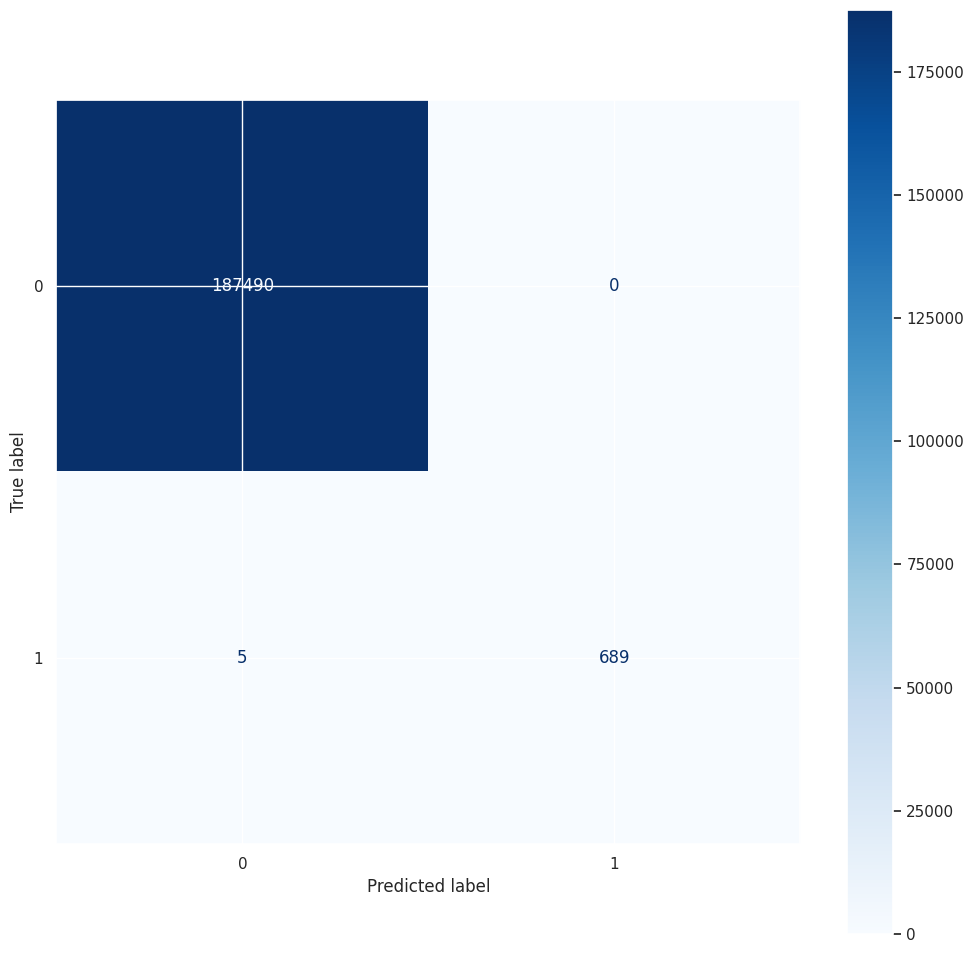

In [208]:
import time
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, recall_score, precision_score, f1_score, roc_auc_score, confusion_matrix, ConfusionMatrixDisplay

# Model Training with timing
start_train = time.time()
rf_model = RandomForestClassifier(random_state=46).fit(X_train, y_train)
end_train = time.time()
training_time = end_train - start_train

# Prediction with timing
start_pred = time.time()
y_pred = rf_model.predict(X_test)
end_pred = time.time()
prediction_time = end_pred - start_pred

# Evaluation metrics
print("RandomForestClassifier Results:")
print(f"Training Time: {round(training_time, 4)} seconds")
print(f"Prediction Time: {round(prediction_time, 4)} seconds")
print(f"Accuracy: {round(accuracy_score(y_test, y_pred), 4)}")
print(f"Recall: {round(recall_score(y_test, y_pred), 4)}")
print(f"Precision: {round(precision_score(y_test, y_pred), 4)}")
print(f"F1 Score: {round(f1_score(y_test, y_pred), 4)}")
print(f"AUC Score: {round(roc_auc_score(y_test, y_pred), 4)}")

# Confusion Matrix
cm = confusion_matrix(y_test, y_pred)
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
disp.plot(cmap="Blues")


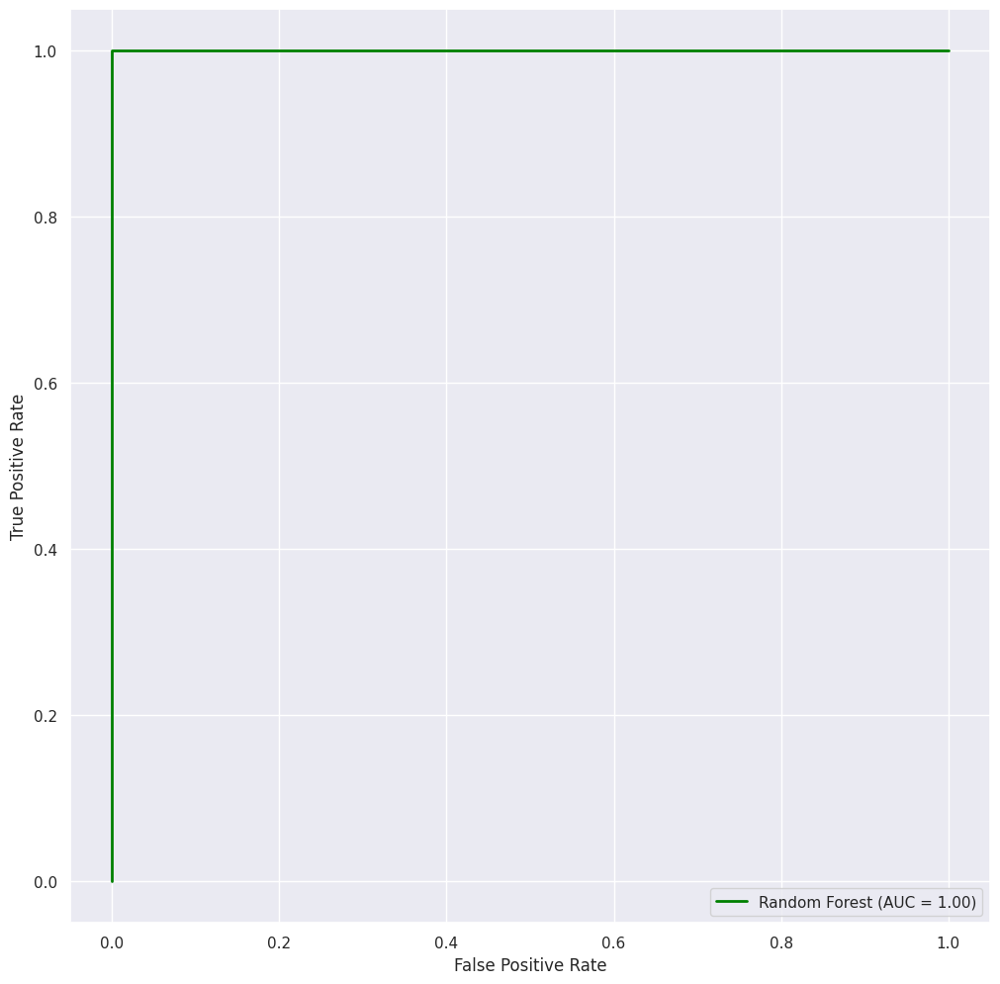

In [211]:
from sklearn.metrics import roc_curve, RocCurveDisplay, roc_auc_score

# Tahmin olasılıkları (pozitif sınıf = 1)
rf_probs = rf_model.predict_proba(X_test)[:, 1]

# ROC eğrisi için değerler
fpr_rf, tpr_rf, _ = roc_curve(y_test, rf_probs)

# ROC Curve çizimi
roc_display_rf = RocCurveDisplay(fpr=fpr_rf, tpr=tpr_rf,
                                 roc_auc=roc_auc_score(y_test, rf_probs),
                                 estimator_name='Random Forest')
roc_display_rf.plot(linewidth=2, color='green')

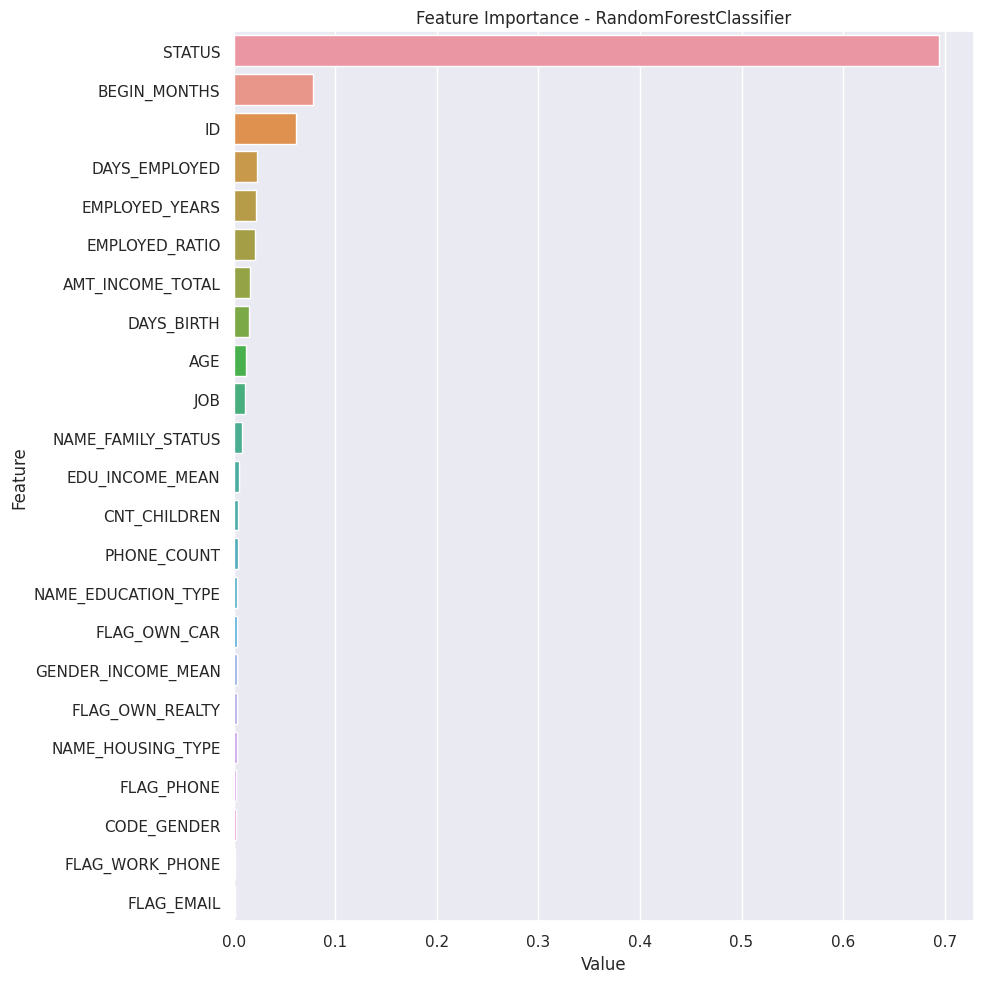

In [212]:
def plot_importance(model, features, num=len(X), save=False):
    feature_imp = pd.DataFrame({'Value': model.feature_importances_, 'Feature': features.columns})
    plt.figure(figsize=(10, 10))
    sns.set(font_scale=1)
    sns.barplot(x="Value", y="Feature", data=feature_imp.sort_values(by="Value", ascending=False)[0:num])
    plt.title(f'Feature Importance - RandomForestClassifier')
    plt.tight_layout()
    plt.show(block=True)
    if save:
        plt.savefig('importances.png')
plot_importance(rf_model, X)

# Logistic Regression

Logistic Regression Results:
Training Time   : 1.9350 seconds
Prediction Time : 0.0220 seconds
Accuracy        : 0.9963
Recall          : 0.0000
Precision       : 0.0000
F1 Score        : 0.0000
AUC Score       : 0.5000


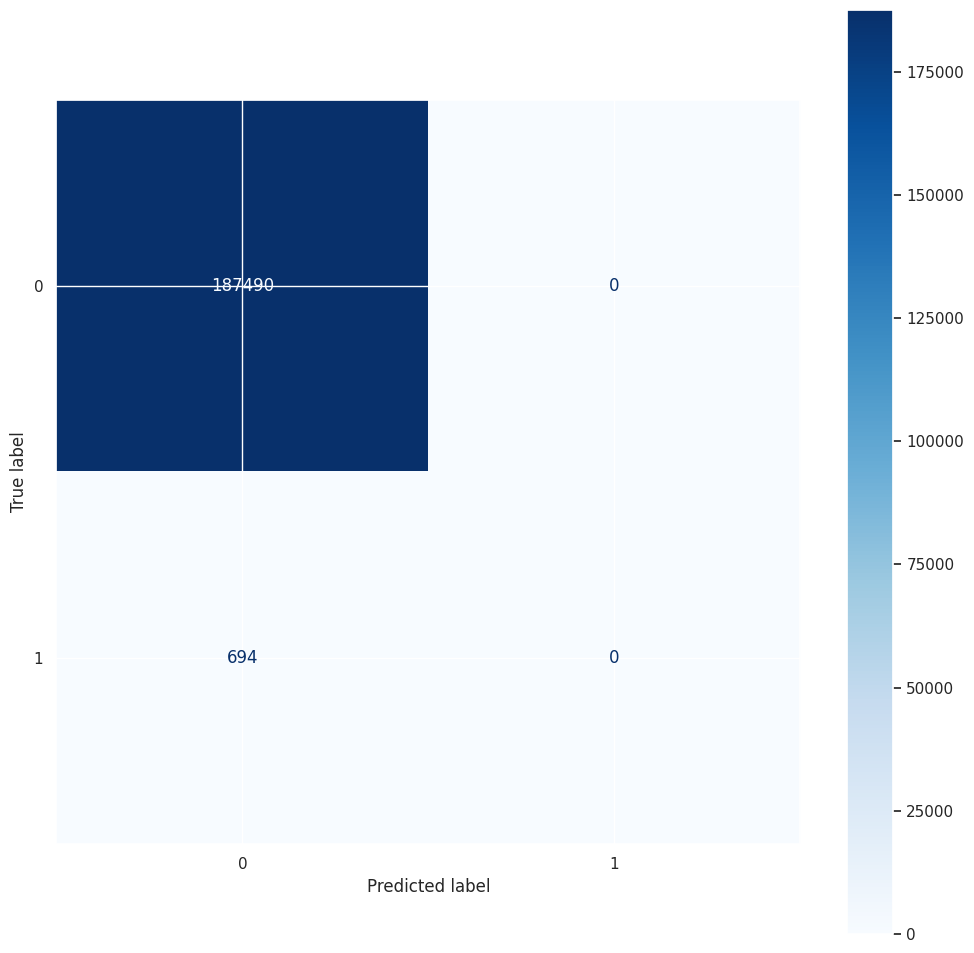

In [213]:
import time
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import (accuracy_score, recall_score, precision_score,
                             f1_score, roc_auc_score,
                             confusion_matrix, ConfusionMatrixDisplay)

# Model training + süre ölçümü
start_train = time.time()
lr_model = LogisticRegression(random_state=46, solver='lbfgs', max_iter=1000).fit(X_train, y_train)
end_train = time.time()
training_time = end_train - start_train

# Tahmin + süre ölçümü
start_pred = time.time()
lr_pred = lr_model.predict(X_test)
end_pred = time.time()
prediction_time = end_pred - start_pred

# Değerlendirme metrikleri
print("Logistic Regression Results:")
print(f"Training Time   : {training_time:.4f} seconds")
print(f"Prediction Time : {prediction_time:.4f} seconds")
print(f"Accuracy        : {accuracy_score(y_test, lr_pred):.4f}")
print(f"Recall          : {recall_score(y_test, lr_pred):.4f}")
print(f"Precision       : {precision_score(y_test, lr_pred):.4f}")
print(f"F1 Score        : {f1_score(y_test, lr_pred):.4f}")
print(f"AUC Score       : {roc_auc_score(y_test, lr_pred):.4f}")

# Confusion matrix
cm = confusion_matrix(y_test, lr_pred)
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
disp.plot(cmap="Blues")


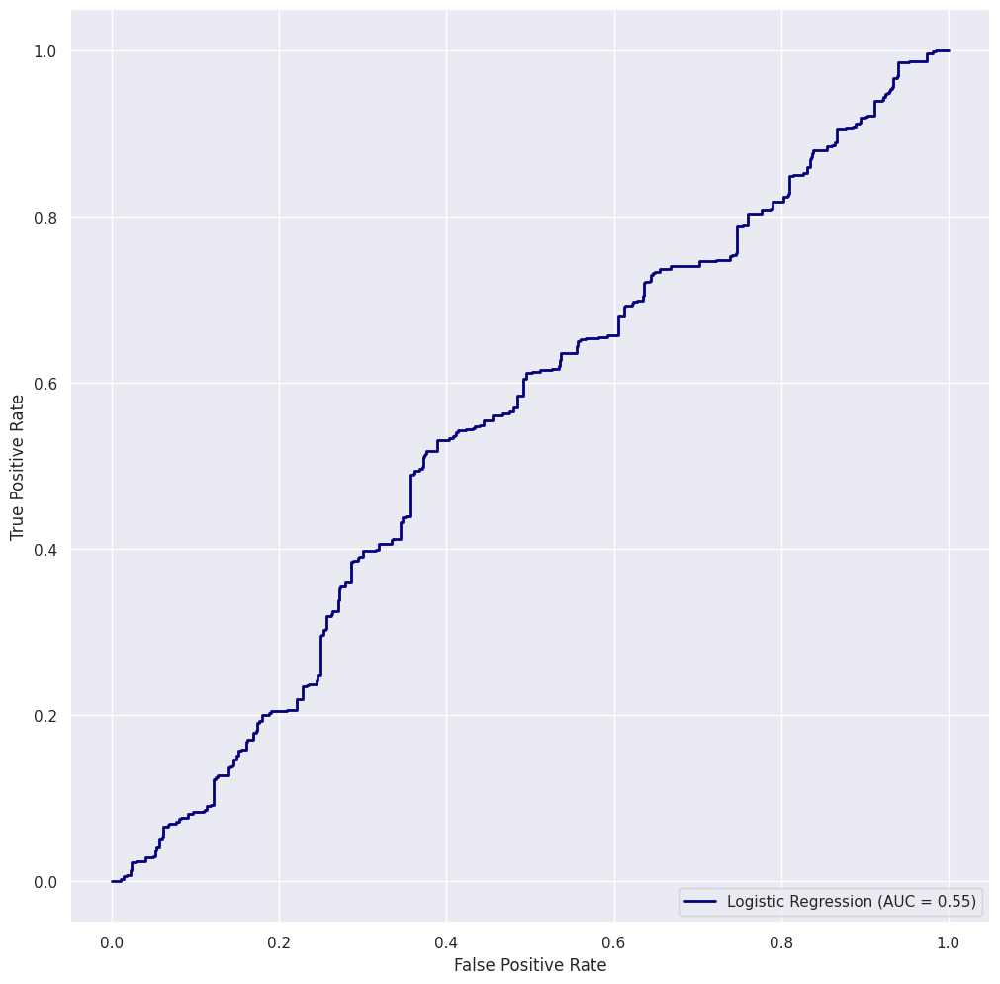

In [214]:
from sklearn.metrics import roc_curve, RocCurveDisplay

# Tahmin olasılıkları (pozitif sınıf = 1)
lr_probs = lr_model.predict_proba(X_test)[:, 1]

# ROC eğrisi için değerler
fpr_lr, tpr_lr, _ = roc_curve(y_test, lr_probs)

# ROC Curve çizimi
roc_display_lr = RocCurveDisplay(fpr=fpr_lr, tpr=tpr_lr,
                                 roc_auc=roc_auc_score(y_test, lr_probs),
                                 estimator_name='Logistic Regression')
roc_display_lr.plot(linewidth=2, color='navy')

# K-Nearest Neighbors (KNN)

K-Nearest Neighbors (KNN) Results:
Training Time   : 0.0611 seconds
Prediction Time : 152.4898 seconds
Accuracy        : 0.9988
Recall          : 0.6916
Precision       : 0.9581
F1 Score        : 0.8033
AUC Score       : 0.8458


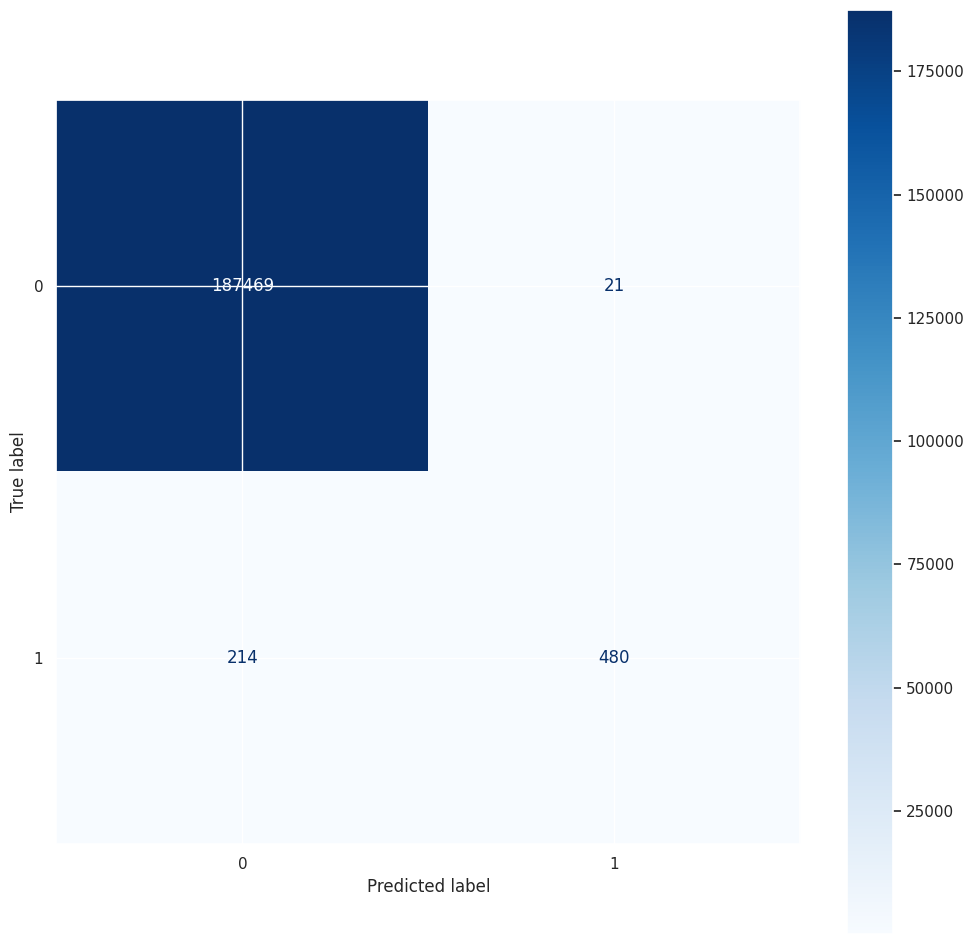

In [215]:
import time
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import (accuracy_score, recall_score, precision_score,
                             f1_score, roc_auc_score,
                             confusion_matrix, ConfusionMatrixDisplay)

# Modeli eğit ve süreyi ölç
start_train = time.time()
knn_model = KNeighborsClassifier().fit(X_train, y_train)
end_train = time.time()
training_time = end_train - start_train

# Tahmin yap ve süreyi ölç
start_pred = time.time()
knn_pred = knn_model.predict(X_test)
end_pred = time.time()
prediction_time = end_pred - start_pred

# Performans metrikleri
print("K-Nearest Neighbors (KNN) Results:")
print(f"Training Time   : {training_time:.4f} seconds")
print(f"Prediction Time : {prediction_time:.4f} seconds")
print(f"Accuracy        : {accuracy_score(y_test, knn_pred):.4f}")
print(f"Recall          : {recall_score(y_test, knn_pred):.4f}")
print(f"Precision       : {precision_score(y_test, knn_pred):.4f}")
print(f"F1 Score        : {f1_score(y_test, knn_pred):.4f}")
print(f"AUC Score       : {roc_auc_score(y_test, knn_pred):.4f}")

# Confusion matrix
cm = confusion_matrix(y_test, knn_pred)
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
disp.plot(cmap="Blues")


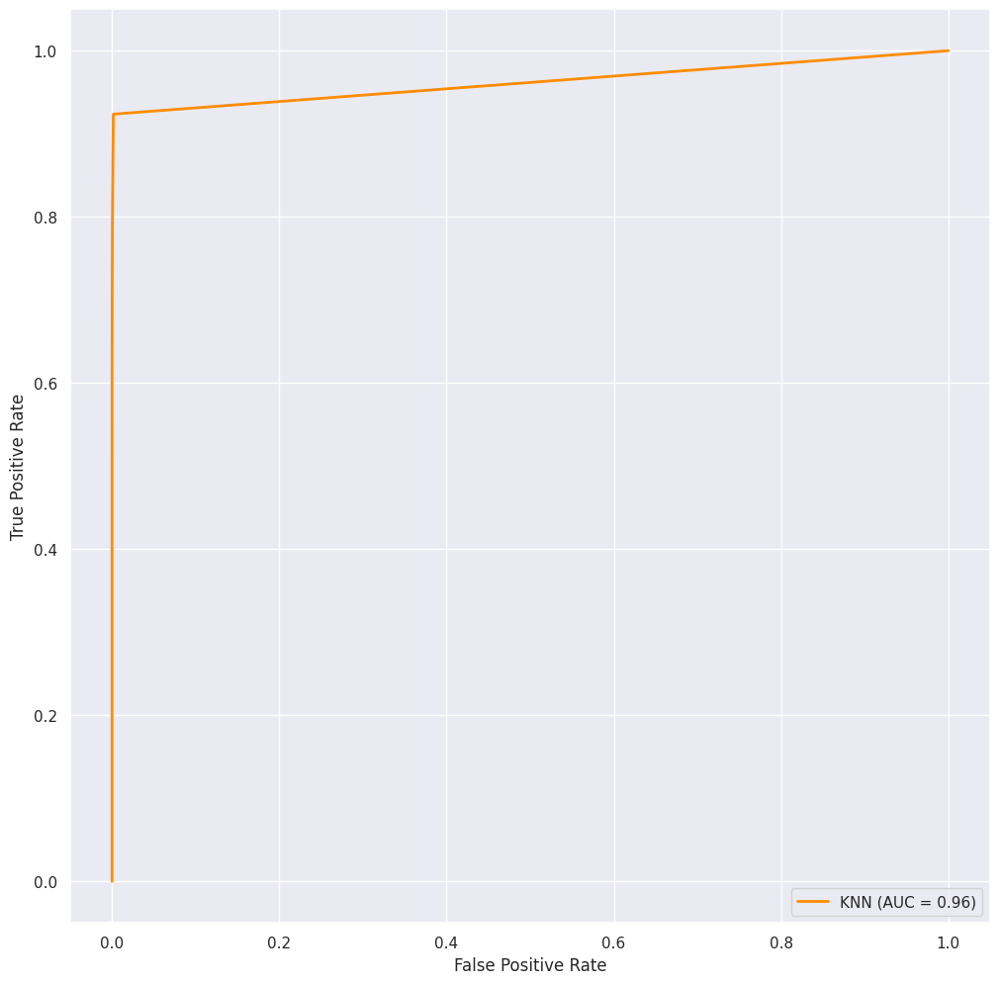

In [216]:
from sklearn.metrics import roc_curve, RocCurveDisplay

# Eğer predict_proba destekleniyorsa kullan (KNN destekliyor)
y_prob = knn_model.predict_proba(X_test)[:, 1]  # Pozitif sınıfın olasılığı

# ROC eğrisi hesapla
fpr, tpr, thresholds = roc_curve(y_test, y_prob)

# ROC eğrisini çiz
roc_display = RocCurveDisplay(fpr=fpr, tpr=tpr, roc_auc=roc_auc_score(y_test, y_prob), estimator_name='KNN')
roc_display.plot(linewidth=2, color='darkorange')


# Support Vector Classifier (SVC)

Support Vector Classifier (SVC) Results:
Training Time   : 603.1934 seconds
Prediction Time : 31.1641 seconds
Accuracy        : 0.9963
Recall          : 0.0000
Precision       : 0.0000
F1 Score        : 0.0000
AUC Score       : 0.5000


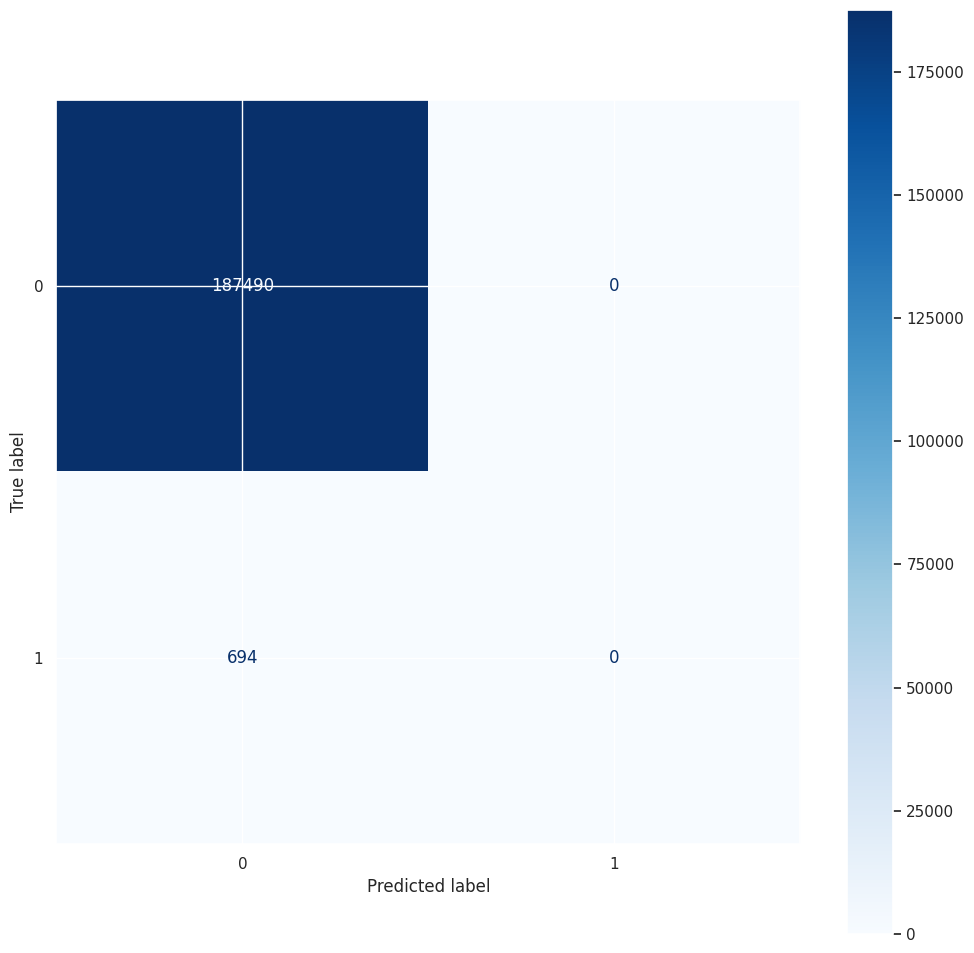

In [217]:
import time
from sklearn.svm import SVC
from sklearn.metrics import (accuracy_score, recall_score, precision_score,
                             f1_score, roc_auc_score,
                             confusion_matrix, ConfusionMatrixDisplay)

# Modeli eğit ve süreyi ölç
start_train = time.time()
svc_model = SVC(random_state=46, probability=True).fit(X_train, y_train)
end_train = time.time()
training_time = end_train - start_train

# Tahmin yap ve süreyi ölç
start_pred = time.time()
svc_pred = svc_model.predict(X_test)
end_pred = time.time()
prediction_time = end_pred - start_pred

# Performans metrikleri
print("Support Vector Classifier (SVC) Results:")
print(f"Training Time   : {training_time:.4f} seconds")
print(f"Prediction Time : {prediction_time:.4f} seconds")
print(f"Accuracy        : {accuracy_score(y_test, svc_pred):.4f}")
print(f"Recall          : {recall_score(y_test, svc_pred):.4f}")
print(f"Precision       : {precision_score(y_test, svc_pred):.4f}")
print(f"F1 Score        : {f1_score(y_test, svc_pred):.4f}")
print(f"AUC Score       : {roc_auc_score(y_test, svc_pred):.4f}")

# Confusion matrix
cm = confusion_matrix(y_test, svc_pred)
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
disp.plot(cmap="Blues")


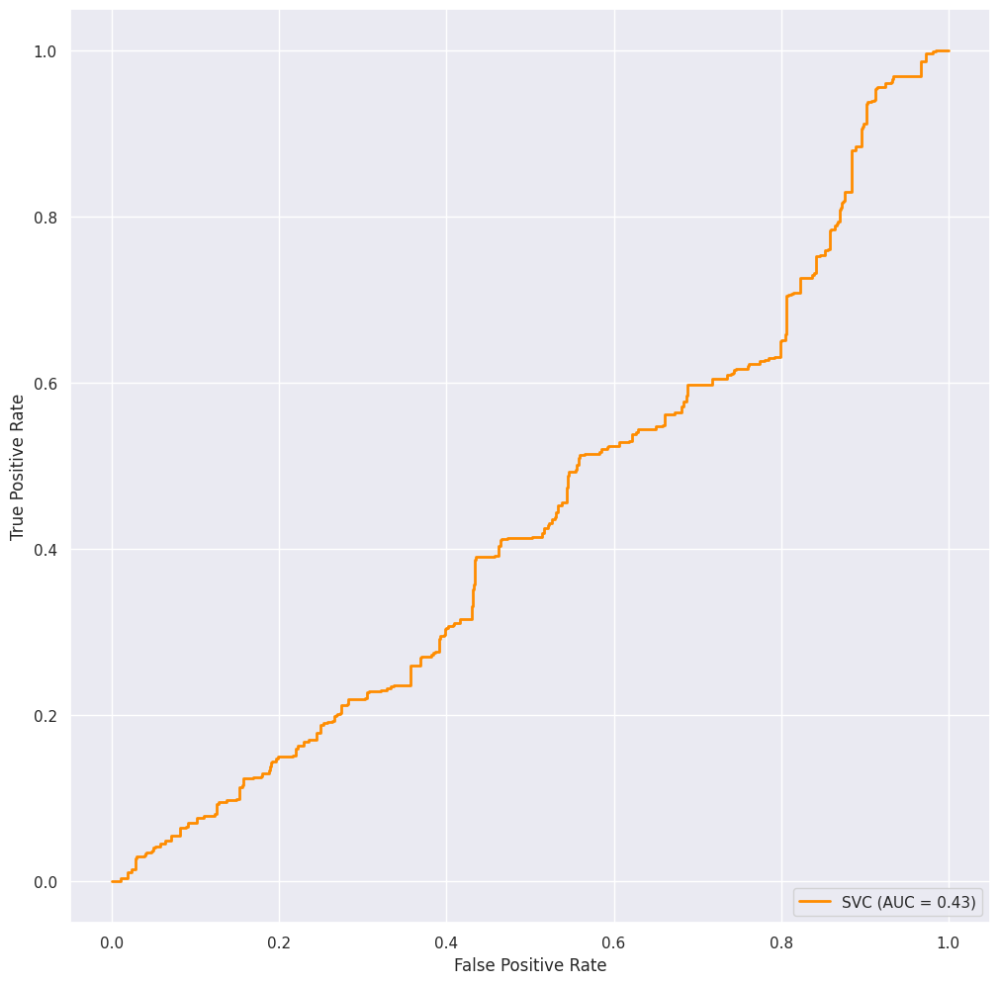

In [218]:
from sklearn.metrics import roc_curve, RocCurveDisplay

# Pozitif sınıf için tahmin olasılıkları
svc_probs = svc_model.predict_proba(X_test)[:, 1]

# FPR, TPR değerlerini hesapla
fpr_svc, tpr_svc, _ = roc_curve(y_test, svc_probs)

# ROC eğrisi çizimi
roc_display_svc = RocCurveDisplay(fpr=fpr_svc, tpr=tpr_svc,
                                  roc_auc=roc_auc_score(y_test, svc_probs),
                                  estimator_name='SVC')
roc_display_svc.plot(linewidth=2, color='darkorange')


# Decision Tree Classifier

Decision Tree Classifier Results:
Training Time   : 0.5121 seconds
Prediction Time : 0.0233 seconds
Accuracy        : 1.0000
Recall          : 1.0000
Precision       : 1.0000
F1 Score        : 1.0000
AUC Score       : 1.0000


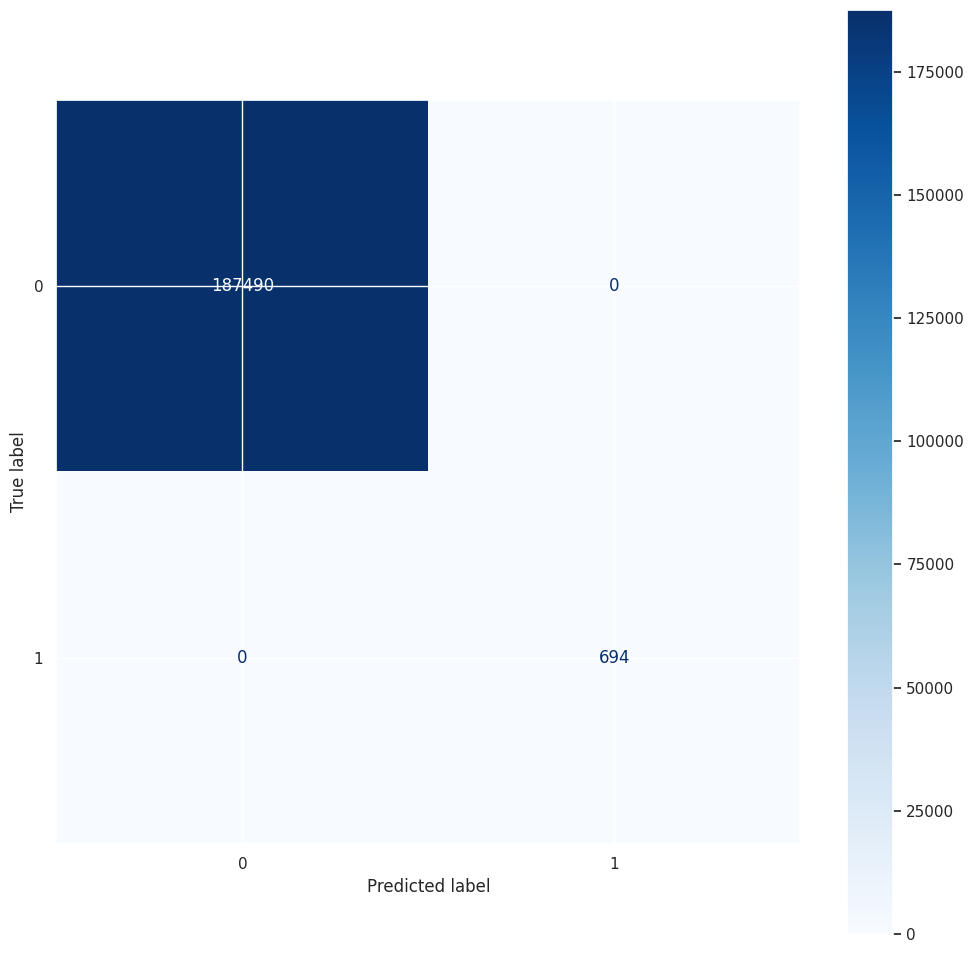

In [219]:
import time
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import (accuracy_score, recall_score, precision_score,
                             f1_score, roc_auc_score,
                             confusion_matrix, ConfusionMatrixDisplay)

# Model eğitimi
start_train = time.time()
dt_model = DecisionTreeClassifier(random_state=46).fit(X_train, y_train)
end_train = time.time()
training_time = end_train - start_train

# Tahmin
start_pred = time.time()
dt_pred = dt_model.predict(X_test)
end_pred = time.time()
prediction_time = end_pred - start_pred

# Performans çıktıları
print("Decision Tree Classifier Results:")
print(f"Training Time   : {training_time:.4f} seconds")
print(f"Prediction Time : {prediction_time:.4f} seconds")
print(f"Accuracy        : {accuracy_score(y_test, dt_pred):.4f}")
print(f"Recall          : {recall_score(y_test, dt_pred):.4f}")
print(f"Precision       : {precision_score(y_test, dt_pred):.4f}")
print(f"F1 Score        : {f1_score(y_test, dt_pred):.4f}")
print(f"AUC Score       : {roc_auc_score(y_test, dt_pred):.4f}")

# Confusion Matrix
cm = confusion_matrix(y_test, dt_pred)
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
disp.plot(cmap="Blues")


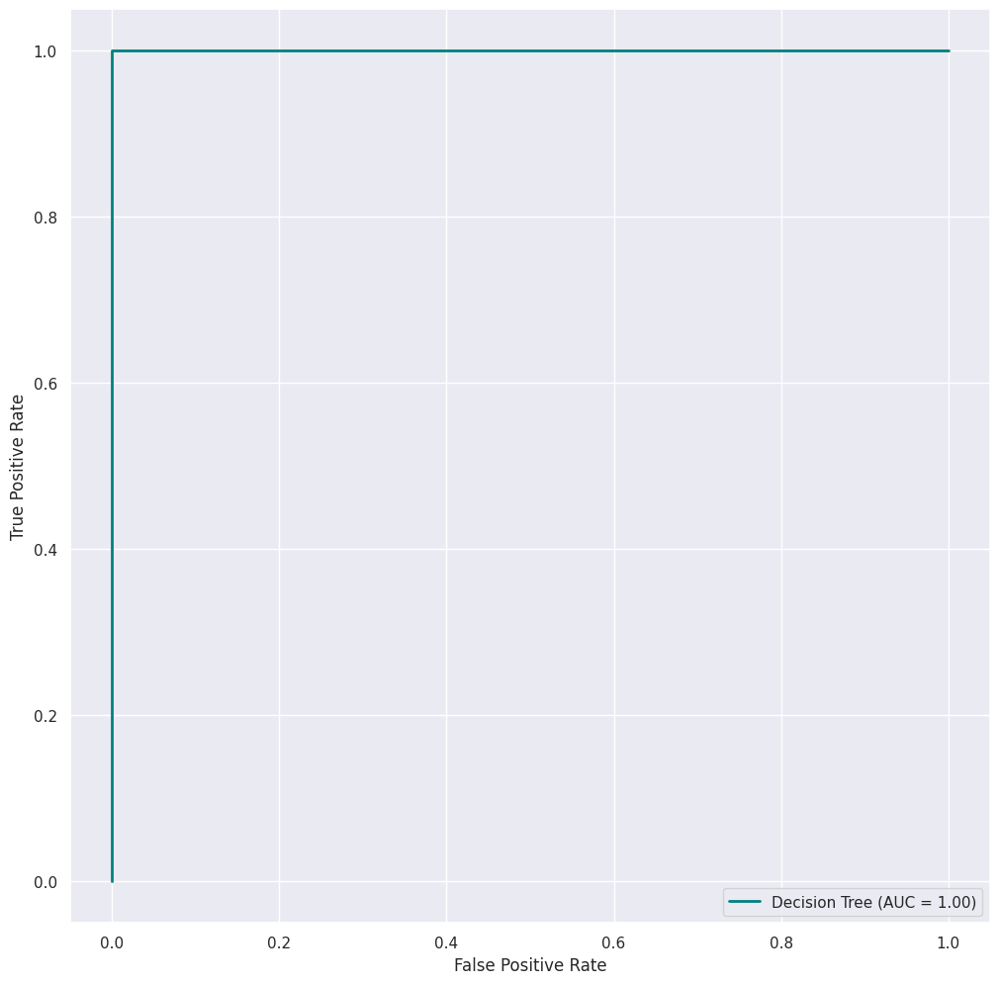

In [220]:
from sklearn.metrics import roc_curve, RocCurveDisplay

# Decision Tree için olasılık tahminleri
dt_probs = dt_model.predict_proba(X_test)[:, 1]

# ROC eğrisi için FPR, TPR hesapla
fpr_dt, tpr_dt, _ = roc_curve(y_test, dt_probs)

# ROC görselleştirme
roc_display_dt = RocCurveDisplay(fpr=fpr_dt, tpr=tpr_dt,
                                 roc_auc=roc_auc_score(y_test, dt_probs),
                                 estimator_name='Decision Tree')
roc_display_dt.plot(linewidth=2, color='teal')


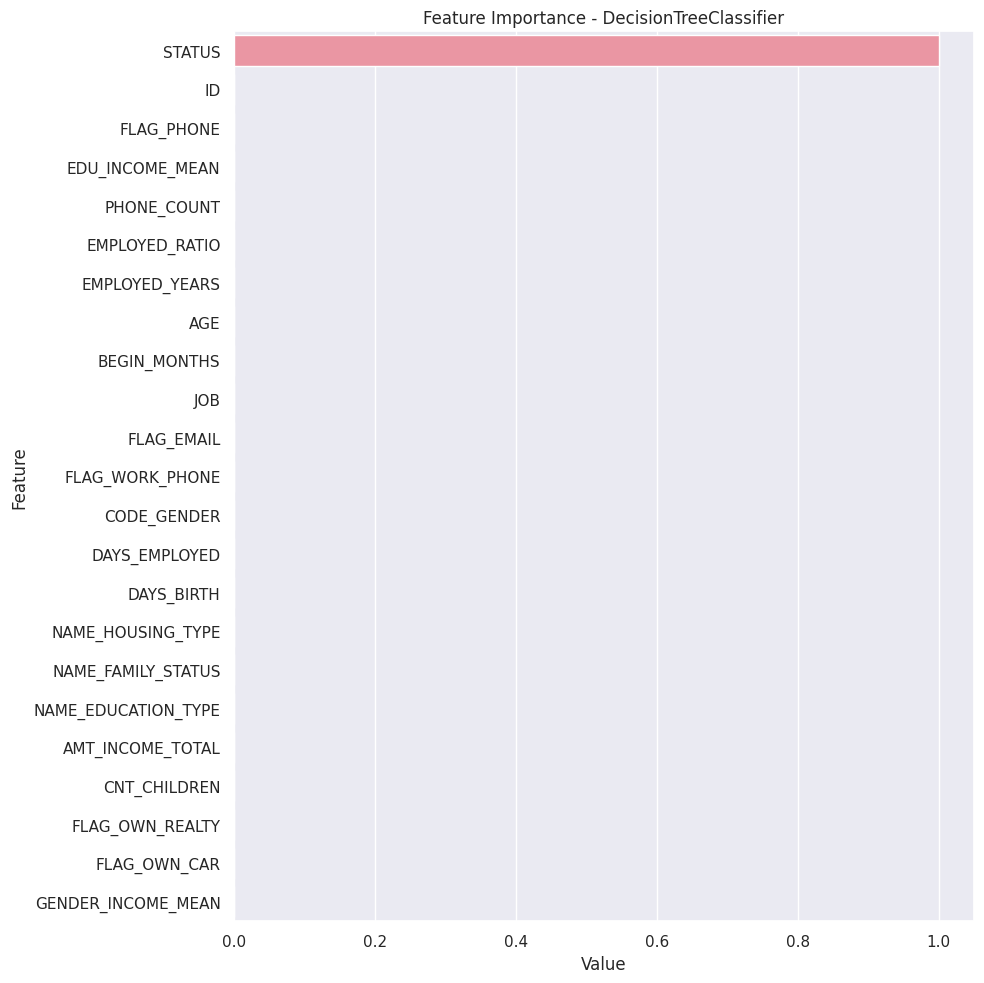

In [221]:
def plot_importance(model, features, num=len(X), save=False):
    feature_imp = pd.DataFrame({'Value': model.feature_importances_, 'Feature': features.columns})
    plt.figure(figsize=(10, 10))
    sns.set(font_scale=1)
    sns.barplot(x="Value", y="Feature", data=feature_imp.sort_values(by="Value", ascending=False)[0:num])
    plt.title(f'Feature Importance - {model.__class__.__name__}')
    plt.tight_layout()
    plt.show(block=True)
    if save:
        plt.savefig('importances.png')
plot_importance(dt_model, X)

# AdaBoost Classifier

AdaBoost Classifier Results:
Training Time   : 20.9872 seconds
Prediction Time : 1.2669 seconds
Accuracy        : 1.0000
Recall          : 1.0000
Precision       : 1.0000
F1 Score        : 1.0000
AUC Score       : 1.0000


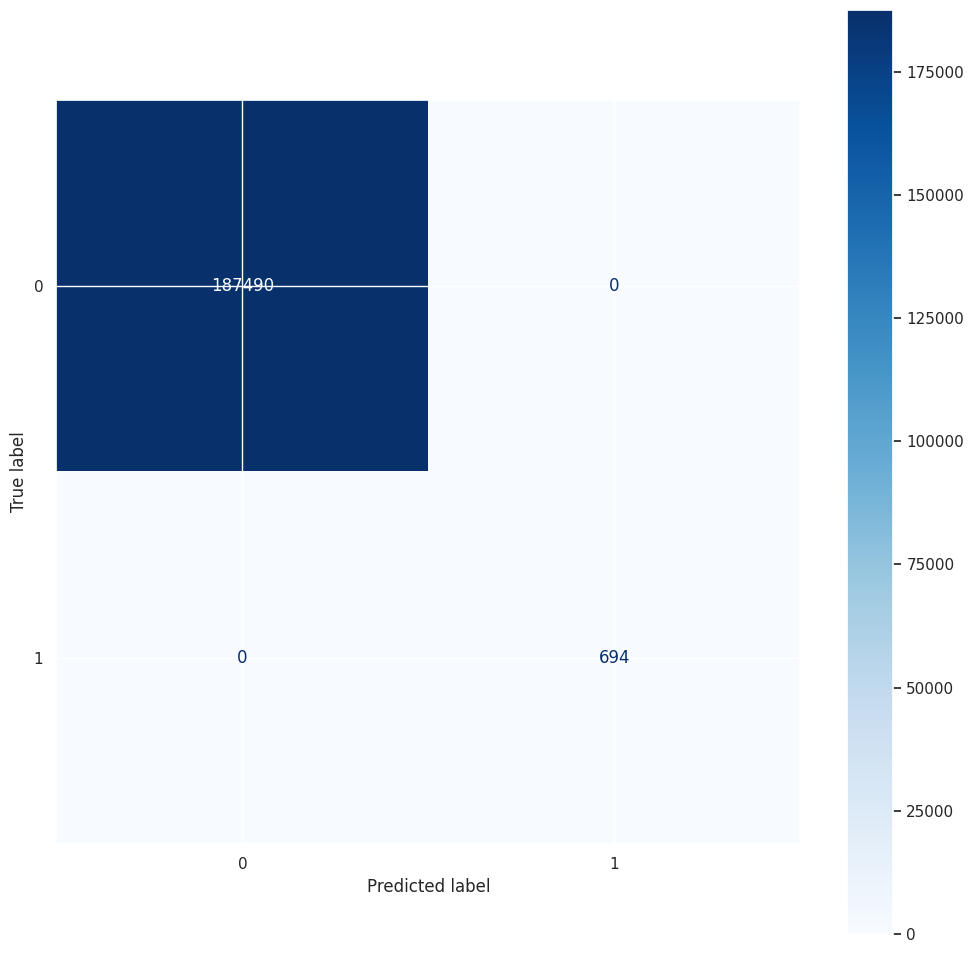

In [222]:
import time
from sklearn.ensemble import AdaBoostClassifier
from sklearn.metrics import (accuracy_score, recall_score, precision_score,
                             f1_score, roc_auc_score,
                             confusion_matrix, ConfusionMatrixDisplay)

# Model eğitimi
start_train = time.time()
ada_model = AdaBoostClassifier(random_state=46).fit(X_train, y_train)
end_train = time.time()
training_time = end_train - start_train

# Tahmin
start_pred = time.time()
ada_pred = ada_model.predict(X_test)
end_pred = time.time()
prediction_time = end_pred - start_pred

# Performans çıktıları
print("AdaBoost Classifier Results:")
print(f"Training Time   : {training_time:.4f} seconds")
print(f"Prediction Time : {prediction_time:.4f} seconds")
print(f"Accuracy        : {accuracy_score(y_test, ada_pred):.4f}")
print(f"Recall          : {recall_score(y_test, ada_pred):.4f}")
print(f"Precision       : {precision_score(y_test, ada_pred):.4f}")
print(f"F1 Score        : {f1_score(y_test, ada_pred):.4f}")
print(f"AUC Score       : {roc_auc_score(y_test, ada_pred):.4f}")

# Confusion Matrix
cm = confusion_matrix(y_test, ada_pred)
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
disp.plot(cmap="Blues")

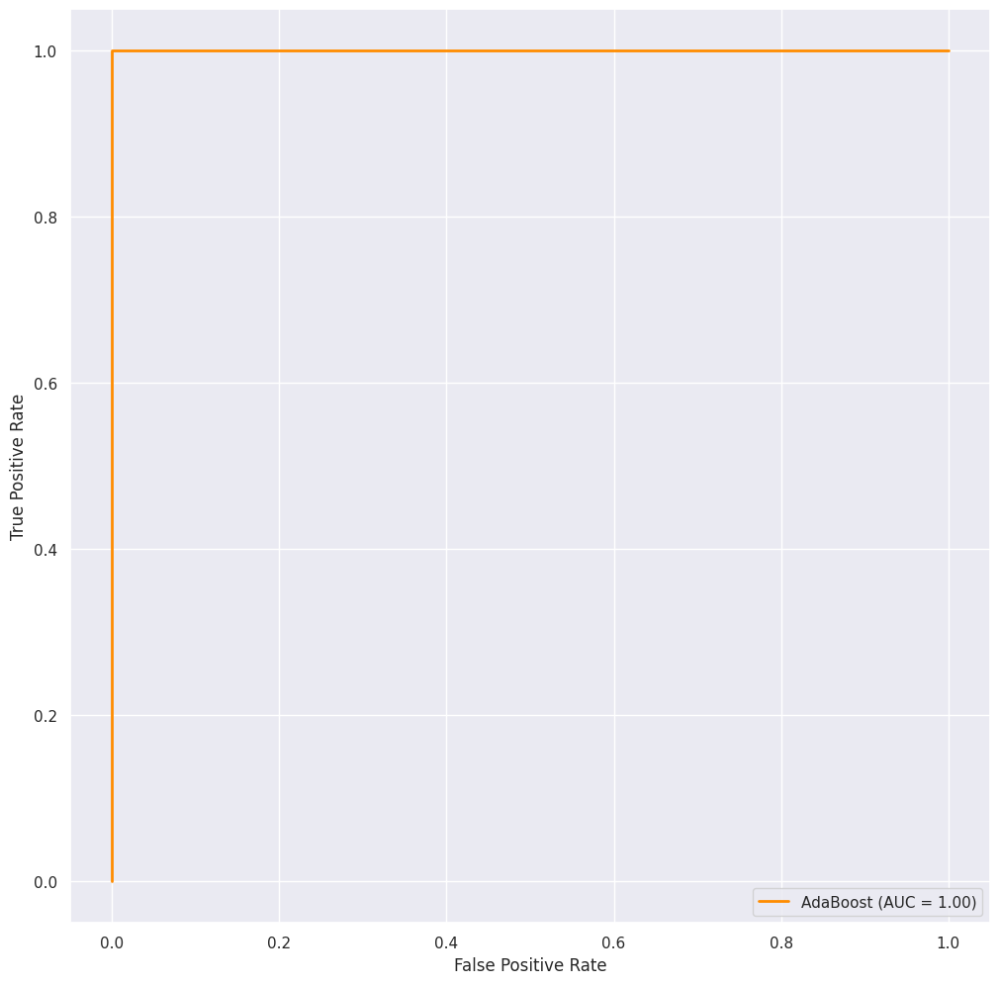

In [223]:
from sklearn.metrics import roc_curve, RocCurveDisplay

# Olasılık tahmini (pozitif sınıf için)
ada_probs = ada_model.predict_proba(X_test)[:, 1]

# FPR, TPR değerlerini hesapla
fpr_ada, tpr_ada, _ = roc_curve(y_test, ada_probs)

# ROC eğrisi çizimi
roc_display_ada = RocCurveDisplay(fpr=fpr_ada, tpr=tpr_ada,
                                  roc_auc=roc_auc_score(y_test, ada_probs),
                                  estimator_name='AdaBoost')
roc_display_ada.plot(linewidth=2, color='darkorange')


# Gradient Boosting Classifier

Gradient Boosting Classifier:
Training Time: 43.3405 seconds
Prediction Time: 0.2841 seconds
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1 Score: 1.0
AUC: 1.0


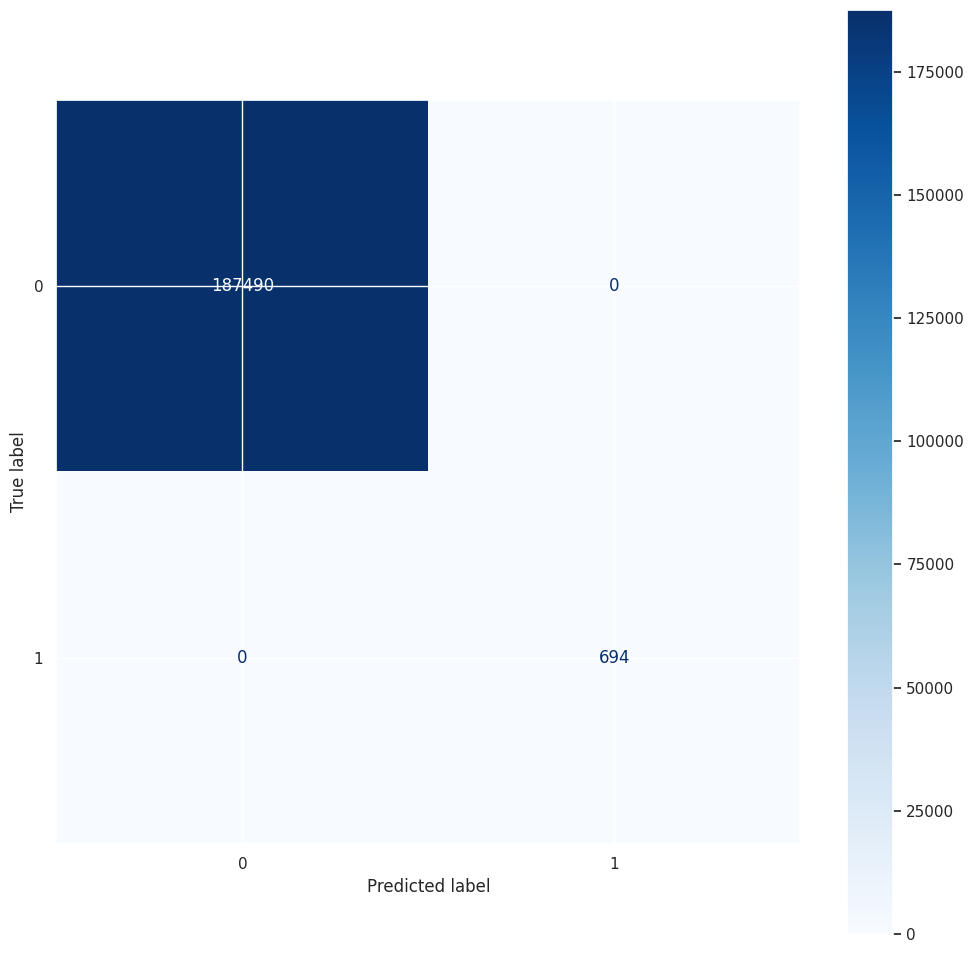

In [224]:
import time
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

# Eğitim süresi ölçümü
start_train = time.time()
gb_model = GradientBoostingClassifier(random_state=46).fit(X_train, y_train)
end_train = time.time()

# Tahmin süresi ölçümü
start_pred = time.time()
gb_pred = gb_model.predict(X_test)
end_pred = time.time()

# Skorlar
print("Gradient Boosting Classifier:")
print(f"Training Time: {round(end_train - start_train, 4)} seconds")
print(f"Prediction Time: {round(end_pred - start_pred, 4)} seconds")
print(f"Accuracy: {round(accuracy_score(gb_pred, y_test), 4)}")
print(f"Recall: {round(recall_score(gb_pred, y_test), 4)}")
print(f"Precision: {round(precision_score(gb_pred, y_test), 4)}")
print(f"F1 Score: {round(f1_score(gb_pred, y_test), 4)}")
print(f"AUC: {round(roc_auc_score(gb_pred, y_test), 4)}")

# Confusion matrix görselleştirme
cm = confusion_matrix(y_test, gb_pred)
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
disp.plot(cmap='Blues')


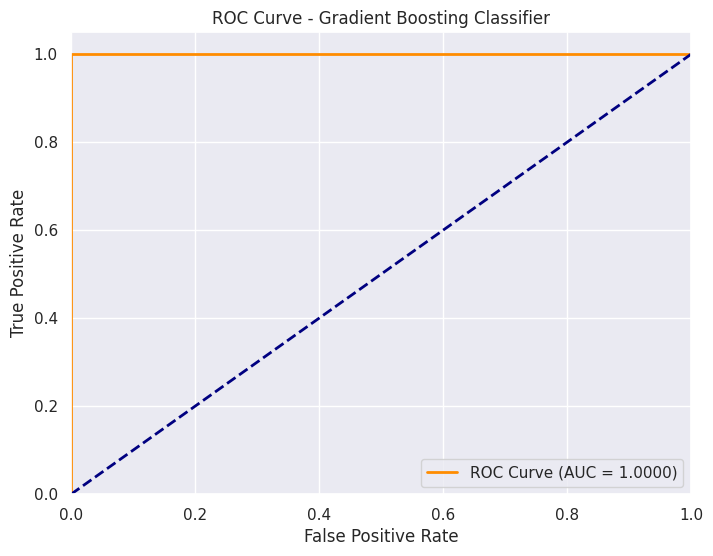

In [225]:
from sklearn.metrics import roc_curve, auc
import matplotlib.pyplot as plt

# Olasılık tahminleri
gb_probs = gb_model.predict_proba(X_test)[:, 1]

# ROC eğrisi için FPR, TPR değerleri
fpr, tpr, thresholds = roc_curve(y_test, gb_probs)
roc_auc = auc(fpr, tpr)

# ROC eğrisi çizimi
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC Curve (AUC = {roc_auc:.4f})')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve - Gradient Boosting Classifier')
plt.legend(loc="lower right")
plt.grid(True)
plt.show()

# XGBoost Classifier

XGBoost Classifier:
Training Time: 1.6224 seconds
Prediction Time: 0.0717 seconds
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1 Score: 1.0
AUC: 1.0


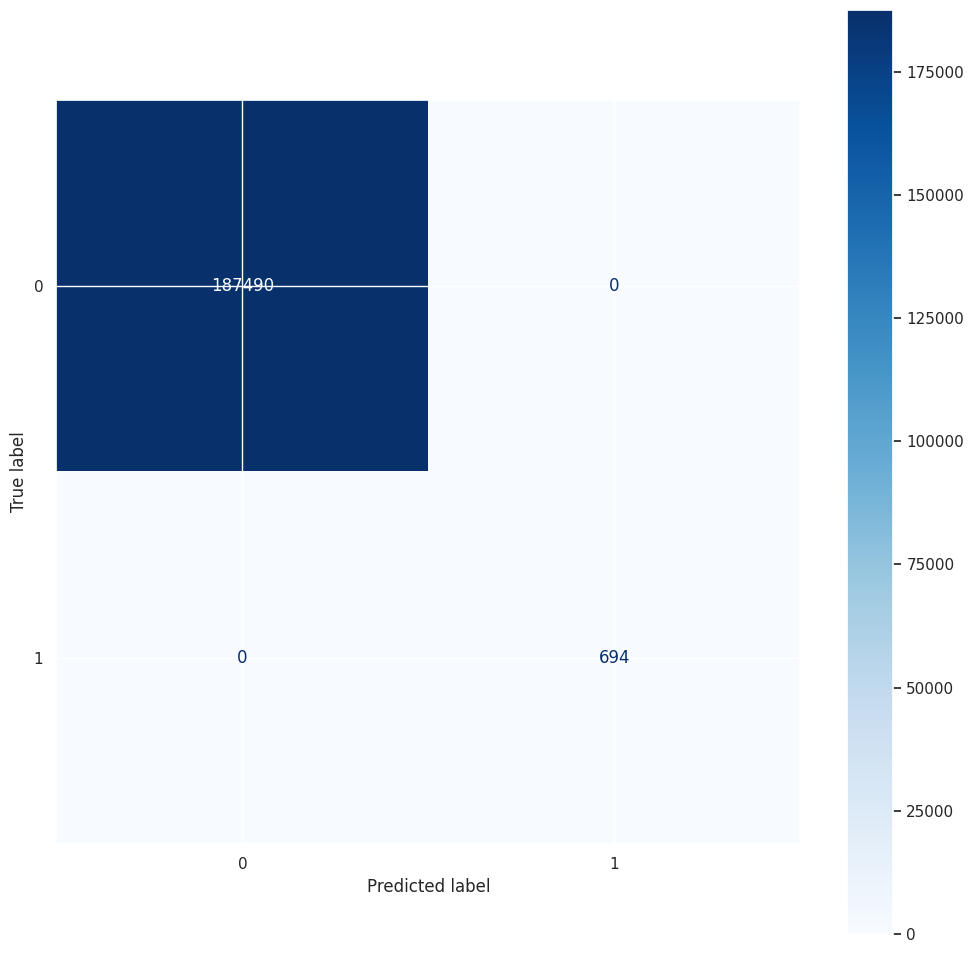

In [226]:
import time
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

# Eğitim süresi ölçümü
start_train = time.time()
xgb_model = XGBClassifier(random_state=46).fit(X_train, y_train)
end_train = time.time()

# Tahmin süresi ölçümü
start_pred = time.time()
xgb_pred = xgb_model.predict(X_test)
end_pred = time.time()

# Performans metrikleri
print("XGBoost Classifier:")
print(f"Training Time: {round(end_train - start_train, 4)} seconds")
print(f"Prediction Time: {round(end_pred - start_pred, 4)} seconds")
print(f"Accuracy: {round(accuracy_score(xgb_pred, y_test), 4)}")
print(f"Recall: {round(recall_score(xgb_pred, y_test), 4)}")
print(f"Precision: {round(precision_score(xgb_pred, y_test), 4)}")
print(f"F1 Score: {round(f1_score(xgb_pred, y_test), 4)}")
print(f"AUC: {round(roc_auc_score(xgb_pred, y_test), 4)}")

# Confusion matrix görselleştirme
cm = confusion_matrix(y_test, xgb_pred)
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
disp.plot(cmap='Blues')


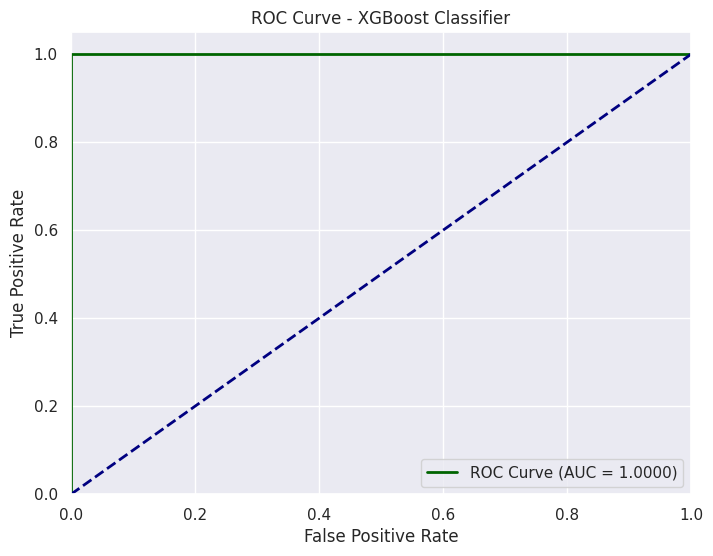

In [227]:
from sklearn.metrics import roc_curve, auc
import matplotlib.pyplot as plt

# Olasılık tahminleri (pozitif sınıf için)
xgb_probs = xgb_model.predict_proba(X_test)[:, 1]

# ROC eğrisi için FPR, TPR ve threshold hesaplama
fpr, tpr, thresholds = roc_curve(y_test, xgb_probs)
roc_auc = auc(fpr, tpr)

# ROC eğrisi çizimi
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='darkgreen', lw=2, label=f'ROC Curve (AUC = {roc_auc:.4f})')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve - XGBoost Classifier')
plt.legend(loc="lower right")
plt.grid(True)
plt.show()


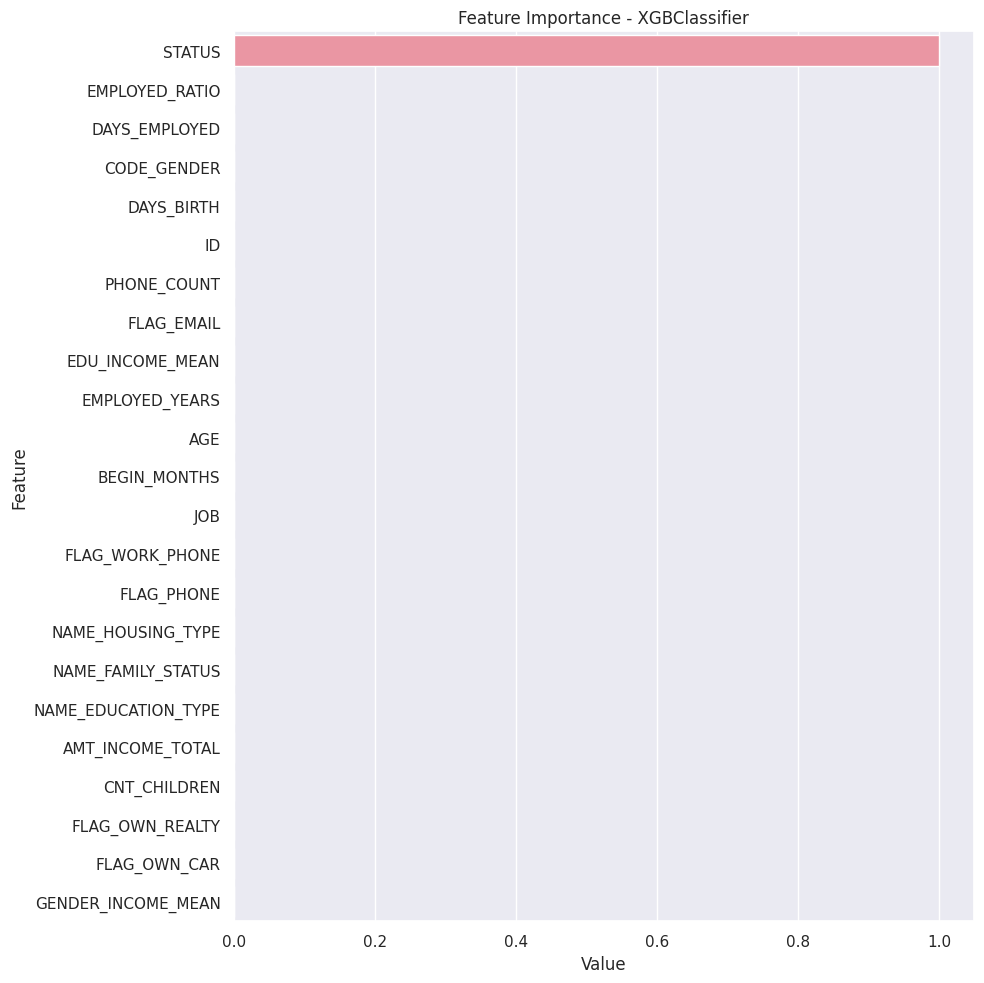

In [228]:
def plot_importance(model, features, num=len(X), save=False):
    feature_imp = pd.DataFrame({'Value': model.feature_importances_, 'Feature': features.columns})
    plt.figure(figsize=(10, 10))
    sns.set(font_scale=1)
    sns.barplot(x="Value", y="Feature", data=feature_imp.sort_values(by="Value", ascending=False)[0:num])
    plt.title(f'Feature Importance - {model.__class__.__name__}')
    plt.tight_layout()
    plt.show(block=True)
    if save:
        plt.savefig('importances.png')
plot_importance(xgb_model, X)

# LightGBM Classifier

[LightGBM] [Info] Number of positive: 1268, number of negative: 348215
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.041307 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1391
[LightGBM] [Info] Number of data points in the train set: 349483, number of used features: 23
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.003628 -> initscore=-5.615379
[LightGBM] [Info] Start training from score -5.615379
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best ga

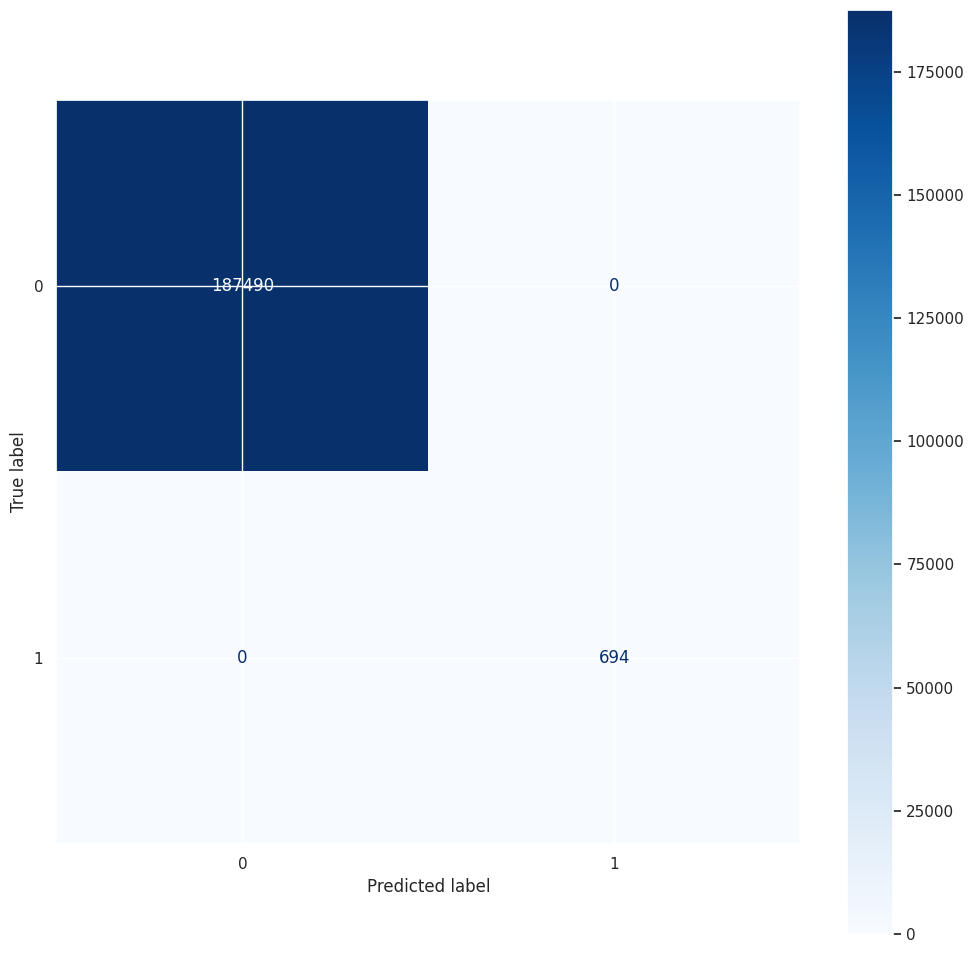

In [229]:
import time
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

# Eğitim süresi ölçümü
start_train = time.time()
lgbm_model = LGBMClassifier(random_state=46).fit(X_train, y_train)
end_train = time.time()

# Tahmin süresi ölçümü
start_pred = time.time()
lgbm_pred = lgbm_model.predict(X_test)
end_pred = time.time()

# Performans metrikleri
print("LightGBM Classifier:")
print(f"Training Time: {round(end_train - start_train, 4)} seconds")
print(f"Prediction Time: {round(end_pred - start_pred, 4)} seconds")
print(f"Accuracy: {round(accuracy_score(lgbm_pred, y_test), 4)}")
print(f"Recall: {round(recall_score(lgbm_pred, y_test), 4)}")
print(f"Precision: {round(precision_score(lgbm_pred, y_test), 4)}")
print(f"F1 Score: {round(f1_score(lgbm_pred, y_test), 4)}")
print(f"AUC: {round(roc_auc_score(lgbm_pred, y_test), 4)}")

# Confusion matrix görselleştirme
cm = confusion_matrix(y_test, lgbm_pred)
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
disp.plot(cmap='Blues')


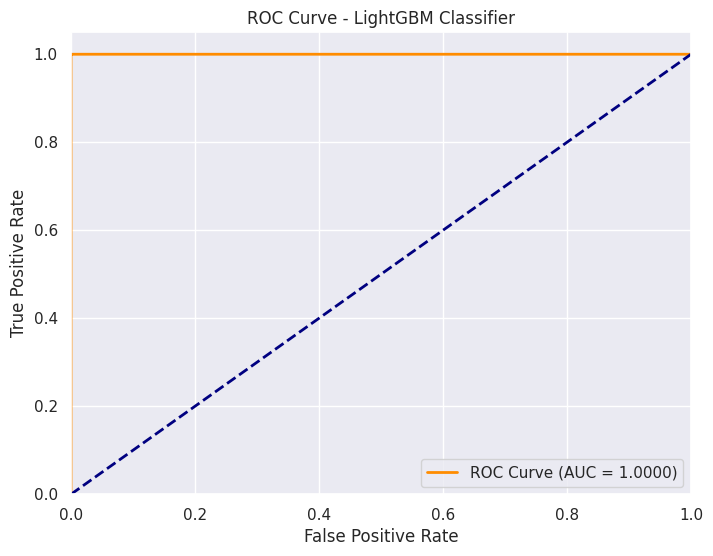

In [230]:
from sklearn.metrics import roc_curve, auc
import matplotlib.pyplot as plt

# LightGBM için pozitif sınıf olasılık tahminleri
lgbm_probs = lgbm_model.predict_proba(X_test)[:, 1]

# ROC eğrisi için FPR, TPR ve eşik değerler
fpr, tpr, thresholds = roc_curve(y_test, lgbm_probs)
roc_auc = auc(fpr, tpr)

# ROC eğrisini çiz
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC Curve (AUC = {roc_auc:.4f})')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve - LightGBM Classifier')
plt.legend(loc='lower right')
plt.grid(True)
plt.show()


# CatBoostClassifier

CatBoost Classifier:
Training Time: 40.1748 seconds
Prediction Time: 0.1753 seconds
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1 Score: 1.0
AUC: 1.0


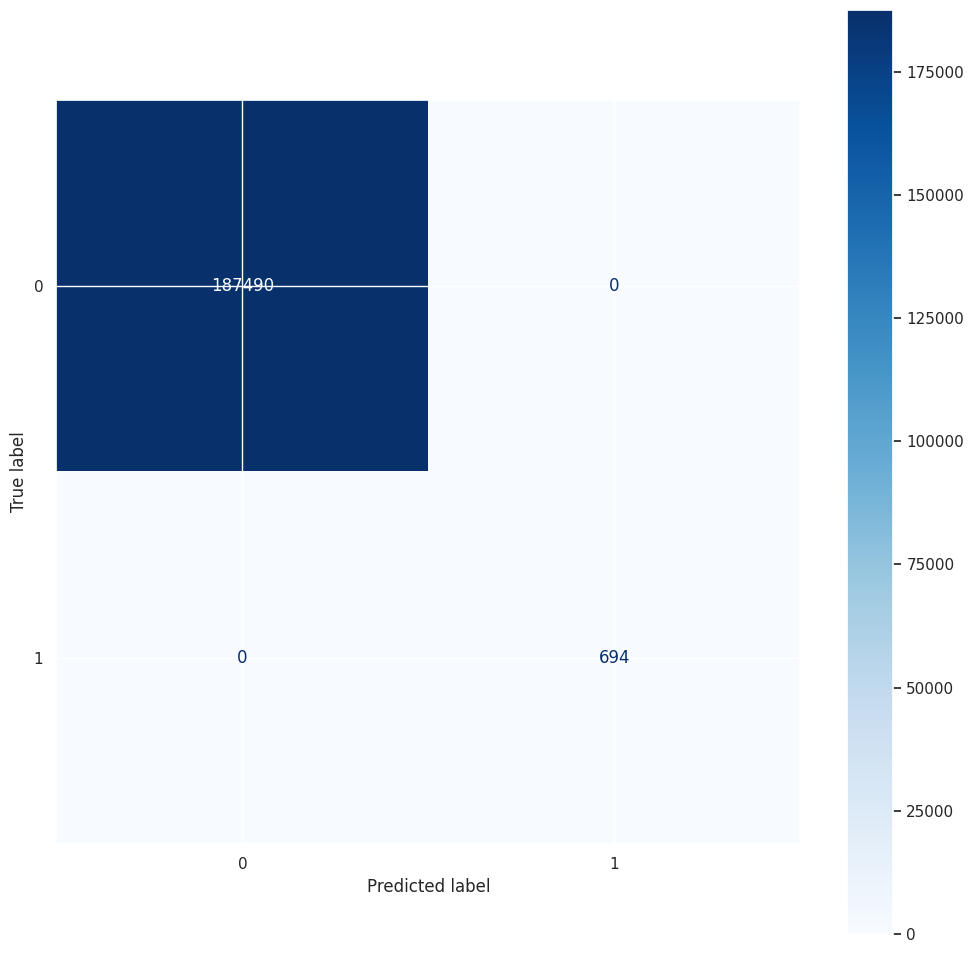

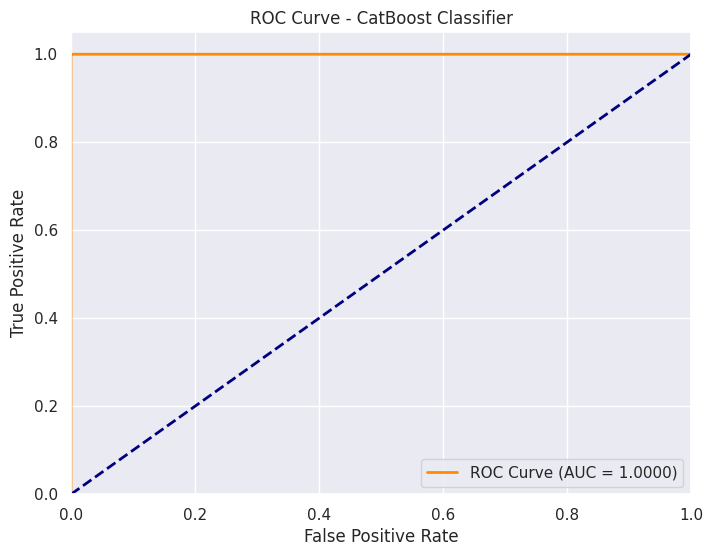

In [231]:
import time
from catboost import CatBoostClassifier
from sklearn.metrics import accuracy_score, recall_score, precision_score, f1_score, roc_auc_score, confusion_matrix, ConfusionMatrixDisplay, roc_curve, auc
import matplotlib.pyplot as plt

# Model eğitimi zamanı
start_train = time.time()
cat_model = CatBoostClassifier(random_state=46, verbose=False).fit(X_train, y_train)
end_train = time.time()

# Tahmin zamanı
start_pred = time.time()
cat_pred = cat_model.predict(X_test)
end_pred = time.time()

# Performans metrikleri yazdırma
print("CatBoost Classifier:")
print(f"Training Time: {round(end_train - start_train, 4)} seconds")
print(f"Prediction Time: {round(end_pred - start_pred, 4)} seconds")
print(f"Accuracy: {round(accuracy_score(cat_pred, y_test), 4)}")
print(f"Recall: {round(recall_score(cat_pred, y_test), 4)}")
print(f"Precision: {round(precision_score(cat_pred, y_test), 4)}")
print(f"F1 Score: {round(f1_score(cat_pred, y_test), 4)}")
print(f"AUC: {round(roc_auc_score(cat_pred, y_test), 4)}")

# Confusion matrix görselleştirme
cm = confusion_matrix(y_test, cat_pred)
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
disp.plot(cmap='Blues')

# ROC eğrisi
cat_probs = cat_model.predict_proba(X_test)[:, 1]
fpr, tpr, thresholds = roc_curve(y_test, cat_probs)
roc_auc = auc(fpr, tpr)

plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC Curve (AUC = {roc_auc:.4f})')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve - CatBoost Classifier')
plt.legend(loc='lower right')
plt.grid(True)
plt.show()


# HistGradientBoostingClassifier

HistGradientBoostingClassifier:
Training Time: 5.6866 seconds
Prediction Time: 0.9847 seconds
Accuracy: 1.0
Recall: 1.0
Precision: 1.0
F1 Score: 1.0
AUC: 1.0
Confusion Matrix:
[[187490      0]
 [     0    694]]


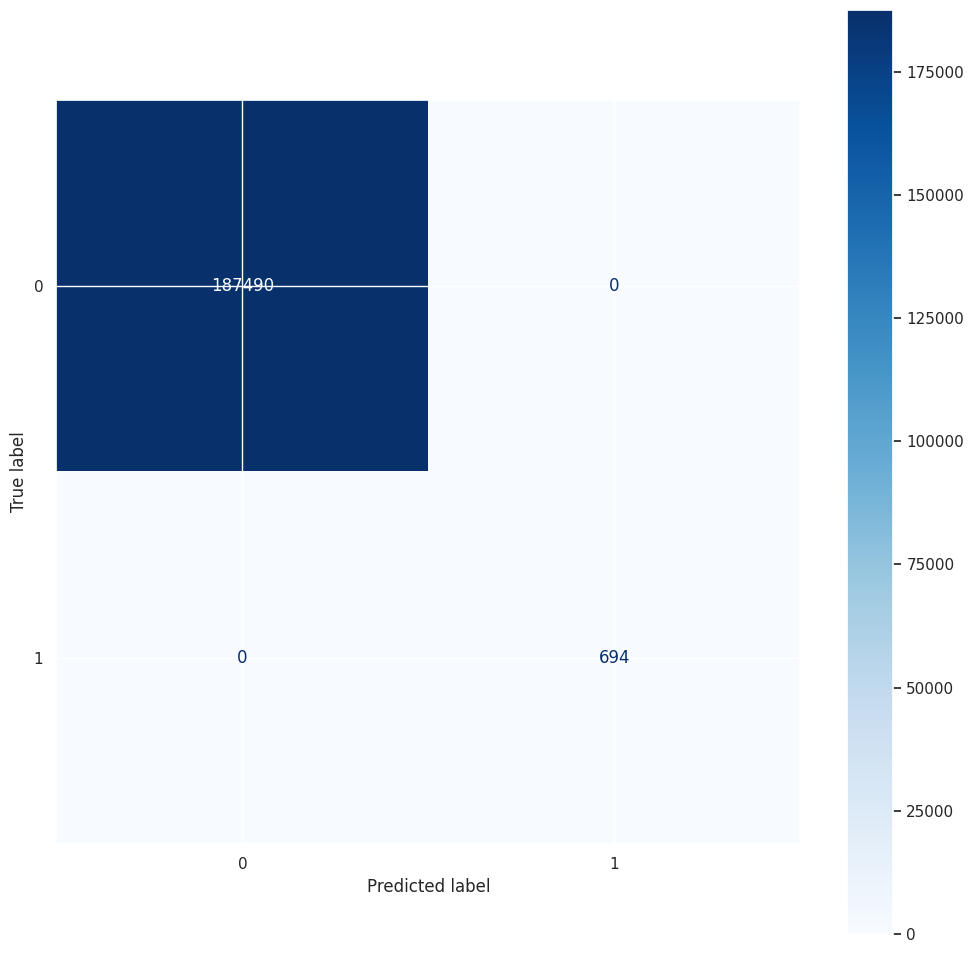

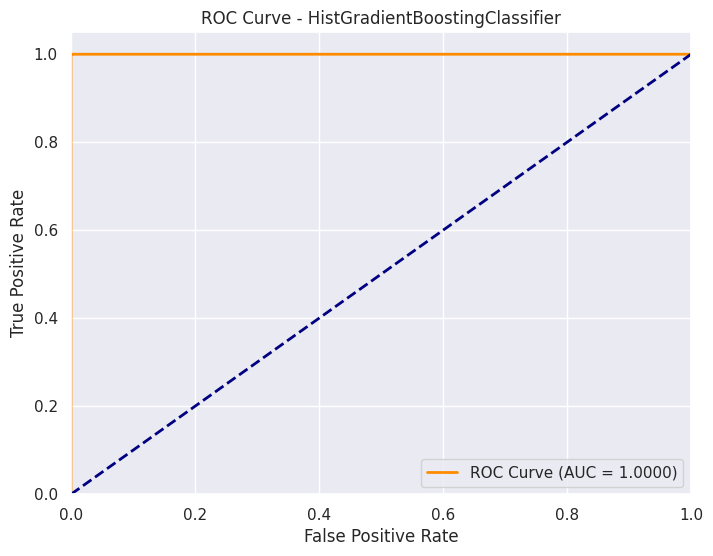

In [232]:
from sklearn.ensemble import HistGradientBoostingClassifier
from sklearn.metrics import accuracy_score, recall_score, precision_score, f1_score, roc_auc_score, roc_curve, auc
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import time

# Model eğitimi ve zaman ölçümü
start_train = time.time()
hgb_model = HistGradientBoostingClassifier(random_state=46).fit(X_train, y_train)
end_train = time.time()

# Tahmin ve zaman ölçümü
start_pred = time.time()
hgb_pred = hgb_model.predict(X_test)
hgb_pred_proba = hgb_model.predict_proba(X_test)[:, 1]
end_pred = time.time()

# Performans metrikleri
print("HistGradientBoostingClassifier:")
print(f"Training Time: {round(end_train - start_train, 4)} seconds")
print(f"Prediction Time: {round(end_pred - start_pred, 4)} seconds")
print(f"Accuracy: {round(accuracy_score(y_test, hgb_pred), 4)}")
print(f"Recall: {round(recall_score(y_test, hgb_pred), 4)}")
print(f"Precision: {round(precision_score(y_test, hgb_pred), 4)}")
print(f"F1 Score: {round(f1_score(y_test, hgb_pred), 4)}")
print(f"AUC: {round(roc_auc_score(y_test, hgb_pred_proba), 4)}")

# Confusion Matrix
cm = confusion_matrix(y_test, hgb_pred)
print("Confusion Matrix:")
print(cm)

cm = confusion_matrix(y_test, cat_pred)
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
disp.plot(cmap='Blues')

# ROC Curve çizimi
fpr, tpr, thresholds = roc_curve(y_test, hgb_pred_proba)
roc_auc = auc(fpr, tpr)

plt.figure(figsize=(8,6))
plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC Curve (AUC = {roc_auc:.4f})')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0,1])
plt.ylim([0,1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve - HistGradientBoostingClassifier')
plt.legend(loc='lower right')
plt.grid(True)
plt.show()


| Model                     | Training Time (s) |
| ------------------------- | ----------------- |
| K-Nearest Neighbors (KNN) | 0.0548            |
| Decision Tree Classifier  | 0.5491            |
| Logistic Regression       | 1.6832            |
| XGBoost Classifier        | 1.9941            |
| LightGBM Classifier       | 2.7916            |
| HistGradientBoosting      | 3.9917            |
| AdaBoost Classifier       | 21.8488           |
| CatBoost Classifier       | 45.1831           |
| Gradient Boosting         | 45.892            |
| Support Vector Classifier | 555.9797          |


| Model                     | Prediction Time (s) |
| ------------------------- | ------------------- |
| Logistic Regression       | 0.0209              |
| Decision Tree Classifier  | 0.0281              |
| XGBoost Classifier        | 0.0846              |
| CatBoost Classifier       | 0.1711              |
| Gradient Boosting         | 0.3101              |
| LightGBM Classifier       | 0.3134              |
| HistGradientBoosting      | 0.9813              |
| AdaBoost Classifier       | 1.3673              |
| Support Vector Classifier | 31.0293             |
| K-Nearest Neighbors (KNN) | 156.8432            |

| Model                     | Accuracy |
| ------------------------- | -------- |
| Decision Tree Classifier  | 1.0000   |
| AdaBoost Classifier       | 1.0000   |
| Gradient Boosting         | 1.0000   |
| XGBoost Classifier        | 1.0000   |
| LightGBM Classifier       | 1.0000   |
| CatBoost Classifier       | 1.0000   |
| HistGradientBoosting      | 1.0000   |
| K-Nearest Neighbors (KNN) | 0.9988   |
| Logistic Regression       | 0.9963   |
| Support Vector Classifier | 0.9963   |


| Model                     | Recall |
| ------------------------- | ------ |
| Decision Tree Classifier  | 1.0000 |
| AdaBoost Classifier       | 1.0000 |
| Gradient Boosting         | 1.0000 |
| XGBoost Classifier        | 1.0000 |
| LightGBM Classifier       | 1.0000 |
| CatBoost Classifier       | 1.0000 |
| HistGradientBoosting      | 1.0000 |
| K-Nearest Neighbors (KNN) | 0.6916 |
| Logistic Regression       | 0.0000 |
| Support Vector Classifier | 0.0000 |


| Model                     | Precision |
| ------------------------- | --------- |
| Decision Tree Classifier  | 1.0000    |
| AdaBoost Classifier       | 1.0000    |
| Gradient Boosting         | 1.0000    |
| XGBoost Classifier        | 1.0000    |
| LightGBM Classifier       | 1.0000    |
| CatBoost Classifier       | 1.0000    |
| HistGradientBoosting      | 1.0000    |
| K-Nearest Neighbors (KNN) | 0.9581    |
| Logistic Regression       | 0.0000    |
| Support Vector Classifier | 0.0000    |


| Model                     | F1 Score |
| ------------------------- | -------- |
| Decision Tree Classifier  | 1.0000   |
| AdaBoost Classifier       | 1.0000   |
| Gradient Boosting         | 1.0000   |
| XGBoost Classifier        | 1.0000   |
| LightGBM Classifier       | 1.0000   |
| CatBoost Classifier       | 1.0000   |
| HistGradientBoosting      | 1.0000   |
| K-Nearest Neighbors (KNN) | 0.8033   |
| Logistic Regression       | 0.0000   |
| Support Vector Classifier | 0.0000   |


| Model                     | AUC Score |
| ------------------------- | --------- |
| Decision Tree Classifier  | 1.0000    |
| AdaBoost Classifier       | 1.0000    |
| Gradient Boosting         | 1.0000    |
| XGBoost Classifier        | 1.0000    |
| LightGBM Classifier       | 1.0000    |
| CatBoost Classifier       | 1.0000    |
| HistGradientBoosting      | 1.0000    |
| K-Nearest Neighbors (KNN) | 0.8458    |
| Logistic Regression       | 0.5000    |
| Support Vector Classifier | 0.5000    |


**Final Model Decision Analysis**

*Model	Training Time (s)*

K-Nearest Neighbors (KNN)	0.0548

Decision Tree Classifier	0.5491

Logistic Regression	1.6832

XGBoost Classifier	1.9941

LightGBM Classifier	2.7916

HistGradientBoosting	3.9917

*Model	Prediction Time (s)*

Logistic Regression	0.0209

Decision Tree Classifier	0.0281

XGBoost Classifier	0.0846

CatBoost Classifier	0.1711

Gradient Boosting	0.3101

LightGBM Classifier	0.3134

HistGradientBoosting	0.9813

AdaBoost Classifier	1.3673

*Accuracy, Recall, F1 Score, AUC Score*

Decision Tree Classifier	1.0000

AdaBoost Classifier	1.0000

Gradient Boosting	1.0000

XGBoost Classifier	1.0000

LightGBM Classifier	1.0000

CatBoost Classifier	1.0000

HistGradientBoosting1.0000

**Final Models Decision**

**Decision Tree Classifier**, **XGBoost Classifier**, **LightGBM Classifier**, and **HistGradientBoosting** are the best models for every metrics.

* **%0.4** is **1962 **customers but we apply for all process and model implementations. 
* We decrease customers from 1962 to **694**. We get a lot of customers again thanks to models.(**1268 customers**).
* Finally, **694** customers are risk for bank and this is %0.1414882772680938.(**%0.14**)

# ROC Curve Analysis With All Models

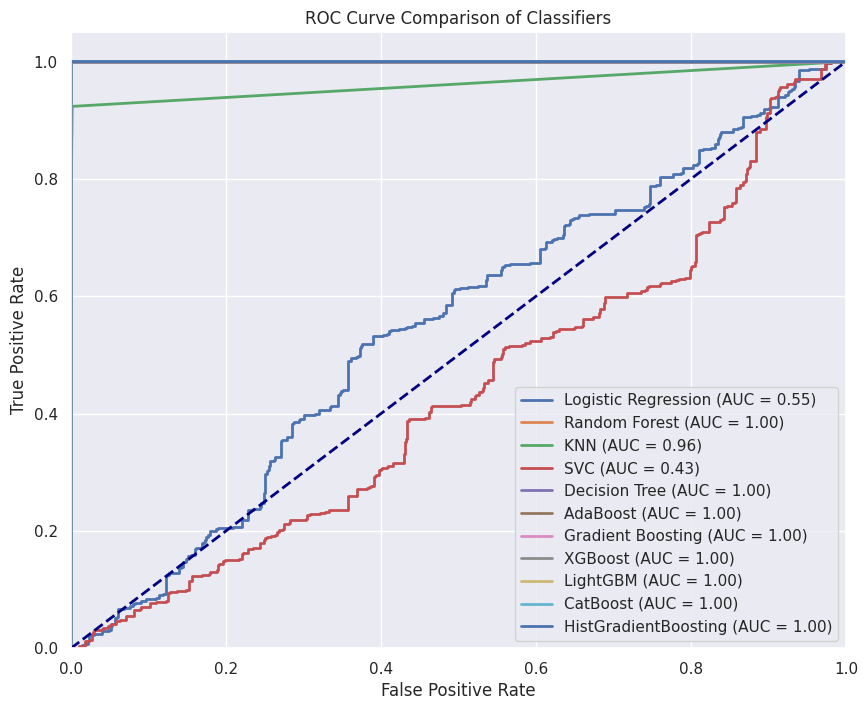

In [233]:
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc

plt.figure(figsize=(10, 8))

models = {
    "Logistic Regression": lr_model,
    "Random Forest": rf_model,
    "KNN": knn_model,
    "SVC": svc_model,
    "Decision Tree": dt_model,
    "AdaBoost": ada_model,
    "Gradient Boosting": gb_model,
    "XGBoost": xgb_model,
    "LightGBM": lgbm_model,
    "CatBoost": cat_model,
    "HistGradientBoosting": hgb_model
}

for name, model in models.items():
    # SVC gibi bazı modellerde predict_proba yoktur, decision_function kullanılır
    if hasattr(model, "predict_proba"):
        y_scores = model.predict_proba(X_test)[:, 1]
    else:
        y_scores = model.decision_function(X_test)
    
    fpr, tpr, _ = roc_curve(y_test, y_scores)
    roc_auc = auc(fpr, tpr)
    
    plt.plot(fpr, tpr, lw=2, label=f'{name} (AUC = {roc_auc:.2f})')

plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')  # Diagonal line
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve Comparison of Classifiers')
plt.legend(loc="lower right")
plt.grid(True)
plt.show()


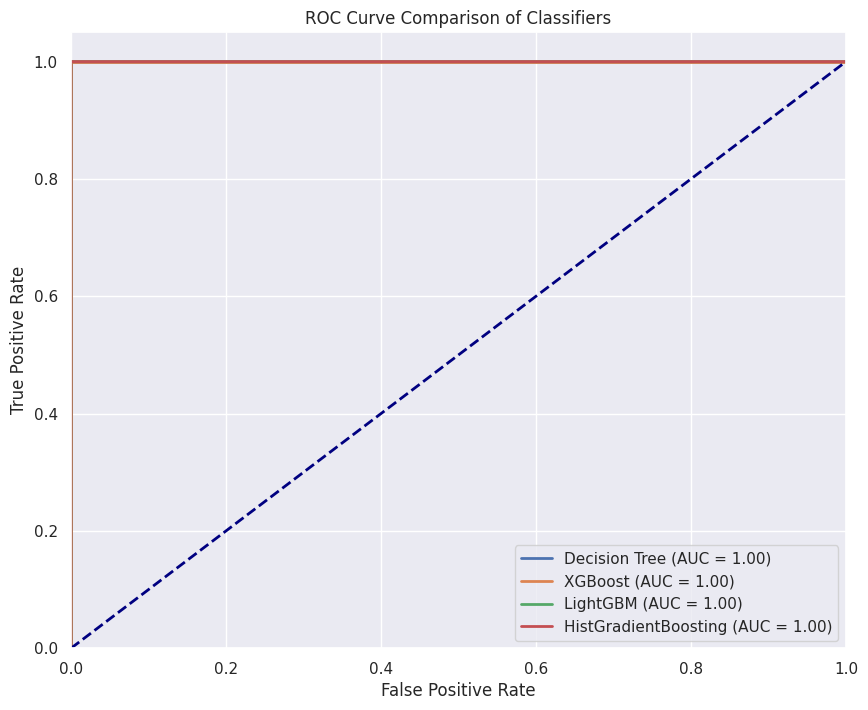

In [234]:
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc

plt.figure(figsize=(10, 8))

models = {
    "Decision Tree": dt_model,
    "XGBoost": xgb_model,
    "LightGBM": lgbm_model,
    "HistGradientBoosting": hgb_model
}

for name, model in models.items():
    # SVC gibi bazı modellerde predict_proba yoktur, decision_function kullanılır
    if hasattr(model, "predict_proba"):
        y_scores = model.predict_proba(X_test)[:, 1]
    else:
        y_scores = model.decision_function(X_test)
    
    fpr, tpr, _ = roc_curve(y_test, y_scores)
    roc_auc = auc(fpr, tpr)
    
    plt.plot(fpr, tpr, lw=2, label=f'{name} (AUC = {roc_auc:.2f})')

plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')  # Diagonal line
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve Comparison of Classifiers')
plt.legend(loc="lower right")
plt.grid(True)
plt.show()

# Shap Value Analysis

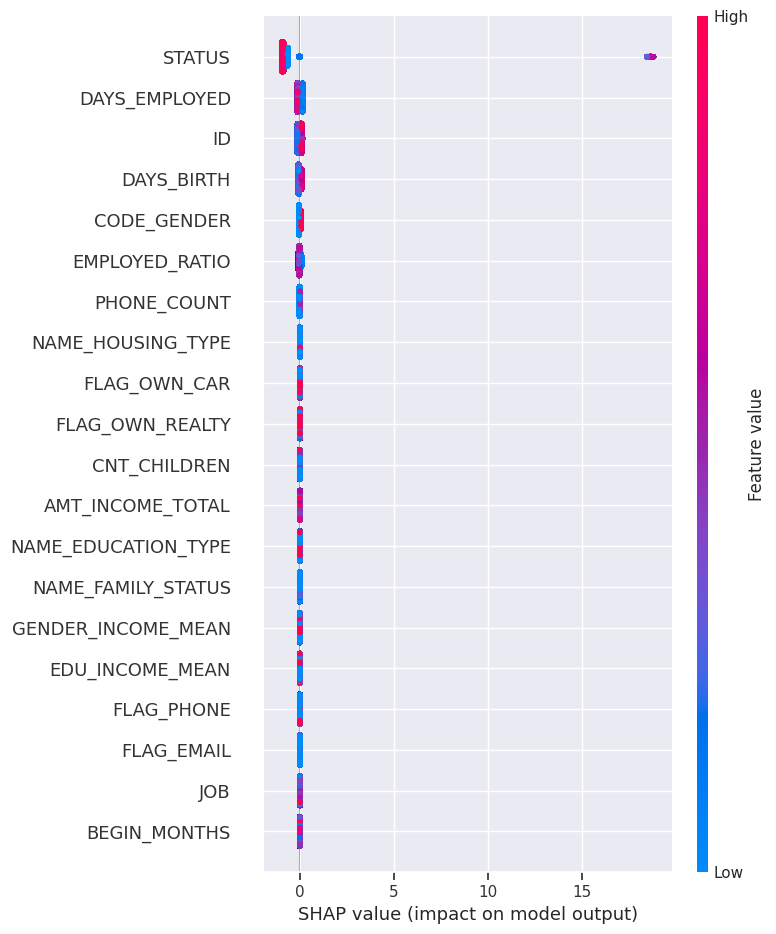

In [235]:
import shap

explainer = shap.TreeExplainer(xgb_model)
shap_values = explainer.shap_values(X_test)
shap.summary_plot(shap_values, X_test)

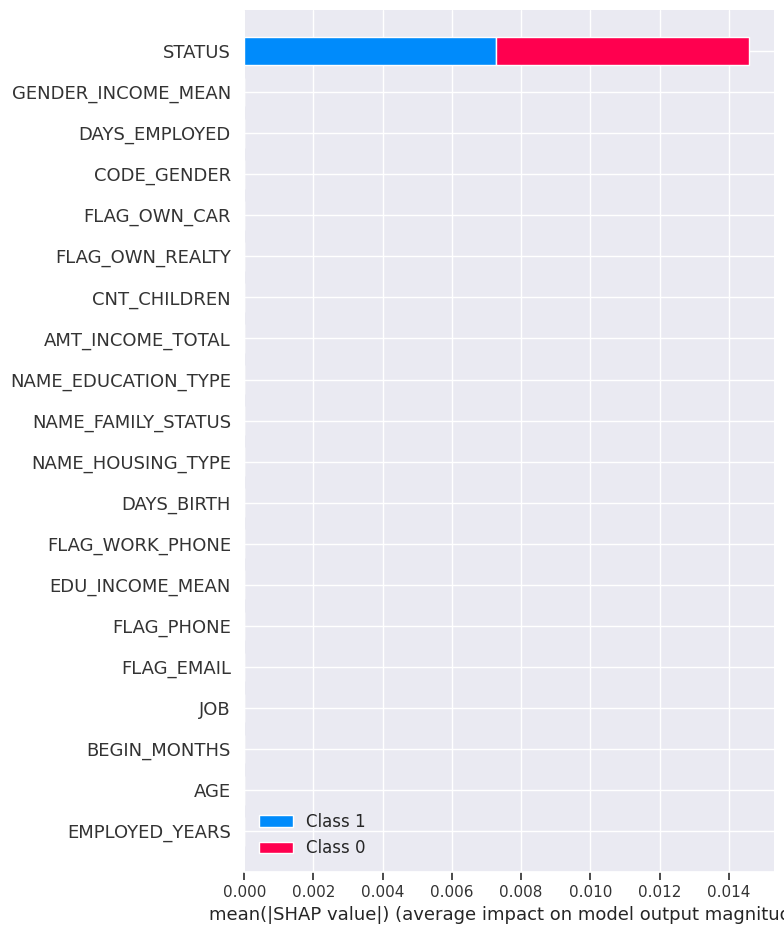

In [236]:
import shap

explainer = shap.TreeExplainer(dt_model)
shap_values = explainer.shap_values(X_test)
shap.summary_plot(shap_values, X_test)

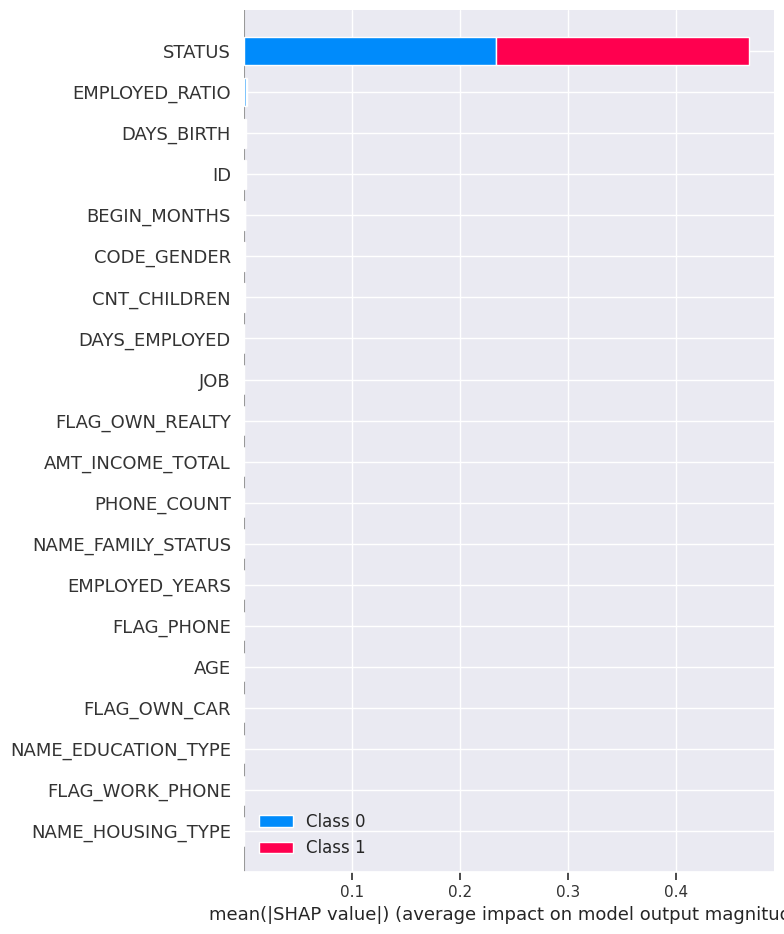

In [237]:
import shap

explainer = shap.TreeExplainer(lgbm_model)
shap_values = explainer.shap_values(X_test)
shap.summary_plot(shap_values, X_test)

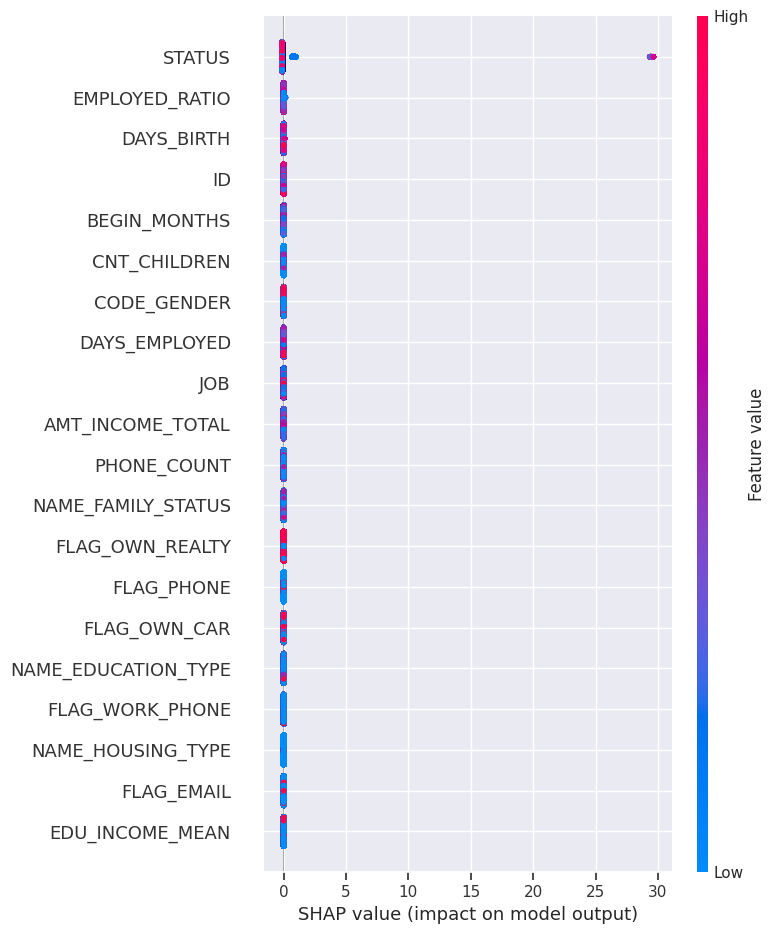

In [238]:
import shap

explainer = shap.TreeExplainer(hgb_model)
shap_values = explainer.shap_values(X_test)
shap.summary_plot(shap_values, X_test)

**Status** has a big role of this data becasue feature importance and shap value analysis show that how much important.  

# Hiperparametre Ayarlaması - Decision Tree

🌲 Decision Tree Classifier Results (Tuned):
Training Time   : 0.9099 seconds
Prediction Time : 0.0303 seconds
Accuracy        : 0.8191
Recall          : 0.6844
Precision       : 0.0139
F1 Score        : 0.0272
AUC Score       : 0.7520


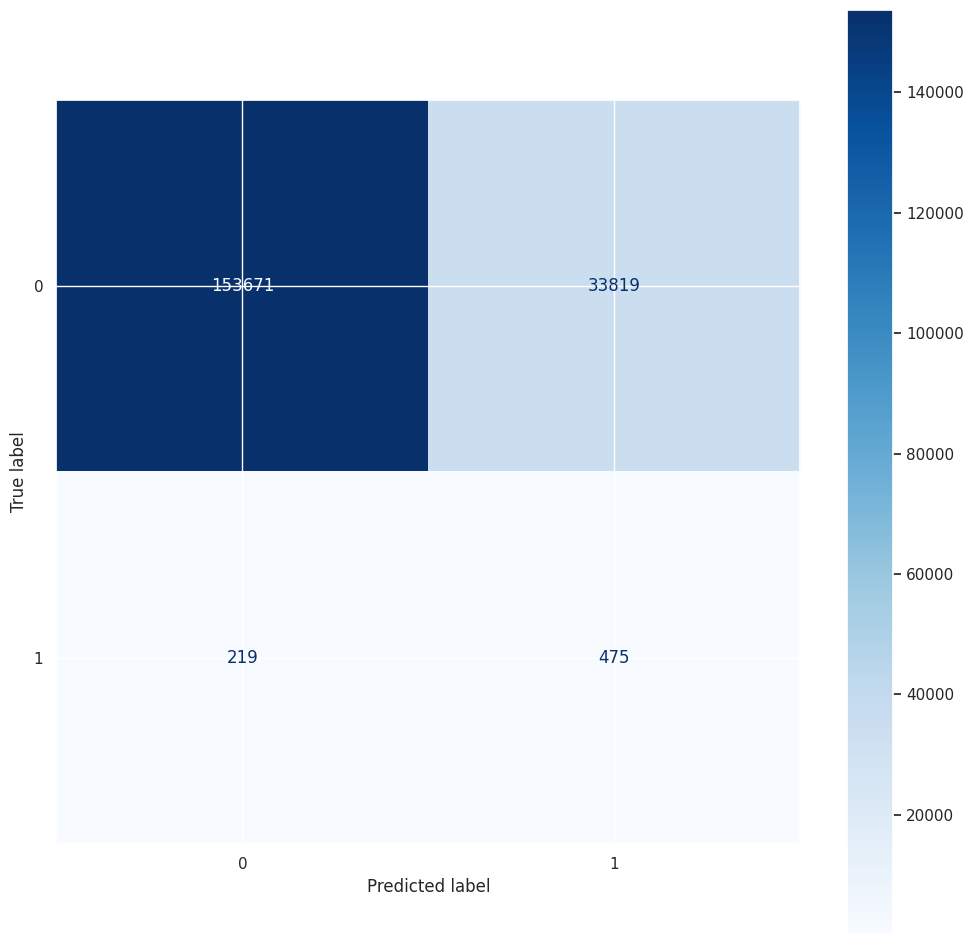

In [239]:
import time
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import (accuracy_score, recall_score, precision_score,
                             f1_score, roc_auc_score,
                             confusion_matrix, ConfusionMatrixDisplay)

# Hiperparametre ayarları
dt_model = DecisionTreeClassifier(
    criterion='gini',        # 'entropy' de denenebilir
    max_depth=5,             # ağacın maksimum derinliği
    min_samples_split=10,    # düğüm bölünmeden önce en az 10 örnek olmalı
    min_samples_leaf=5,      # yaprakta en az 5 örnek olmalı
    max_features='sqrt',     # her bölünmede değerlendirilecek özellik sayısı
    class_weight='balanced', # dengesiz sınıflar varsa sınıf ağırlığını dengeler
    random_state=46
)

# Model eğitimi
start_train = time.time()
dt_model.fit(X_train, y_train)
end_train = time.time()
training_time = end_train - start_train

# Tahmin
start_pred = time.time()
dt_pred = dt_model.predict(X_test)
end_pred = time.time()
prediction_time = end_pred - start_pred

# Performans çıktıları
print("🌲 Decision Tree Classifier Results (Tuned):")
print(f"Training Time   : {training_time:.4f} seconds")
print(f"Prediction Time : {prediction_time:.4f} seconds")
print(f"Accuracy        : {accuracy_score(y_test, dt_pred):.4f}")
print(f"Recall          : {recall_score(y_test, dt_pred):.4f}")
print(f"Precision       : {precision_score(y_test, dt_pred):.4f}")
print(f"F1 Score        : {f1_score(y_test, dt_pred):.4f}")
print(f"AUC Score       : {roc_auc_score(y_test, dt_pred):.4f}")

# Confusion Matrix
cm = confusion_matrix(y_test, dt_pred)
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
disp.plot(cmap="Blues")


# Hiperparametre Ayarlaması - XGBClassifier

Fitting 5 folds for each of 25 candidates, totalling 125 fits
🔧 En iyi hiperparametreler:
{'subsample': 0.6, 'reg_lambda': 1, 'reg_alpha': 0, 'n_estimators': 200, 'max_depth': 5, 'learning_rate': 0.01, 'gamma': 0, 'colsample_bytree': 1.0}
GridSearch Training Time: 314.59 saniye

🌲 XGBoost Classifier with RandomizedSearchCV:
Training Time   : 314.5888 seconds
Prediction Time : 0.1236 seconds
Accuracy        : 1.0
Recall          : 1.0
Precision       : 1.0
F1 Score        : 1.0
AUC Score       : 1.0


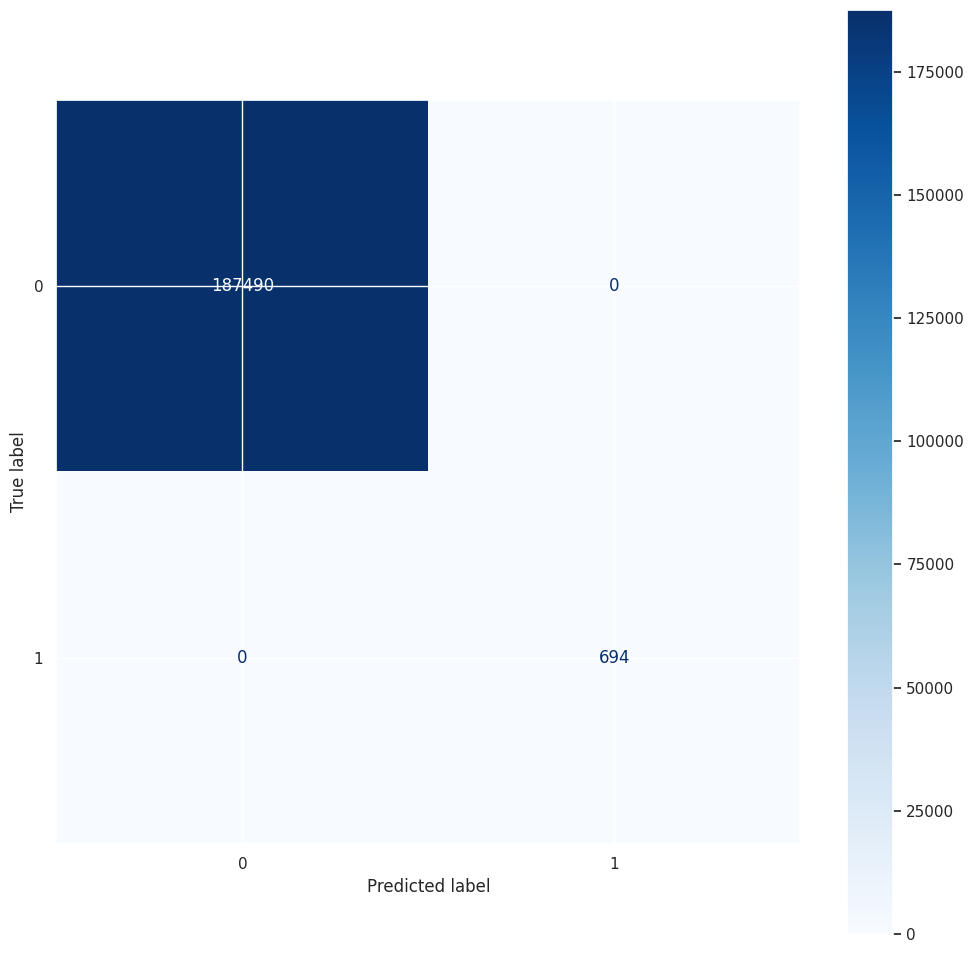

In [240]:
import time
import numpy as np
from sklearn.metrics import (accuracy_score, recall_score, precision_score,
                             f1_score, roc_auc_score, confusion_matrix,
                             ConfusionMatrixDisplay)
from sklearn.model_selection import RandomizedSearchCV
from xgboost import XGBClassifier

# 1. Hiperparametre alanı tanımı
param_dist = {
    'n_estimators': [100, 200, 300, 500],
    'max_depth': [3, 4, 5, 6, 7, 10],
    'learning_rate': [0.01, 0.05, 0.1, 0.2],
    'subsample': [0.6, 0.8, 1.0],
    'colsample_bytree': [0.6, 0.8, 1.0],
    'gamma': [0, 1, 5],
    'reg_alpha': [0, 0.1, 1],
    'reg_lambda': [1, 1.5, 2]
}

# 2. RandomizedSearchCV kurulumu
xgb = XGBClassifier(random_state=46, use_label_encoder=False, eval_metric='logloss')
random_search = RandomizedSearchCV(
    estimator=xgb,
    param_distributions=param_dist,
    n_iter=25,              # 25 farklı kombinasyon deneyecek
    scoring='roc_auc',      # Değerlendirme metriği
    cv=5,                   # 5-fold CV
    verbose=1,
    random_state=42,
    n_jobs=-1
)

# 3. Model eğitimi
start_train = time.time()
random_search.fit(X_train, y_train)
end_train = time.time()

# En iyi modeli al
best_xgb = random_search.best_estimator_
print("🔧 En iyi hiperparametreler:")
print(random_search.best_params_)
print(f"GridSearch Training Time: {round(end_train - start_train, 2)} saniye\n")

# 4. Tahmin ve metrikler
start_pred = time.time()
xgb_pred = best_xgb.predict(X_test)
end_pred = time.time()

print("🌲 XGBoost Classifier with RandomizedSearchCV:")
print(f"Training Time   : {round(end_train - start_train, 4)} seconds")
print(f"Prediction Time : {round(end_pred - start_pred, 4)} seconds")
print(f"Accuracy        : {round(accuracy_score(y_test, xgb_pred), 4)}")
print(f"Recall          : {round(recall_score(y_test, xgb_pred), 4)}")
print(f"Precision       : {round(precision_score(y_test, xgb_pred), 4)}")
print(f"F1 Score        : {round(f1_score(y_test, xgb_pred), 4)}")
print(f"AUC Score       : {round(roc_auc_score(y_test, best_xgb.predict_proba(X_test)[:,1]), 4)}")

# 5. Confusion Matrix
cm = confusion_matrix(y_test, xgb_pred)
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
disp.plot(cmap='Blues')


# Hiperparametre Ayarlaması - LGBMClassifier

Fitting 5 folds for each of 25 candidates, totalling 125 fits
[LightGBM] [Info] Number of positive: 1014, number of negative: 278572
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.110609 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1390
[LightGBM] [Info] Number of data points in the train set: 279586, number of used features: 23
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.003627 -> initscore=-5.615774
[LightGBM] [Info] Start training from score -5.615774
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[Lig

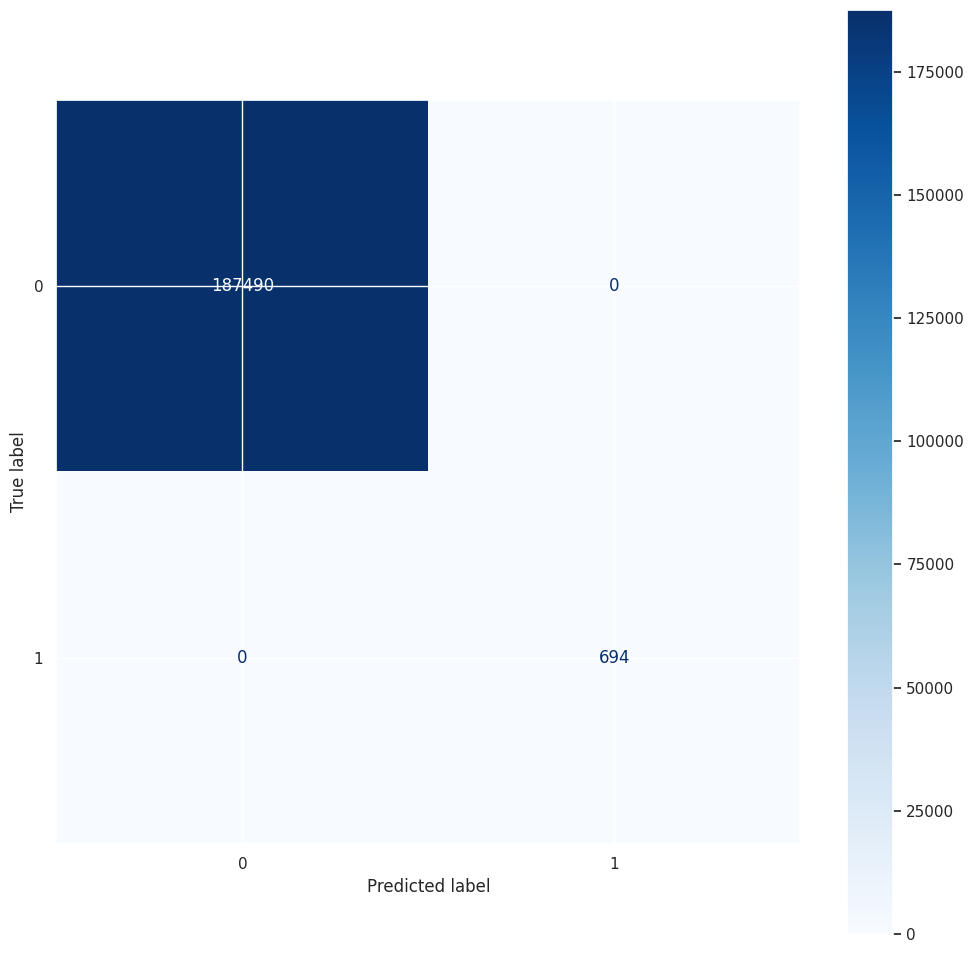

In [241]:
import time
import numpy as np
from sklearn.model_selection import RandomizedSearchCV
from lightgbm import LGBMClassifier
from sklearn.metrics import (accuracy_score, recall_score, precision_score,
                             f1_score, roc_auc_score, confusion_matrix,
                             ConfusionMatrixDisplay)
param_dist = {
    'num_leaves': [20, 31, 50, 70],
    'max_depth': [-1, 5, 10, 15],
    'learning_rate': [0.01, 0.05, 0.1, 0.2],
    'n_estimators': [100, 200, 300, 500],
    'min_child_samples': [10, 20, 30, 50],
    'subsample': [0.6, 0.8, 1.0],
    'colsample_bytree': [0.6, 0.8, 1.0]
}

lgbm = LGBMClassifier(random_state=46)
random_search = RandomizedSearchCV(
    estimator=lgbm,
    param_distributions=param_dist,
    n_iter=25,                # 25 farklı kombinasyon denenir
    scoring='roc_auc',
    cv=5,
    verbose=1,
    n_jobs=-1,
    random_state=42
)
# Eğitim süresi
start_train = time.time()
random_search.fit(X_train, y_train)
end_train = time.time()

# En iyi modeli al
best_lgbm = random_search.best_estimator_
print("🔧 En iyi hiperparametreler:")
print(random_search.best_params_)
print(f"GridSearch Training Time: {round(end_train - start_train, 2)} saniye\n")

# Tahmin süresi
start_pred = time.time()
lgbm_pred = best_lgbm.predict(X_test)
end_pred = time.time()

# Performans çıktıları
print("🌿 LightGBM Classifier with RandomizedSearchCV:")
print(f"Training Time   : {round(end_train - start_train, 4)} seconds")
print(f"Prediction Time : {round(end_pred - start_pred, 4)} seconds")
print(f"Accuracy        : {round(accuracy_score(y_test, lgbm_pred), 4)}")
print(f"Recall          : {round(recall_score(y_test, lgbm_pred), 4)}")
print(f"Precision       : {round(precision_score(y_test, lgbm_pred), 4)}")
print(f"F1 Score        : {round(f1_score(y_test, lgbm_pred), 4)}")
print(f"AUC Score       : {round(roc_auc_score(y_test, best_lgbm.predict_proba(X_test)[:,1]), 4)}")
cm = confusion_matrix(y_test, lgbm_pred)
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
disp.plot(cmap='Blues')


# Hiperparametre Ayarlaması - HistGradientBoostingClassifier

Fitting 5 folds for each of 25 candidates, totalling 125 fits
🔧 En iyi hiperparametreler:
{'min_samples_leaf': 20, 'max_iter': 300, 'max_depth': 15, 'max_bins': 255, 'learning_rate': 0.2, 'l2_regularization': 1}
Training Time: 107.5358 seconds

HistGradientBoostingClassifier (with RandomizedSearchCV):
Prediction Time: 0.7015 seconds
Accuracy        : 1.0
Recall          : 1.0
Precision       : 1.0
F1 Score        : 1.0
AUC Score       : 1.0


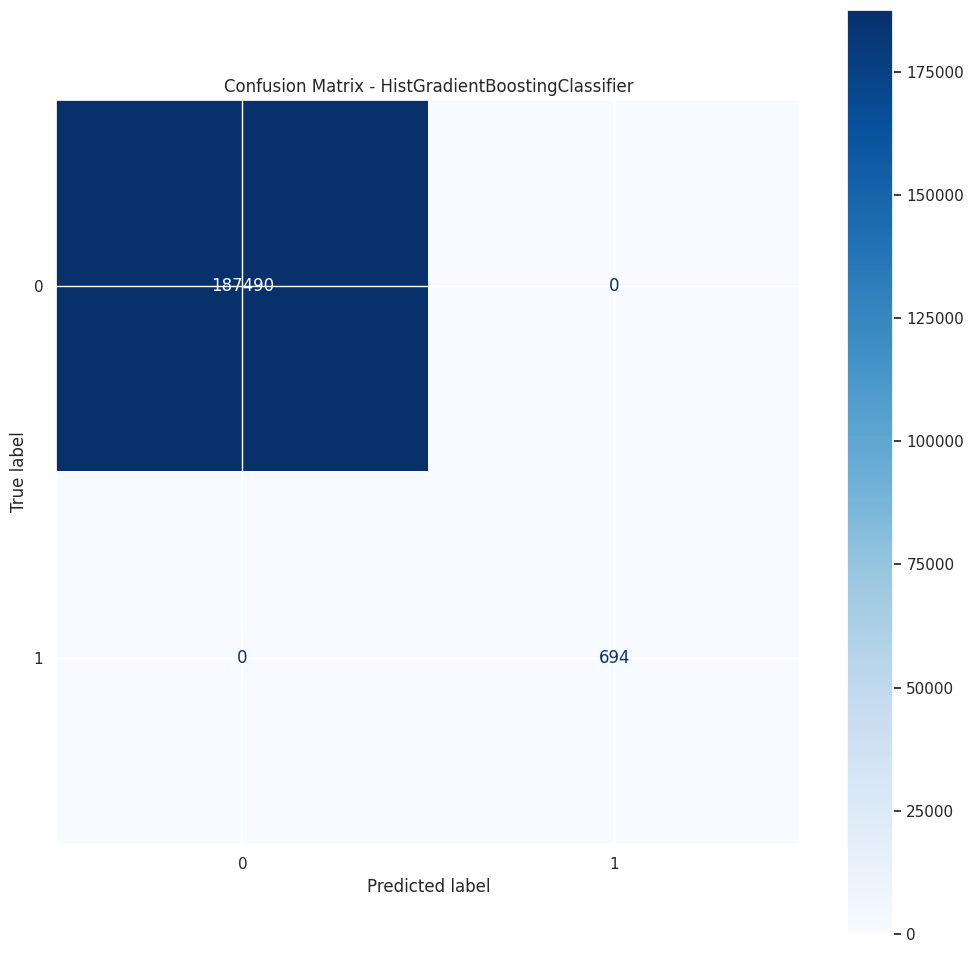

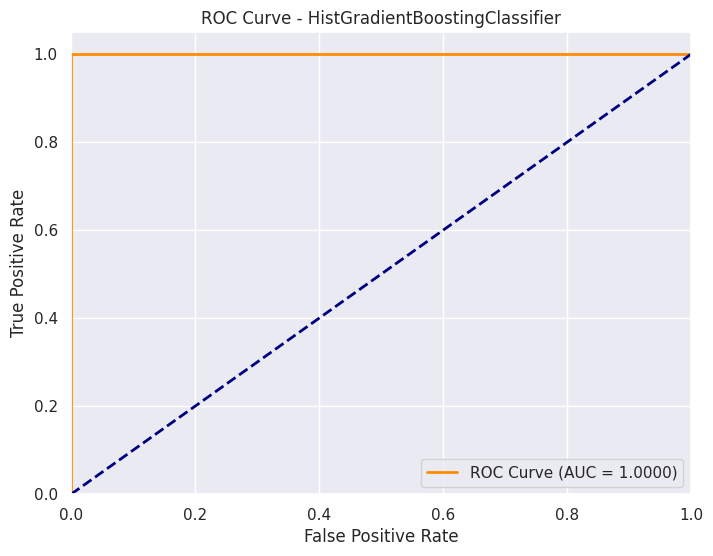

In [242]:
from sklearn.ensemble import HistGradientBoostingClassifier
from sklearn.model_selection import RandomizedSearchCV
from sklearn.metrics import (accuracy_score, recall_score, precision_score,
                             f1_score, roc_auc_score, roc_curve, auc,
                             confusion_matrix, ConfusionMatrixDisplay)
import matplotlib.pyplot as plt
import time
import numpy as np
param_dist = {
    'learning_rate': [0.01, 0.05, 0.1, 0.2],
    'max_iter': [100, 200, 300, 500],
    'max_depth': [None, 5, 10, 15],
    'min_samples_leaf': [10, 20, 30, 50],
    'l2_regularization': [0, 0.1, 1, 10],
    'max_bins': [255, 512, 1024]
}
hgb = HistGradientBoostingClassifier(random_state=46)

random_search = RandomizedSearchCV(
    estimator=hgb,
    param_distributions=param_dist,
    n_iter=25,
    scoring='roc_auc',
    cv=5,
    random_state=42,
    n_jobs=-1,
    verbose=1
)
# Eğitim süresi ölçümü
start_train = time.time()
random_search.fit(X_train, y_train)
end_train = time.time()

# En iyi model
best_hgb = random_search.best_estimator_
print("🔧 En iyi hiperparametreler:")
print(random_search.best_params_)
print(f"Training Time: {round(end_train - start_train, 4)} seconds\n")

# Tahmin süresi
start_pred = time.time()
hgb_pred = best_hgb.predict(X_test)
hgb_pred_proba = best_hgb.predict_proba(X_test)[:, 1]
end_pred = time.time()
print("HistGradientBoostingClassifier (with RandomizedSearchCV):")
print(f"Prediction Time: {round(end_pred - start_pred, 4)} seconds")
print(f"Accuracy        : {round(accuracy_score(y_test, hgb_pred), 4)}")
print(f"Recall          : {round(recall_score(y_test, hgb_pred), 4)}")
print(f"Precision       : {round(precision_score(y_test, hgb_pred), 4)}")
print(f"F1 Score        : {round(f1_score(y_test, hgb_pred), 4)}")
print(f"AUC Score       : {round(roc_auc_score(y_test, hgb_pred_proba), 4)}")
# Confusion Matrix
cm = confusion_matrix(y_test, hgb_pred)
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
disp.plot(cmap='Blues')
plt.title("Confusion Matrix - HistGradientBoostingClassifier")
plt.show()

# ROC Curve
fpr, tpr, thresholds = roc_curve(y_test, hgb_pred_proba)
roc_auc = auc(fpr, tpr)

plt.figure(figsize=(8,6))
plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC Curve (AUC = {roc_auc:.4f})')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0,1])
plt.ylim([0,1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve - HistGradientBoostingClassifier')
plt.legend(loc='lower right')
plt.grid(True)
plt.show()


# HistGradientBoostingClassifier - Optuna ile Hiperparametre Optimizasyonu

[I 2025-05-20 16:07:58,112] A new study created in memory with name: no-name-7cbdbb28-bd66-4c43-afa8-0fe492a859c1
[I 2025-05-20 16:08:27,655] Trial 0 finished with value: 1.0 and parameters: {'learning_rate': 0.09386986443563251, 'max_iter': 449, 'max_depth': 13, 'min_samples_leaf': 49, 'l2_regularization': 7.849812434402676, 'max_bins': 246}. Best is trial 0 with value: 1.0.
[I 2025-05-20 16:08:36,603] Trial 1 finished with value: 1.0 and parameters: {'learning_rate': 0.18333439482783861, 'max_iter': 416, 'max_depth': 13, 'min_samples_leaf': 34, 'l2_regularization': 3.270822197120081, 'max_bins': 117}. Best is trial 0 with value: 1.0.
[I 2025-05-20 16:09:08,981] Trial 2 finished with value: 1.0 and parameters: {'learning_rate': 0.03322221212344714, 'max_iter': 476, 'max_depth': 7, 'min_samples_leaf': 18, 'l2_regularization': 3.5854274604603464, 'max_bins': 250}. Best is trial 0 with value: 1.0.
[I 2025-05-20 16:09:16,974] Trial 3 finished with value: 1.0 and parameters: {'learning_rat

🔧 En iyi hiperparametreler (Optuna):
{'learning_rate': 0.09386986443563251, 'max_iter': 449, 'max_depth': 13, 'min_samples_leaf': 49, 'l2_regularization': 7.849812434402676, 'max_bins': 246}
Training Time: 312.9341 seconds

HistGradientBoostingClassifier (Optuna):
Prediction Time: 3.9929 seconds
Accuracy        : 1.0
Recall          : 1.0
Precision       : 1.0
F1 Score        : 1.0
AUC Score       : 1.0


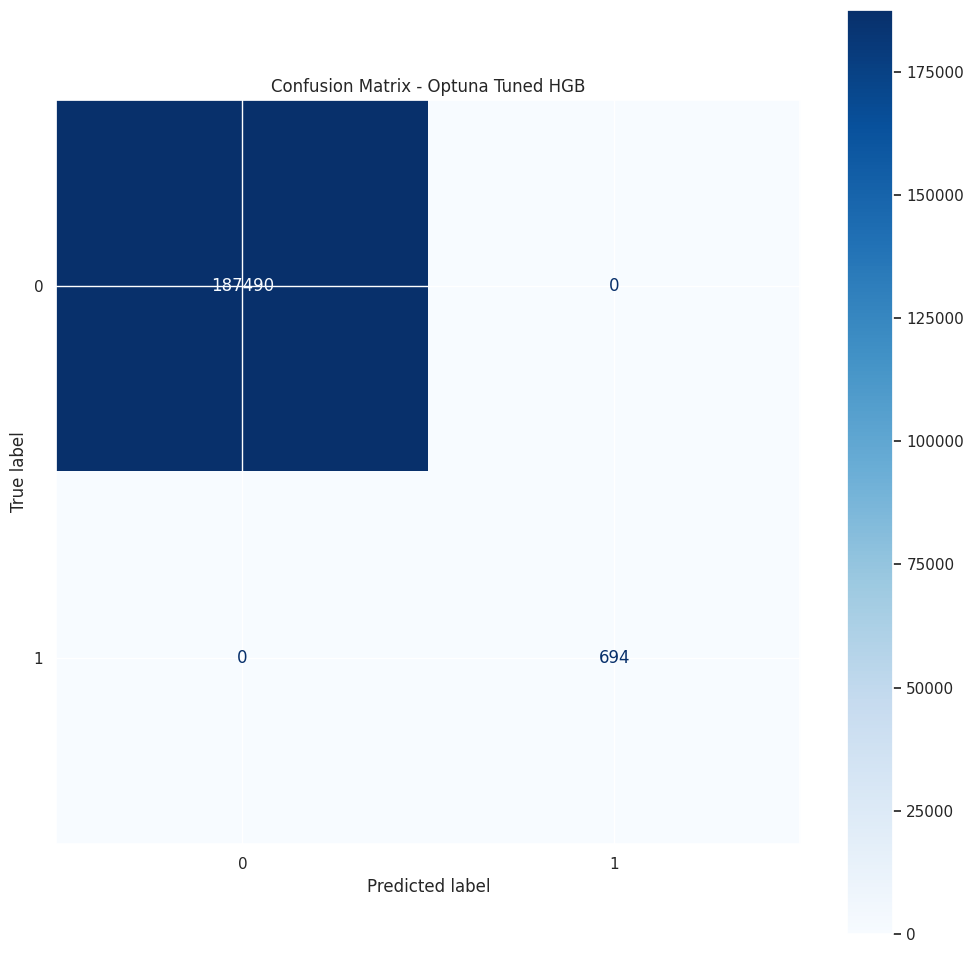

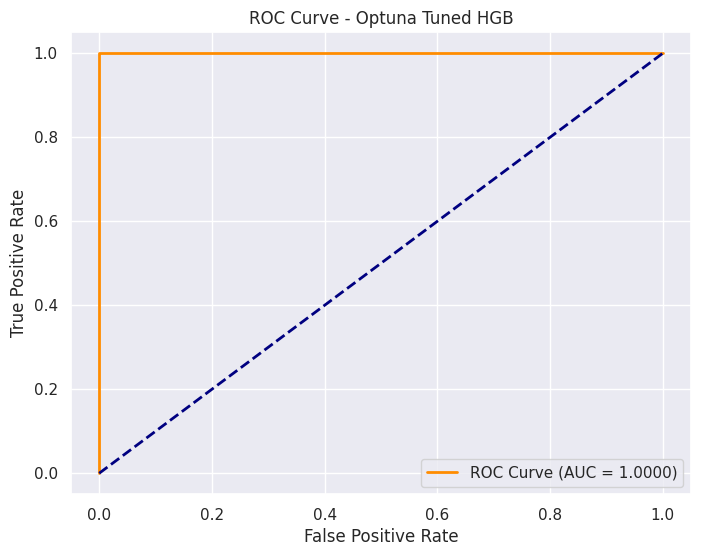

In [244]:
import optuna
from sklearn.ensemble import HistGradientBoostingClassifier
from sklearn.model_selection import cross_val_score
from sklearn.metrics import (accuracy_score, recall_score, precision_score,
                             f1_score, roc_auc_score, roc_curve, auc,
                             confusion_matrix, ConfusionMatrixDisplay)
import matplotlib.pyplot as plt
import time

def objective(trial):
    params = {
        "learning_rate": trial.suggest_float("learning_rate", 0.01, 0.2),
        "max_iter": trial.suggest_int("max_iter", 100, 500),
        "max_depth": trial.suggest_int("max_depth", 3, 15),
        "min_samples_leaf": trial.suggest_int("min_samples_leaf", 10, 50),
        "l2_regularization": trial.suggest_float("l2_regularization", 0.0, 10.0),
        "max_bins": trial.suggest_int("max_bins", 64, 255)  # ✅ sadece geçerli aralık
    }

    model = HistGradientBoostingClassifier(**params, random_state=46)
    return cross_val_score(model, X_train, y_train, scoring="roc_auc", cv=3).mean()

study = optuna.create_study(direction="maximize")
start_train = time.time()
study.optimize(objective, n_trials=25, timeout=300)
end_train = time.time()

best_params = study.best_params
print("🔧 En iyi hiperparametreler (Optuna):")
print(best_params)
print(f"Training Time: {round(end_train - start_train, 4)} seconds\n")

best_hgb = HistGradientBoostingClassifier(**best_params, random_state=46)
best_hgb.fit(X_train, y_train)

start_pred = time.time()
hgb_pred = best_hgb.predict(X_test)
hgb_pred_proba = best_hgb.predict_proba(X_test)[:, 1]
end_pred = time.time()

print("HistGradientBoostingClassifier (Optuna):")
print(f"Prediction Time: {round(end_pred - start_pred, 4)} seconds")
print(f"Accuracy        : {round(accuracy_score(y_test, hgb_pred), 4)}")
print(f"Recall          : {round(recall_score(y_test, hgb_pred), 4)}")
print(f"Precision       : {round(precision_score(y_test, hgb_pred), 4)}")
print(f"F1 Score        : {round(f1_score(y_test, hgb_pred), 4)}")
print(f"AUC Score       : {round(roc_auc_score(y_test, hgb_pred_proba), 4)}")

cm = confusion_matrix(y_test, hgb_pred)
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
disp.plot(cmap='Blues')
plt.title("Confusion Matrix - Optuna Tuned HGB")
plt.show()

fpr, tpr, _ = roc_curve(y_test, hgb_pred_proba)
roc_auc = auc(fpr, tpr)
plt.figure(figsize=(8,6))
plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC Curve (AUC = {roc_auc:.4f})')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve - Optuna Tuned HGB')
plt.legend(loc='lower right')
plt.grid(True)
plt.show()

* max_bins sınırlandırması HistGradientBoostingClassifier’a özgüdür, LightGBM gibi modellerde bu 1024'e kadar çıkabilir.

* Kaggle’da çalıştırırken n_trials değerini düşük tutarsan (örneğin 25 gibi), işlem süresi daha kısa olur. Daha yüksek doğruluk istiyorsan 50 veya 100'e kadar çıkarabilirsin.

* timeout=300 saniye ile sınırlandırılmış durumda; daha uzun süre tanımlayarak daha fazla deneme yapılmasını sağlayabilirsin.

| Amaç                     | Optuna          | BayesSearchCV    |
| ------------------------ | --------------- | ---------------- |
| Daha akıllı öğrenme      | ✅               | ✅                |
| Daha fazla esneklik      | ✅               | ❌ (sınırlı yapı) |
| Daha kısa kod            | ❌               | ✅                |
| Kaggle’da hızlı deneme   | ✅ (düşük trial) | ✅                |
| GridSearch'e benzer yapı | ❌               | ✅                |


💡 Tavsiye:
Kaggle Notebook çalıştırırken Optuna / BayesSearchCV için:

n_iter=25 ideal.

Cross-validation katı cv=3 yeterlidir.

Daha uzun ve kapsamlı tuning için lokal sistemde eğitim, sonra Kaggle’a model yükleme daha verimlidir.

| Özellik            | Optuna                                | BayesSearchCV (skopt)         |
| ------------------ | ------------------------------------- | ----------------------------- |
| Arama Stratejisi   | Akıllı (Tree-structured Parzen Est.)  | Gaussian Process / Surrogate  |
| Kullanım Kolaylığı | Daha esnek (ama biraz daha fazla kod) | GridSearchCV benzeri, kolay   |
| Kaggle Uyum        | Evet                                  | Evet                          |
| GPU Desteği        | GPU destekli modellerde işe yarar     | Evet, ama model özelinde      |
| Performans         | Daha iyi arama sonuçları              | İyi, ama daha sınırlı öğrenme |

| Teknik                             | Açıklama                                      |
| ---------------------------------- | --------------------------------------------- |
| `n_trials=25` gibi düşük tut       | 25–50 arasında başla, sonra artırırsın        |
| `timeout=300` (5 dakika sınırı)    | Zaman bazlı kısıtlama ile daha hızlı sonlanır |
| `direction='maximize'`             | ROC-AUC gibi metriklerde kullanılmalı         |
| `pruner=SuccessiveHalvingPruner()` | Kötü modeller erken durur, süreci hızlandırır |


# HistGradientBoostingClassifier - Bayesian Optimization (BayesSearchCV) ile Hiperparametre

🔧 En iyi hiperparametreler (BayesSearchCV):
OrderedDict([('l2_regularization', 4.101039588533139), ('learning_rate', 0.08846938749167613), ('max_bins', 240), ('max_depth', 7), ('max_iter', 368), ('min_samples_leaf', 27)])
Training Time: 385.0175 seconds

HistGradientBoostingClassifier (BayesSearchCV):
Prediction Time: 2.7362 seconds
Accuracy        : 1.0
Recall          : 1.0
Precision       : 1.0
F1 Score        : 1.0
AUC Score       : 1.0


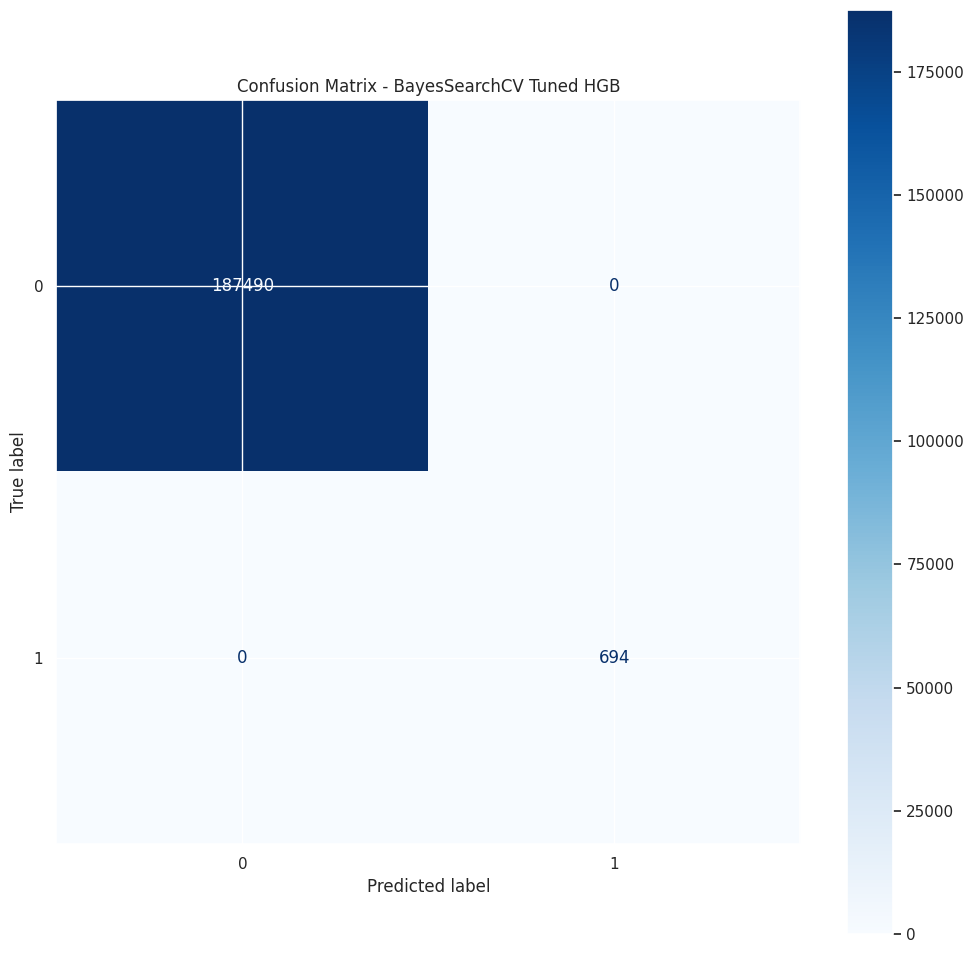

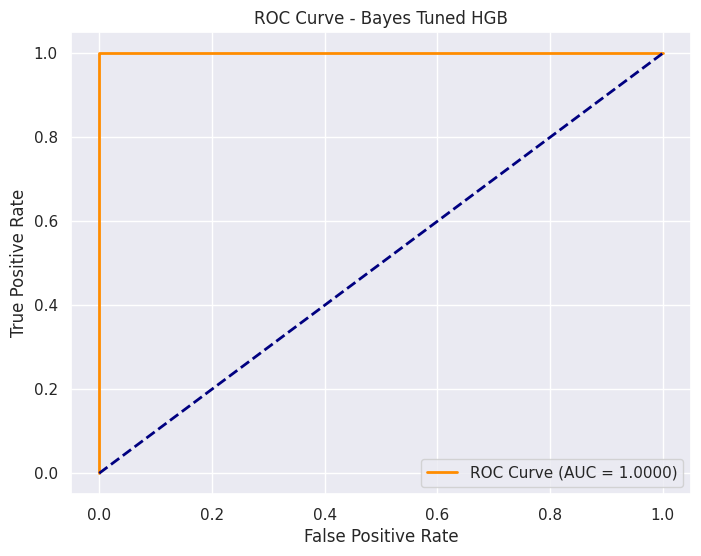

In [246]:
from sklearn.ensemble import HistGradientBoostingClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import (accuracy_score, recall_score, precision_score,
                             f1_score, roc_auc_score, roc_curve, auc,
                             confusion_matrix, ConfusionMatrixDisplay)
from skopt import BayesSearchCV
from skopt.space import Real, Integer
import matplotlib.pyplot as plt
import time

# Parametre aralıklarını düzeltilmiş şekilde tanımlıyoruz:
param_space = {
    'learning_rate': Real(0.01, 0.2, prior='log-uniform'),
    'max_iter': Integer(100, 500),
    'max_depth': Integer(3, 15),
    'min_samples_leaf': Integer(10, 50),
    'l2_regularization': Real(0.0, 10.0),
    'max_bins': Integer(32, 255)  # ✅ 255 sınırına uyan aralık
}

hgb = HistGradientBoostingClassifier(random_state=46)

# BayesSearchCV tanımlama
opt = BayesSearchCV(
    estimator=hgb,
    search_spaces=param_space,
    scoring='roc_auc',
    n_iter=25,
    cv=3,
    random_state=42,
    n_jobs=-1,
    verbose=0
)

# Eğitim süresi ölçümü
start_train = time.time()
opt.fit(X_train, y_train)
end_train = time.time()

# En iyi model
best_hgb = opt.best_estimator_
print("🔧 En iyi hiperparametreler (BayesSearchCV):")
print(opt.best_params_)
print(f"Training Time: {round(end_train - start_train, 4)} seconds\n")

# Tahmin süresi
start_pred = time.time()
hgb_pred = best_hgb.predict(X_test)
hgb_pred_proba = best_hgb.predict_proba(X_test)[:, 1]
end_pred = time.time()

# Performans metrikleri
print("HistGradientBoostingClassifier (BayesSearchCV):")
print(f"Prediction Time: {round(end_pred - start_pred, 4)} seconds")
print(f"Accuracy        : {round(accuracy_score(y_test, hgb_pred), 4)}")
print(f"Recall          : {round(recall_score(y_test, hgb_pred), 4)}")
print(f"Precision       : {round(precision_score(y_test, hgb_pred), 4)}")
print(f"F1 Score        : {round(f1_score(y_test, hgb_pred), 4)}")
print(f"AUC Score       : {round(roc_auc_score(y_test, hgb_pred_proba), 4)}")

# Confusion Matrix
cm = confusion_matrix(y_test, hgb_pred)
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
disp.plot(cmap='Blues')
plt.title("Confusion Matrix - BayesSearchCV Tuned HGB")
plt.show()

# ROC Curve
fpr, tpr, _ = roc_curve(y_test, hgb_pred_proba)
roc_auc = auc(fpr, tpr)
plt.figure(figsize=(8,6))
plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC Curve (AUC = {roc_auc:.4f})')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve - Bayes Tuned HGB')
plt.legend(loc='lower right')
plt.grid(True)
plt.show()

💡 Ek Öneriler:

* n_iter=25: Bayes optimizasyonun süresi ve performansı için kritik. Bunu 50–100’e çıkarırsan daha iyi sonuç alabilirsin ama süre uzar.

* cv=3: Kısa sürede sonuç almak için 3 fold kullandık. Daha doğru sonuç için cv=5 veya cv=10 denenebilir.

* verbose=0: Gereksiz çıktıyı engeller. Debug için verbose=1 yapabilirsin.

**Final Değerlendirmesi, Sonuçlar Ve Tavsiyeler**

* %0.4 ile başlangıçta 1962 olan riskli müşteri sayısı 694'e düşürülmüştür.(%0.14)

* 1268 müşteri doğru yere konumlandırılmış ve bu müşterilere kredi verilmesi veri bilimi takımı tarafından ilgili bankacılık departmanına tavsiye edilmiştir.

* 537666 müşteri verisi olan bu projede 1268 müşteri kazanımı elde edilmiştir.(%0.00235834)(%0.0023)

* Yüzde olarak küçük gözükse de çalıştığımız veri seti banka ile ilgili bir veri olduğu için müşterilerin kazanımı ve doğru değerlendirilmesi oldukça önemlidir.Bir aylık veri seti olduğu varsaydığımızda her ay böyle proje çalışmaları yapıldığında 1 senede 1268*12=15.216 müşteri demektir.(+- %10 kayıp:13.694 kişi)

* Her projede aynı sayıları yakalamak ve tespit etmek mümkün değilse de ortalama bir senede 10.000 müşteri kazanımı çok anlamlı bir sayıdır.Bu müşteriler bize başvuran kredi başvurusu yapan ve sonuçlarını isteyen müşterilerdir ve biz bu müşterileri kazanmak için bir çalışma gerçekleştirdik.

* Özellik mühendisliği ve hiperparametre ayarlamaları sonuç vermemiştir.